In [1]:
library(xts)
library(ggplot2)

Loading required package: zoo

Attaching package: ‘zoo’

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



# Setting

In [2]:
dq = readline("Choose the data frequency:\na) Daily Data\nb) Weekly Data\n")
repeat{
    if ((dq == "a") | (dq == "b")){
        break
    }else{
        dq = readline("Please choose one of the options above\n")
    }
}
cat("Choose the file direction:\na) 5 Full Sample\nb) 5 Full Sample (non oil)\nc) 10 Full Sample\nd) 10 Full Sample (non oil)\n")
if (dq == "a"){direction = "Data/Data D/"} else {direction = "Data/Data W/"}
file = readline()
repeat{
    if ((file == "a") | (file == "b") | (file == "c") | (file == "d")){
        if (file == "a"){
            file = paste0(direction,"5 Full Sample")
        }else if (file == "b"){
            file = paste0(direction,"5 Full Sample (non oil)")
        }else if (file == "c"){
            file = paste(direction,"10 Full Sample")
        }else{
            file = paste0(direction,"10 Full Sample (non oil)")
        }
        break
    }else{
        file = readline("Please choose one of the options above\n")
    }
}

cat("Choose training period of the portfolio:\n")
if (dq == "a"){
    repeat{
        tp = readline("a) 60 days\nb) 120 days\nb) 180 days\nb) 240 days\n")
        if ((tp == "a") | (tp == "b") | (tp == "c") | (tp == "d")){
            if (tp == "a"){
                tp = 60
            }else if (tp == "b"){
                tp = 120
            }else if (tp == "c"){
                tp = 180
            }else{
                tp = 240
            }
            break
        }else{
            tp = readline("Please choose one of the options above\n")
        }
    }
}else{
    repeat{
        tp = readline("a) 40 days\nb) 60 days\nc) 80 days\nc) 100 days\n")
        if ((tp == "a") | (tp == "b") | (tp == "c") | (tp == "d")){
            if (tp == "a"){
                tp = 40
            }else if (tp == "b"){
                tp = 60
            }else if (tp == "c"){
                tp = 80
            }else{
                tp = 100
            }
            break
        }else{
            tp = readline("Please choose one of the options above\n")
        }
    }
}

cat("Choose rebalance frequency of the portfolio\n")
if (dq == "a"){
    repeat{
        rf = readline("a) 1 day\nb) 5 days\n")
        if ((rf == "a") | (rf == "b")){
            if (rf == "a"){
                rf = 1
            }else{
                rf = 5
            }
            break
        }else{
            rf = readline("Please choose one of the options above")
        }
    }
}else{
    repeat{
        rf = readline("a) 1 week\nb) 4 weeks\n")
        if ((rf == "a") | (rf == "b")){
            if (rf == "a"){
                rf = 1
            }else{
                rf = 4
            }
            break
        }else{
            rf = readline("Please choose one of the options above")
        }
    }
} 

if (dq == "a"){
    sub1_year = 2003
    sub1_month = 8
    sub1_day = 29
    sub2_year = 2008
    sub2_month = 12
    sub2_day = 5
    sb1_year = 2003
    sb1_month = 9
    sb1_day = 1
    sb2_year = 2008
    sb2_month = 12
    sb2_day = 4
}else{
    sub1_year = 2003
    sub1_month = 8
    sub1_day = 27
    sub2_year = 2008
    sub2_month = 12
    sub2_day = 3
    sb1_year = 2003
    sb1_month = 9
    sb1_day = 3
    sb2_year = 2008
    sb2_month = 11
    sb2_day = 26
}

Choose the data frequency:
a) Daily Data
b) Weekly Data
a
Choose the file direction:
a) 5 Full Sample
b) 5 Full Sample (non oil)
c) 10 Full Sample
d) 10 Full Sample (non oil)
b
Choose training period of the portfolio:
a) 60 days
b) 120 days
b) 180 days
b) 240 days
c
Choose rebalance frequency of the portfolio
a) 1 day
b) 5 days
b


# Import Data

In [3]:
dnames.D <- dir(path = paste0("/Users/kevinhuang/Documents/Master's Thesis/", file))
for(i in 1:length(dnames.D)) {
  read.name <- paste0("/Users/kevinhuang/Documents/Master's Thesis/", file, "/", dnames.D[i])
  assign(x = dnames.D[i], value = eval(read.csv(read.name, stringsAsFactors = F,strip.white = T, header = T, na.strings="N.A.",fileEncoding = "BIG5")
  ))
}

# Calculating Return

In [4]:
for(i in 1:length(dnames.D)) {
  r.name <- eval(as.name(dnames.D[i]))
  return.v <- r.name[,2]
  assign(x = dnames.D[i], value = eval(cbind(r.name, "Return" = c(NA, log(return.v[-1]/return.v[-length(return.v)])))))
}

# Plot BDI

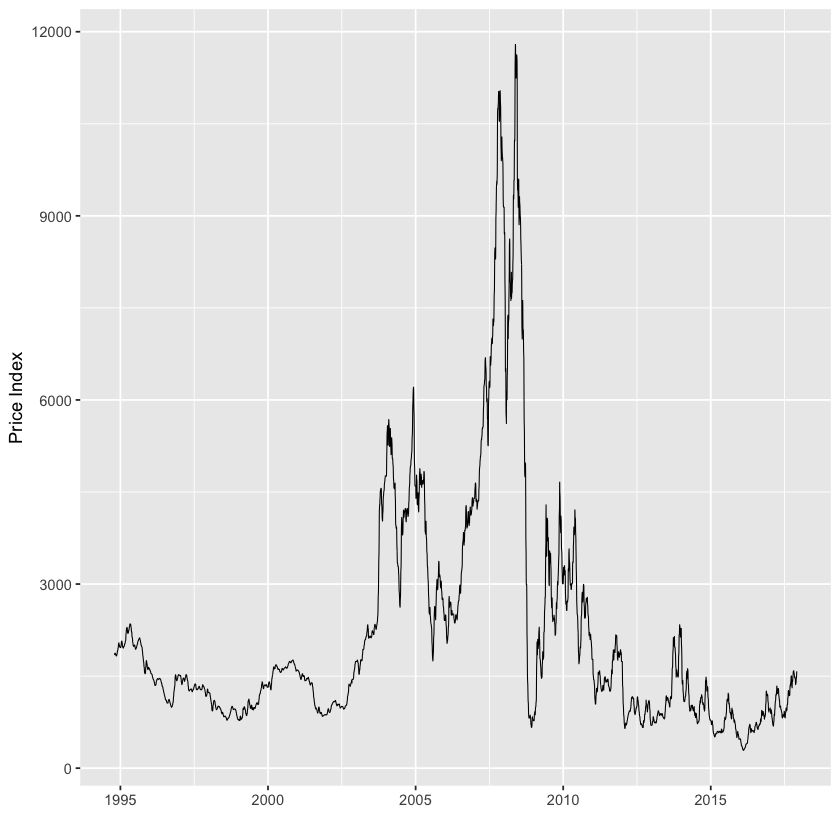

In [5]:
BDI <- cbind(Date = as.Date(BDI.csv$Date, "%Y/%m/%d"), BDI.csv[,2:3])
ggplot(data = BDI, aes(x = Date, y = Price.Index)) + geom_line(size = 0.3) + xlab("") + ylab("Price Index")

# In-Sample Test - Full Sample
## Contemporaneous Linear Regression

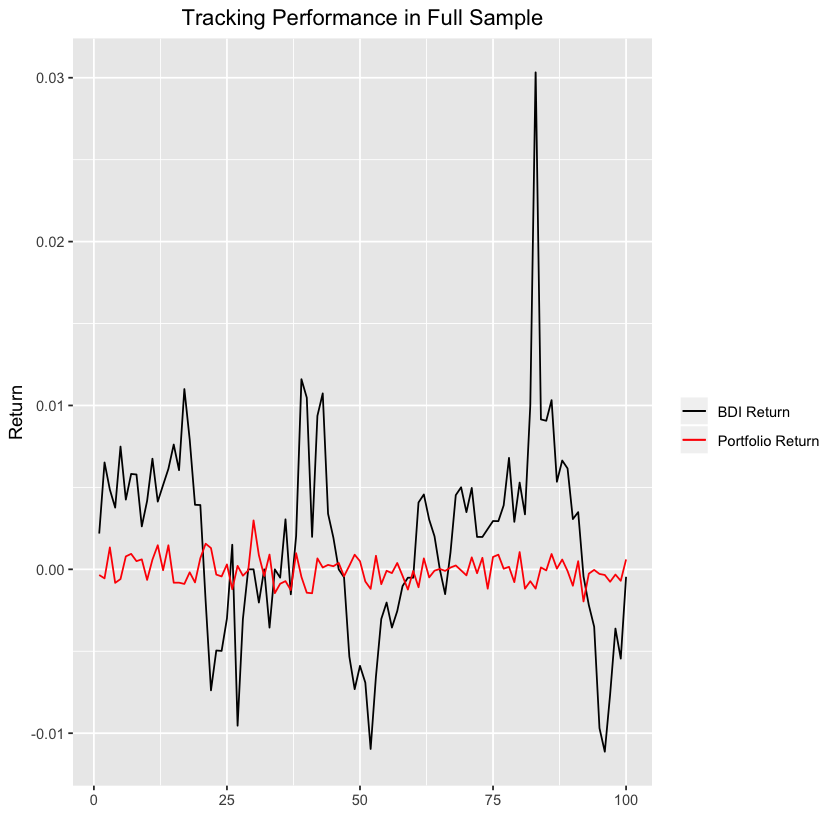

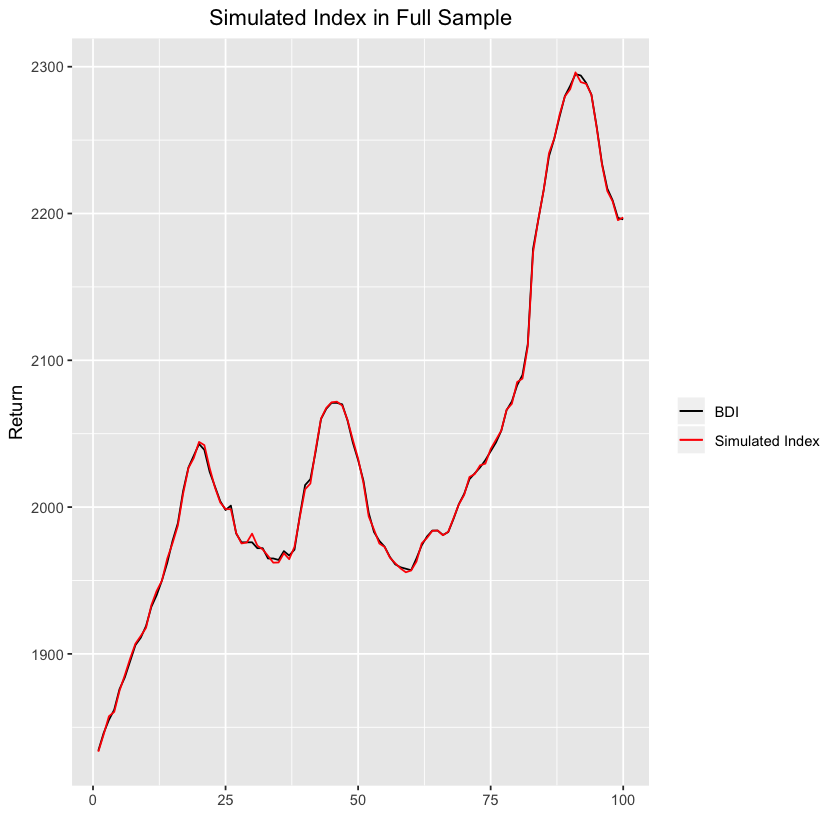

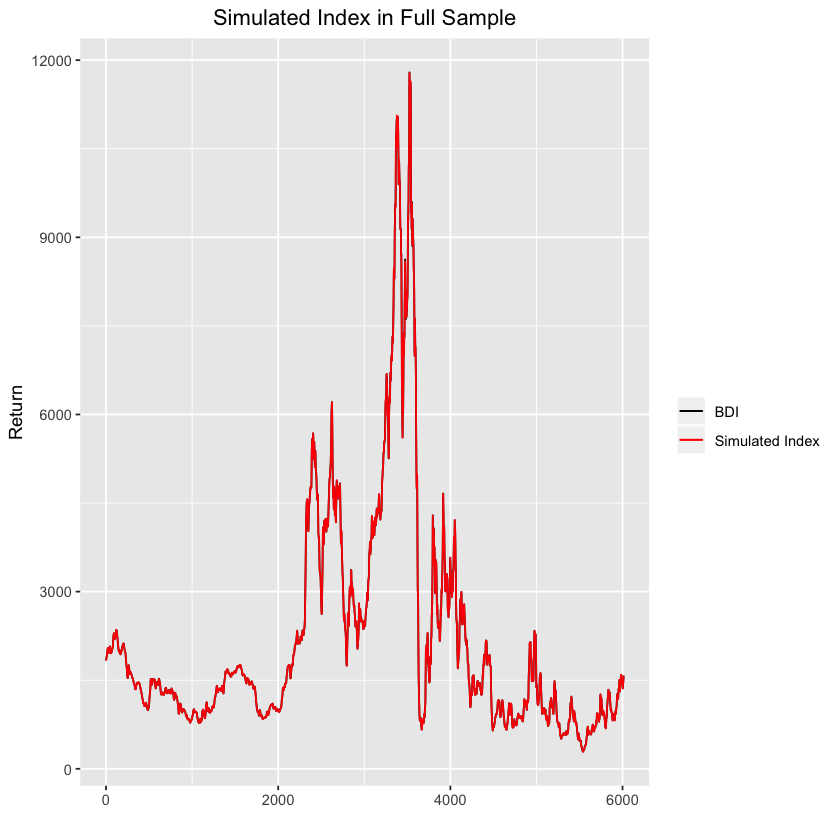

In [6]:
r.data <- NULL
for(i in 1:length(dnames.D)) {
  opr <- eval(as.name(dnames.D[i]))[,3]
  r.data <- cbind(r.data, opr)
}
r.data <- as.data.frame(r.data)
names(r.data) <- dnames.D
r.data <- r.data[-1,]
dimnames(r.data)[[1]] <- 1:dim(r.data)[1]
sBDI.csv <- BDI.csv[-1,2]

r.data.ts <- zoo(x = r.data, order.by = as.Date(BDI.csv$Date[2:dim(BDI.csv)[1]]))
r.data.b <- cbind("Date" = BDI.csv$Date[2:dim(BDI.csv)[1]], r.data)
n <- which(names(r.data) == "BDI.csv")

lm1 <- lm(formula = BDI.csv ~ ., data = r.data)
summary1 <- summary(lm1)
tr1 <- sd(lm1$fitted.values - r.data[,n])

df1 <- data.frame(Order = 1:length(21:dim(r.data)[1]), BDI.Return= r.data[21:dim(r.data)[1],n], Portfolio.Return = lm1$fitted.values[21:dim(r.data)[1]], BDI = sBDI.csv[21:dim(r.data)[1]], Simulated.Index = ((1+lm1$fitted.values)*sBDI.csv)[21:dim(r.data)[1]])
ggplot(data = df1[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df1[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df1, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

# Forecasting Linea Regression

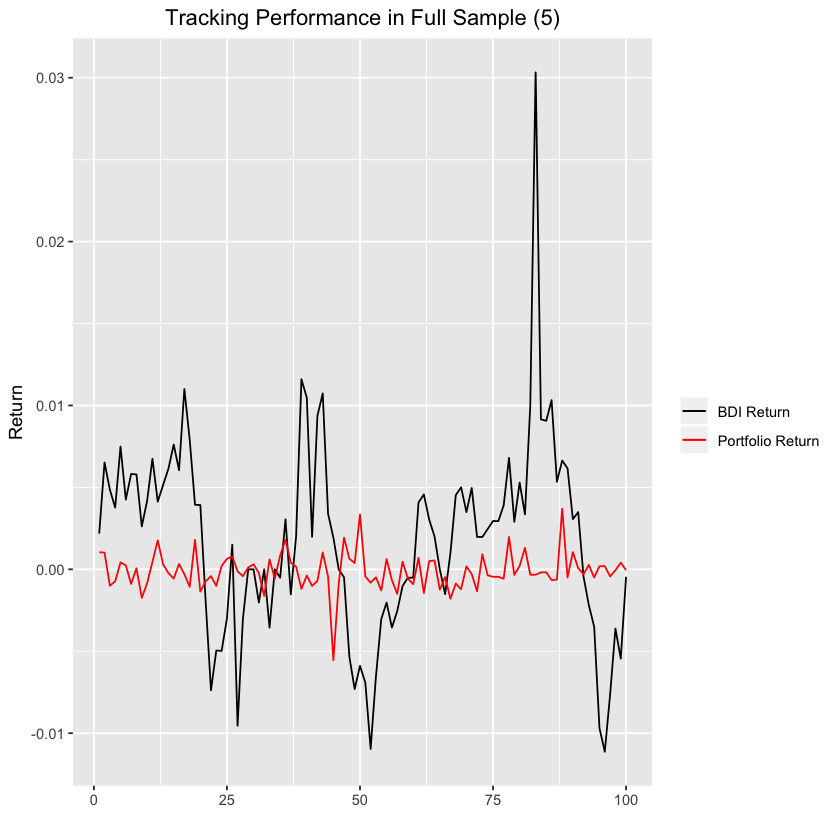

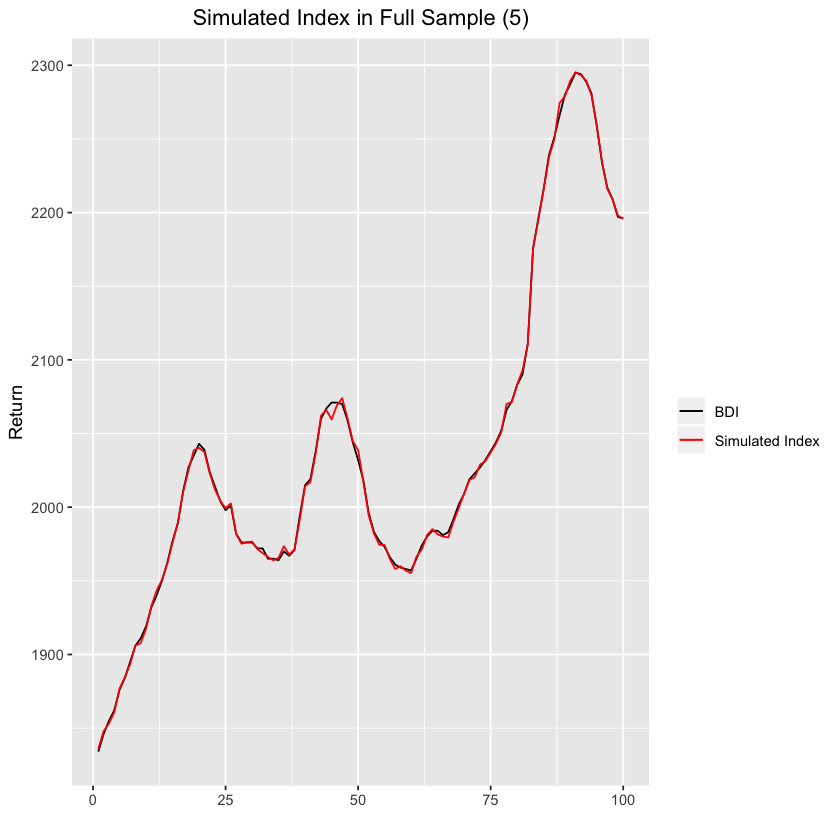

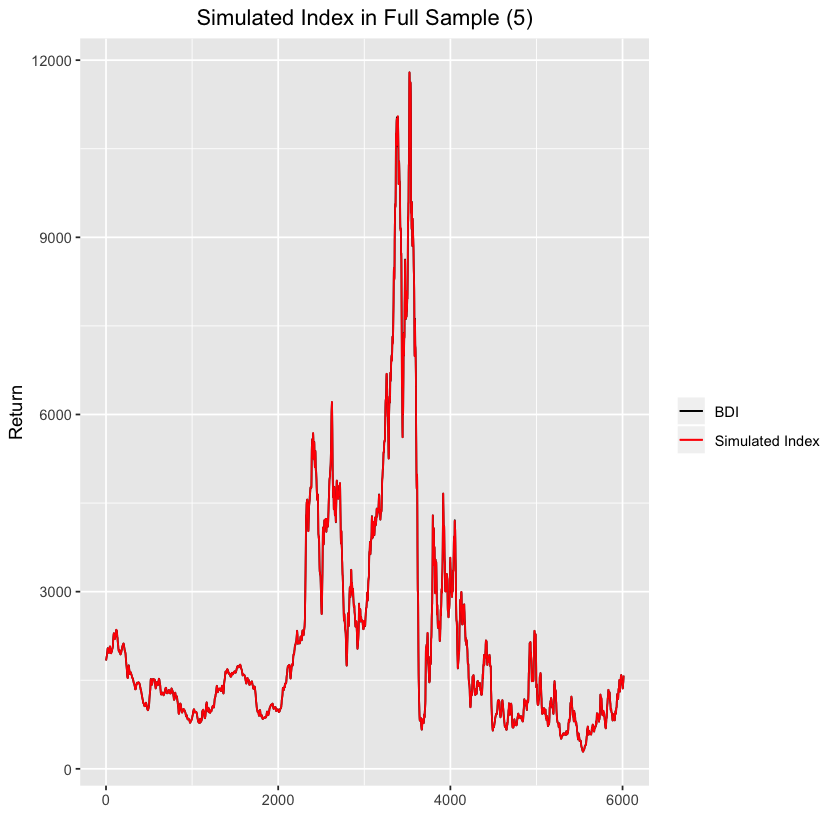

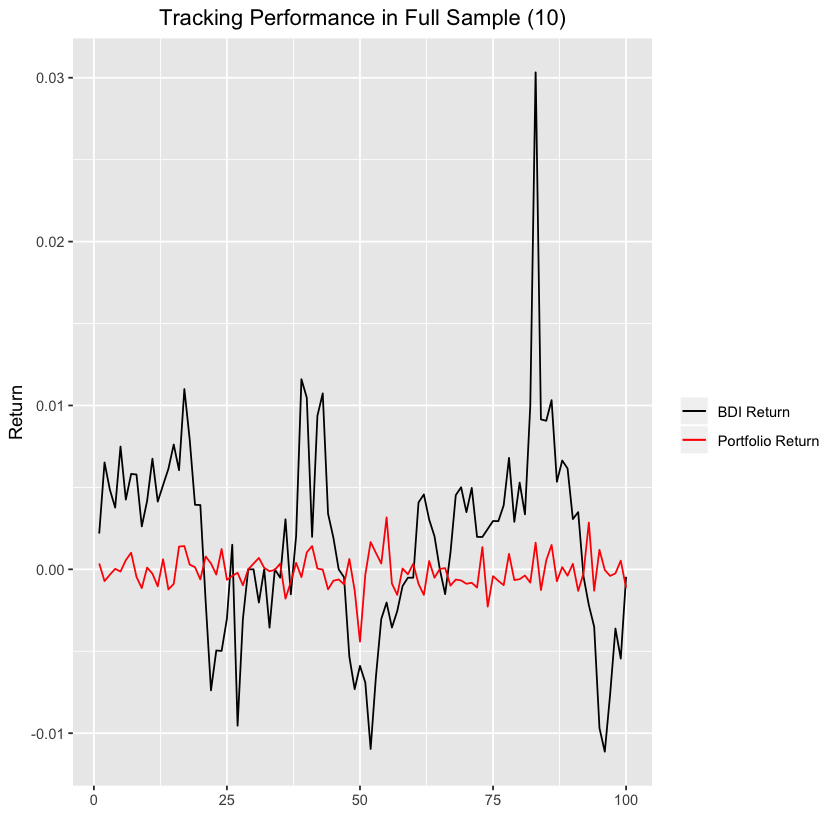

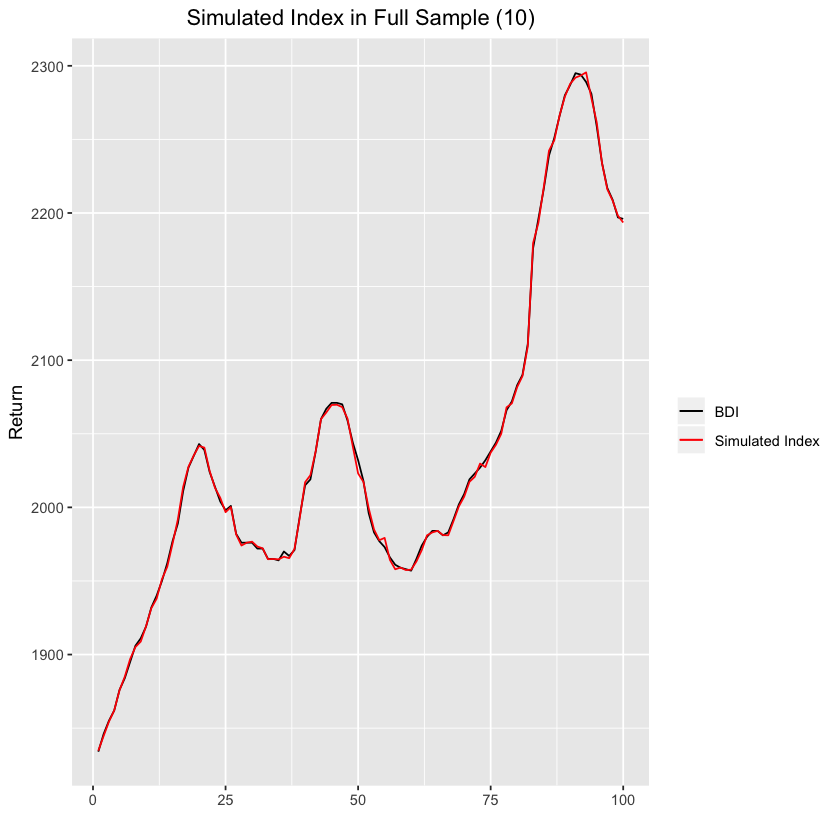

...

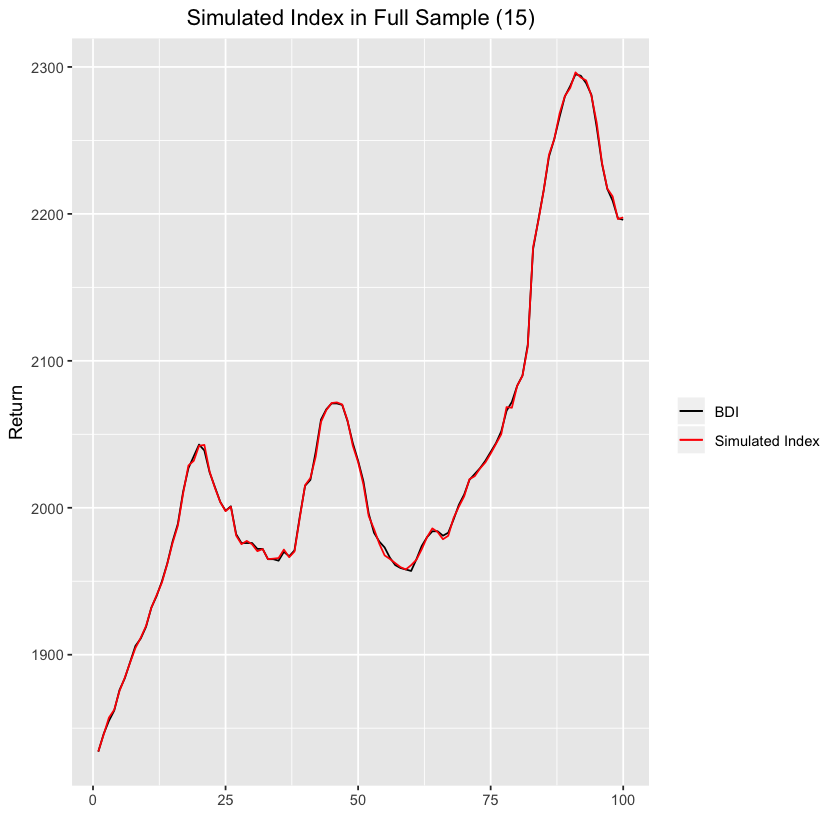

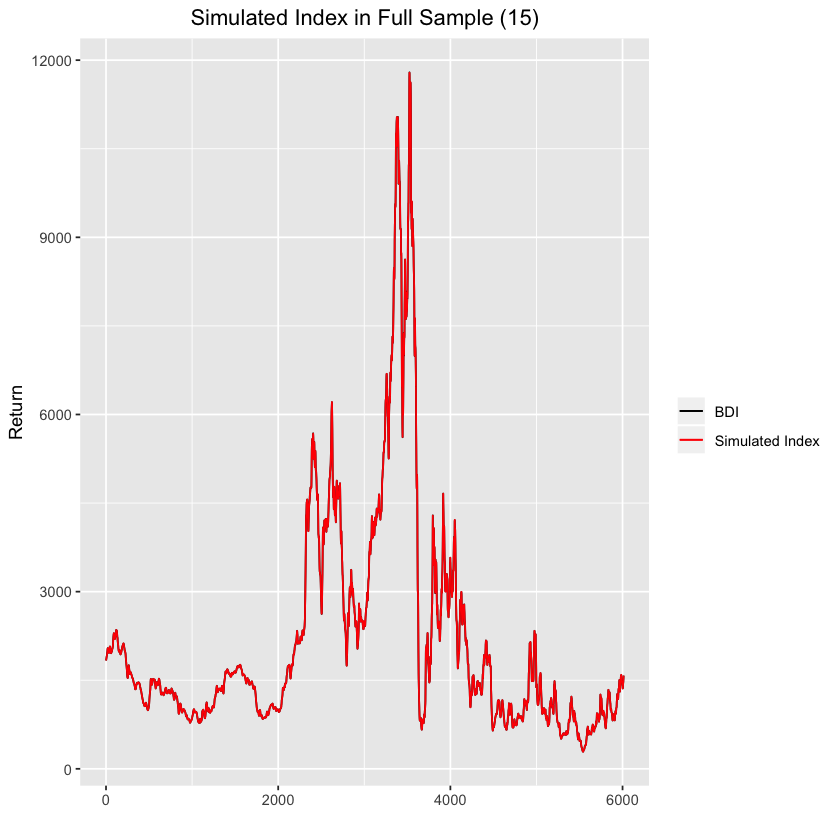

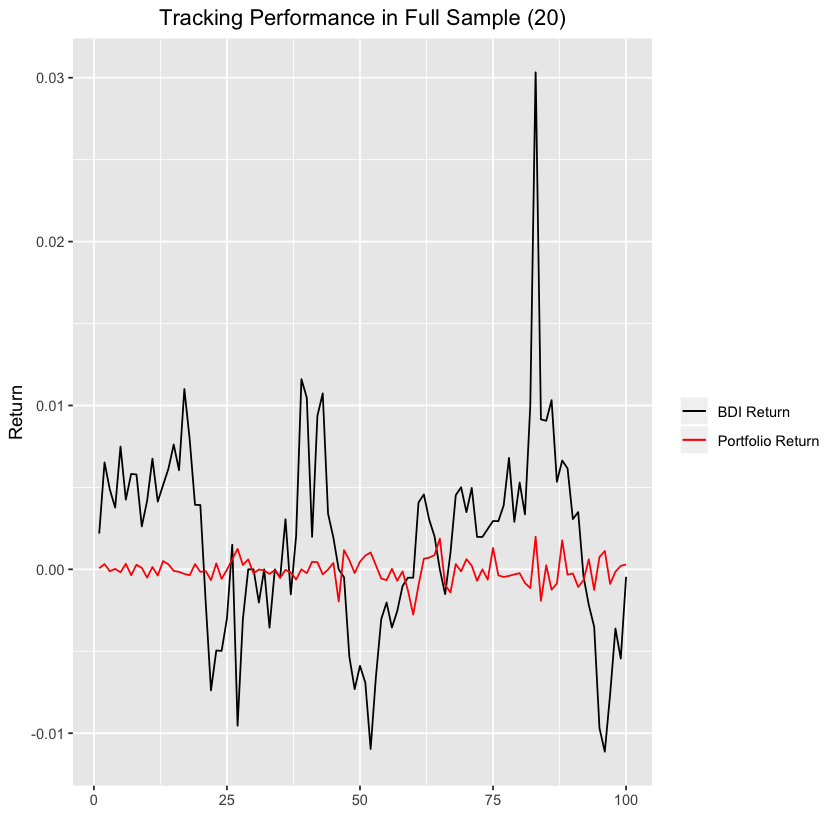

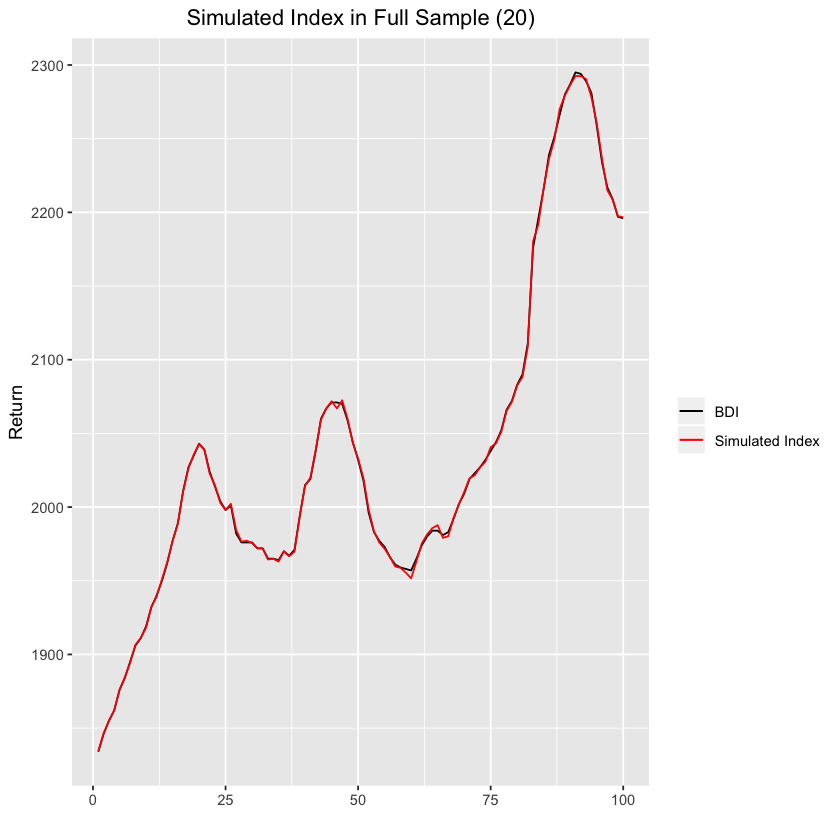

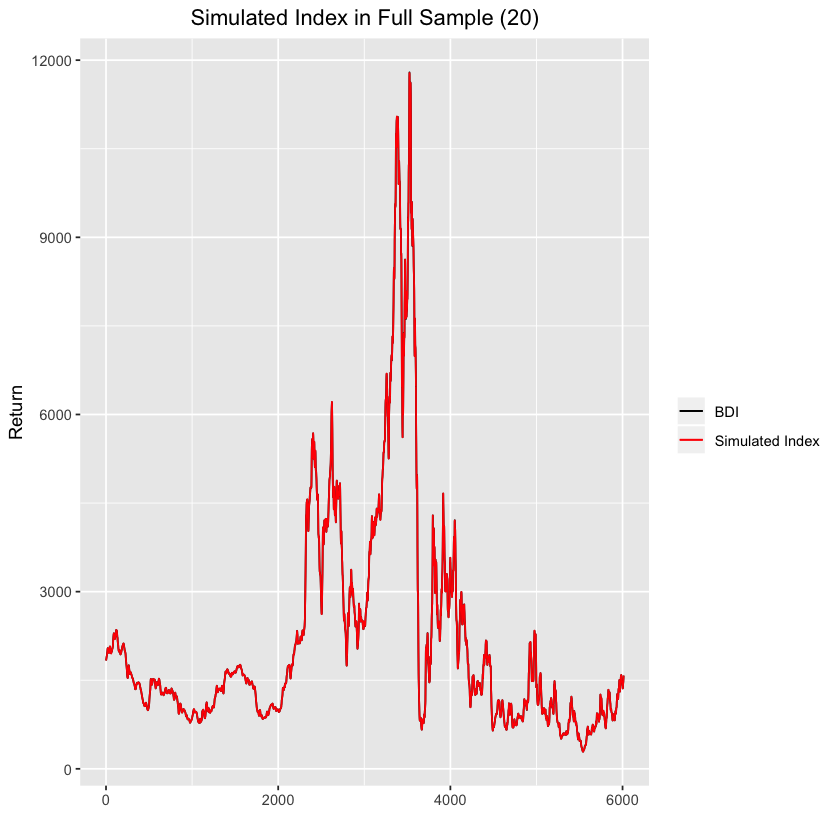

In [7]:
n.r.data <- names(r.data)[-(which(names(r.data) == "BDI.csv"))]
lm2 <- list()
summary2 <- list()
tr2 <- list()
df2 <- list()
for(i in 1:4) {
    x <- i * 5
    ind.r.data <- paste0("r.data$", n.r.data, "[1:(dim(r.data)[1]","-", x, ")]",sep = " ", collapse = "+")
    dep <- paste0("r.data[(1+", x,"):dim(r.data)[1],n]")
    lm2[[i]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
    summary2[[i]] <- summary(lm2[[i]])
    tr2[[i]] <- sd(lm2[[i]]$fitted.value - r.data[(1+x):dim(r.data)[1],n])
    df2[[i]] <- data.frame(Order = 1:length(21:dim(r.data)[1]), BDI.Return = r.data[21:dim(r.data)[1],n], Portfolio.Return = lm2[[i]]$fitted.values[(20-x+1):length(lm2[[i]]$fitted.values)], BDI = sBDI.csv[21:dim(r.data)[1]], Simulated.Index = (1+lm2[[i]]$fitted.values[(20-x+1):length(lm2[[i]]$fitted.values)])*sBDI.csv[21:dim(r.data)[1]])
    print(ggplot(data = df2[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df2[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df2[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# In-Sample Test - Sub-Sample 1
## Contemporaneous Linear Regression

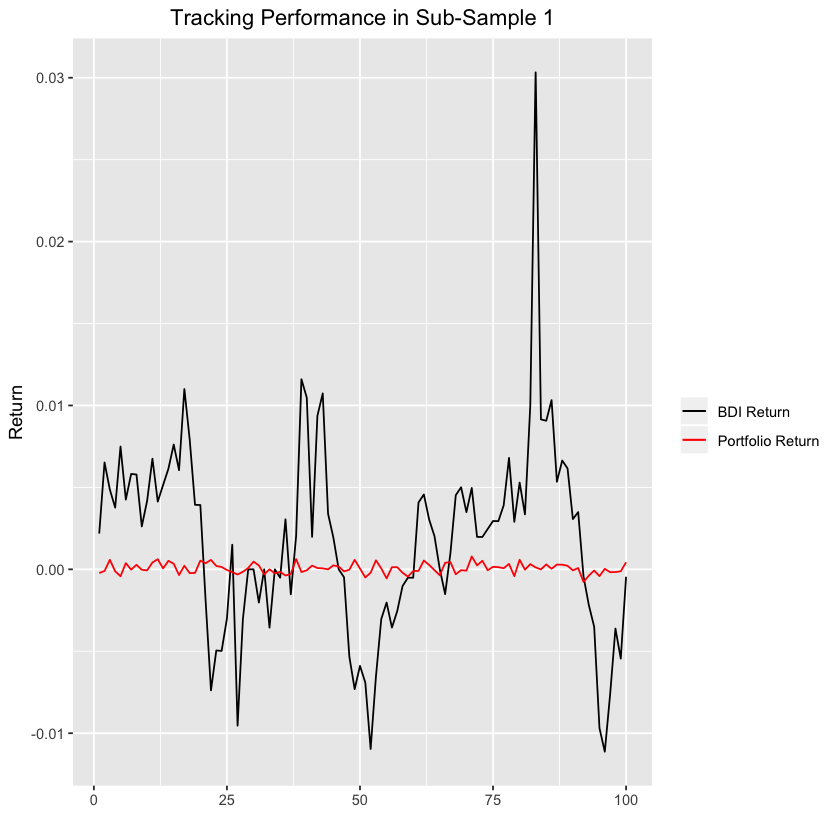

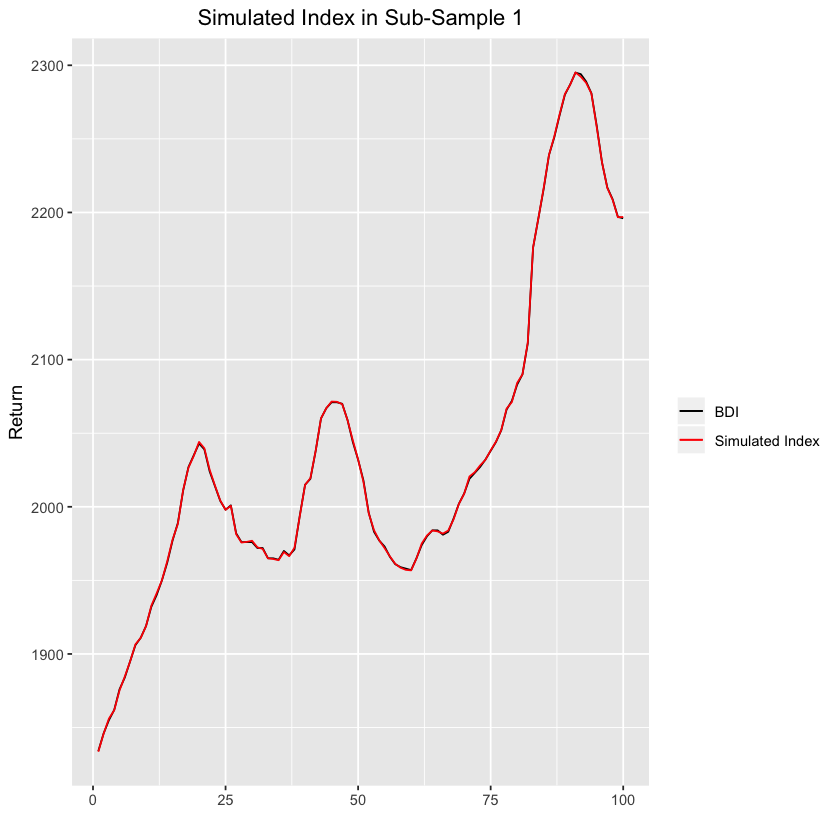

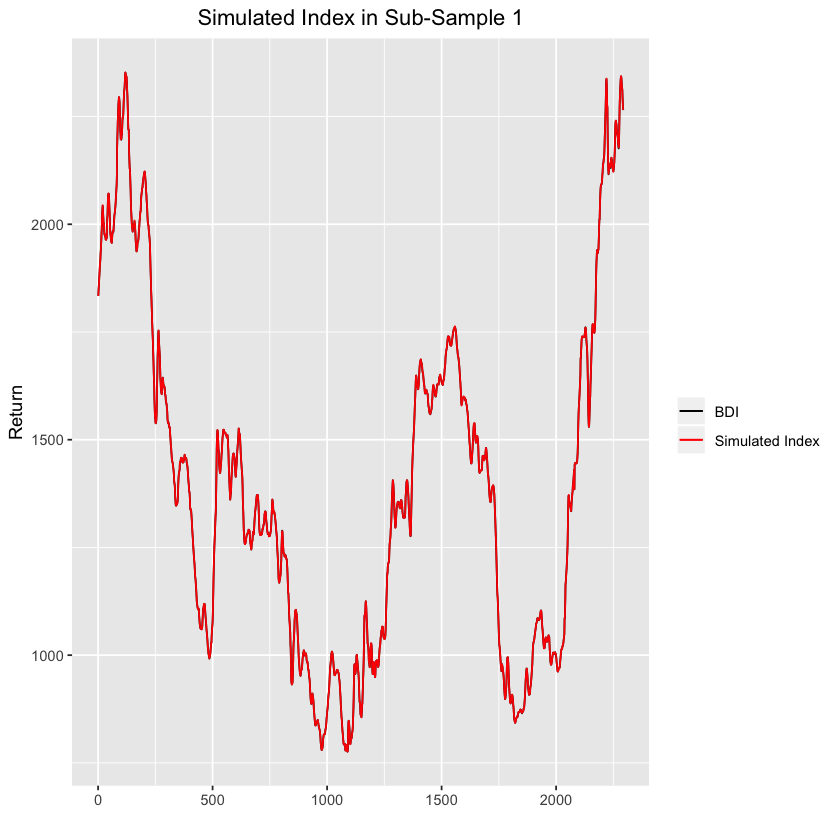

In [8]:
sub1 <- which(r.data.b$Date == paste0(sub1_year, "/", sub1_month, "/", sub1_day))
sub2 <- which(r.data.b$Date == paste0(sub2_year, "/", sub2_month, "/", sub2_day))

lm3 <- lm(formula = BDI.csv ~ ., data = r.data[1:sub1,])
tr3 <- sd(lm3$fitted.values - r.data[1:sub1,n])

df3 <- data.frame(Order = 1:length(21:sub1), BDI.Return= r.data[21:sub1,n], Portfolio.Return = lm3$fitted.values[21:sub1], BDI = sBDI.csv[21:sub1], Simulated.Index = (1+lm3$fitted.values[21:sub1])*sBDI.csv[21:sub1])
ggplot(data = df3[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df3[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df3, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Linear Regression

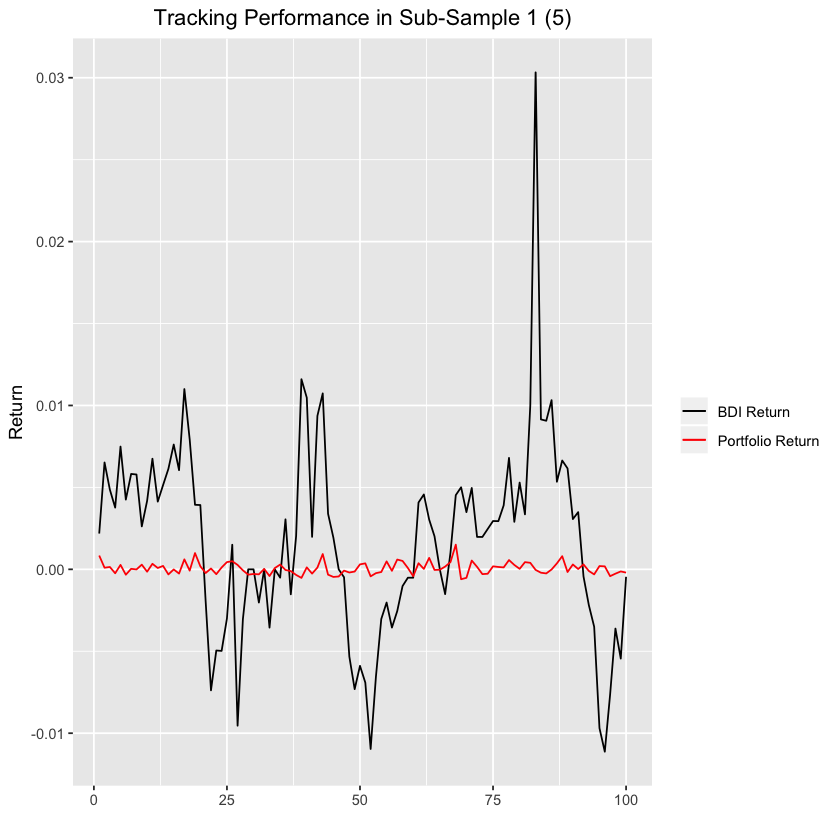

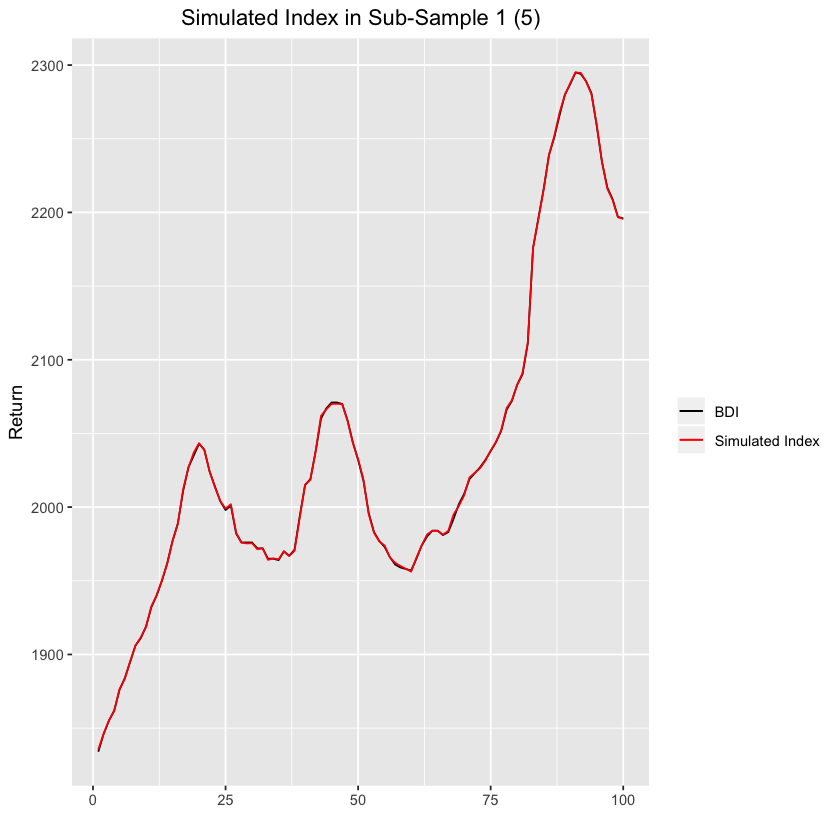

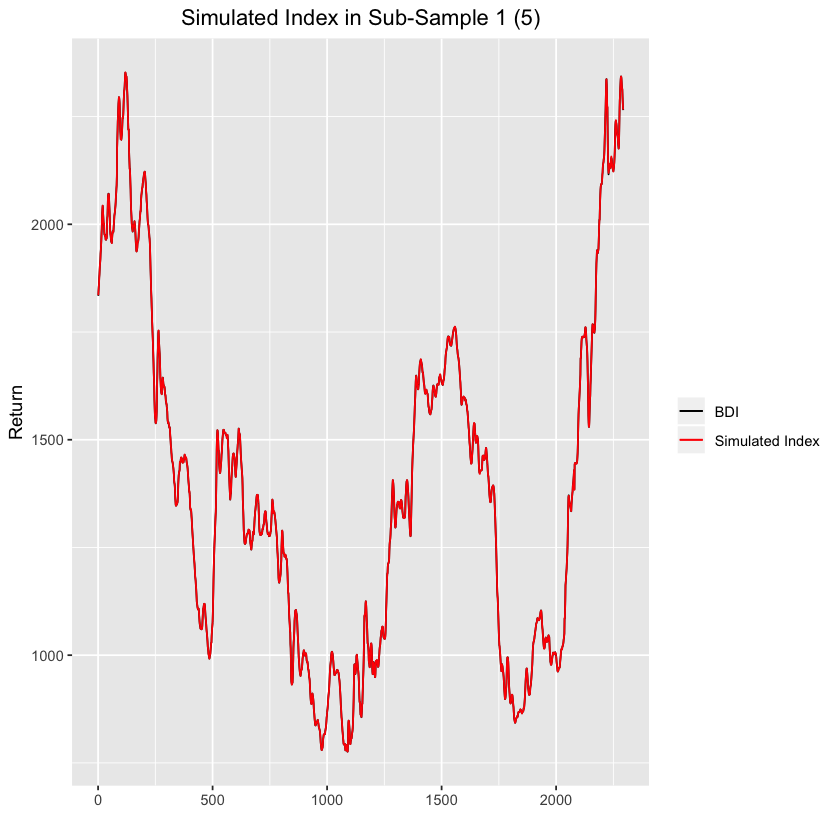

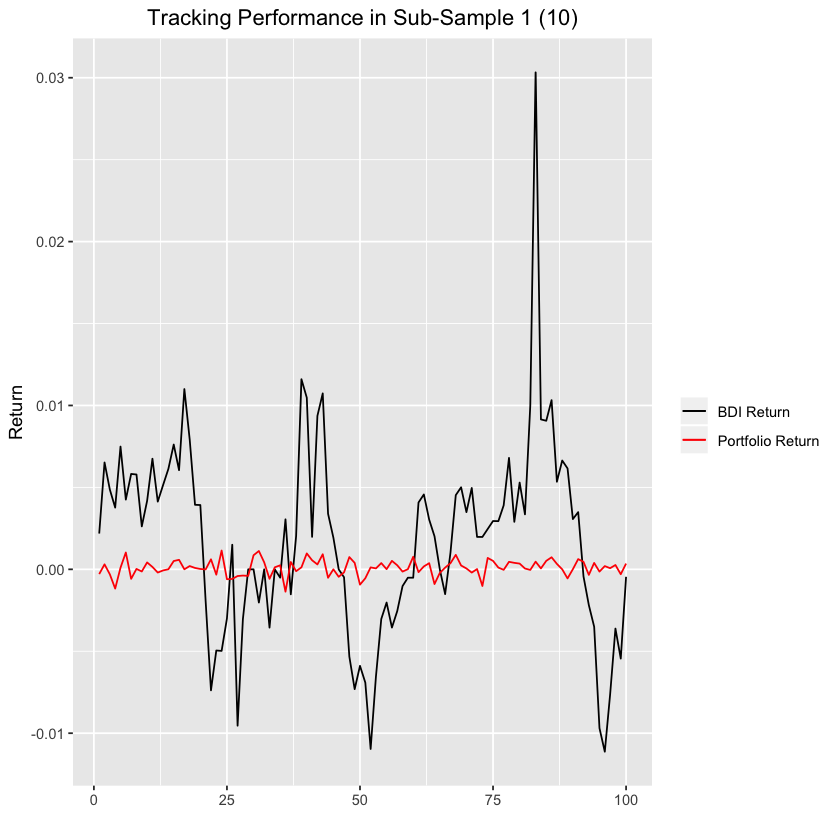

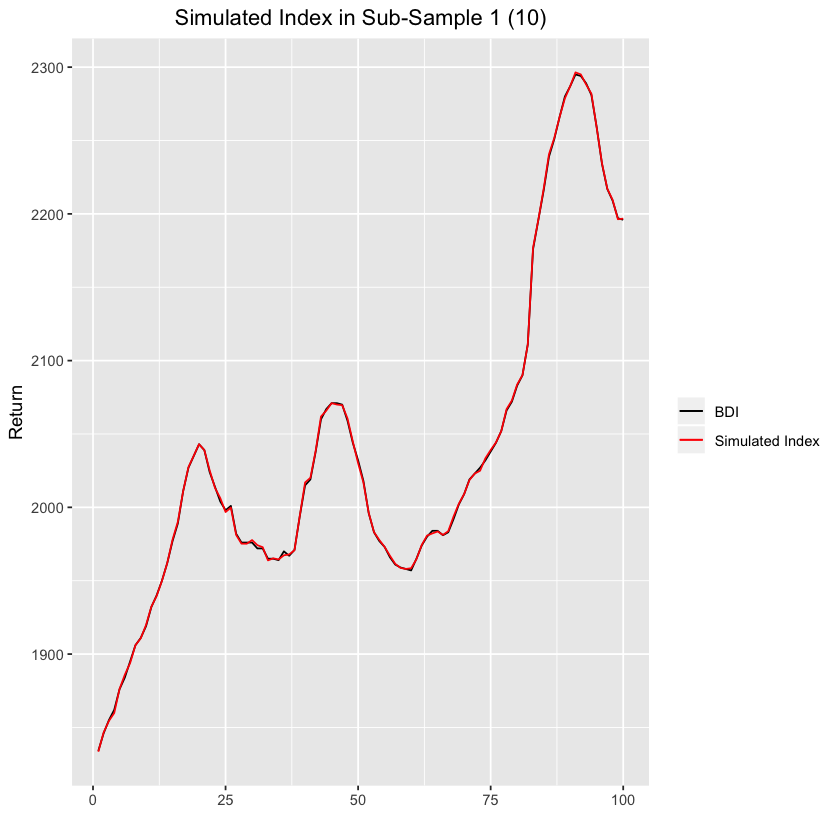

...

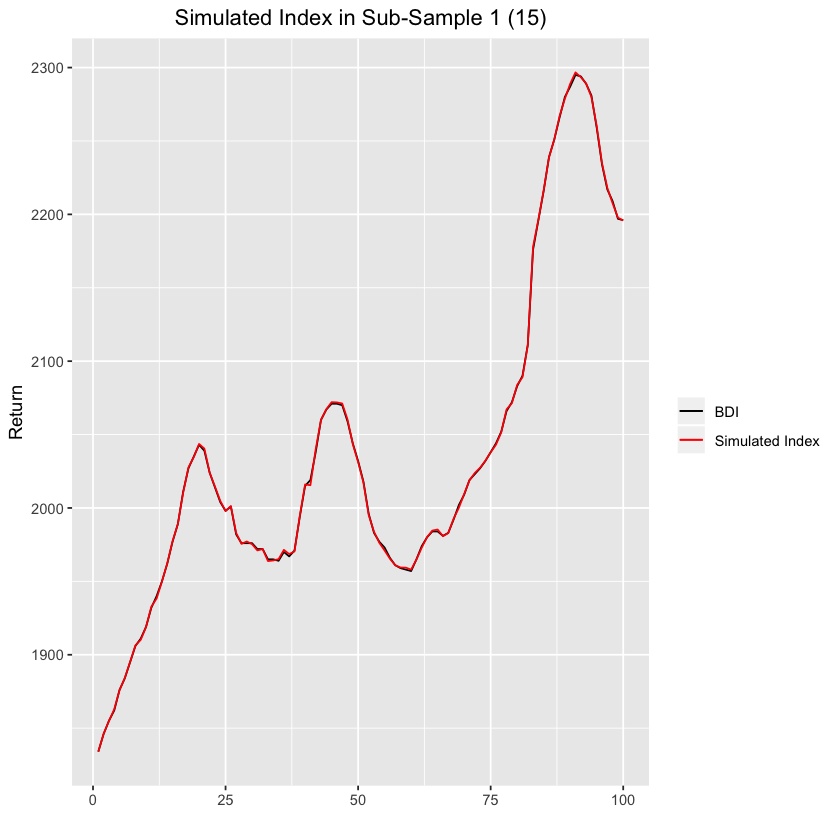

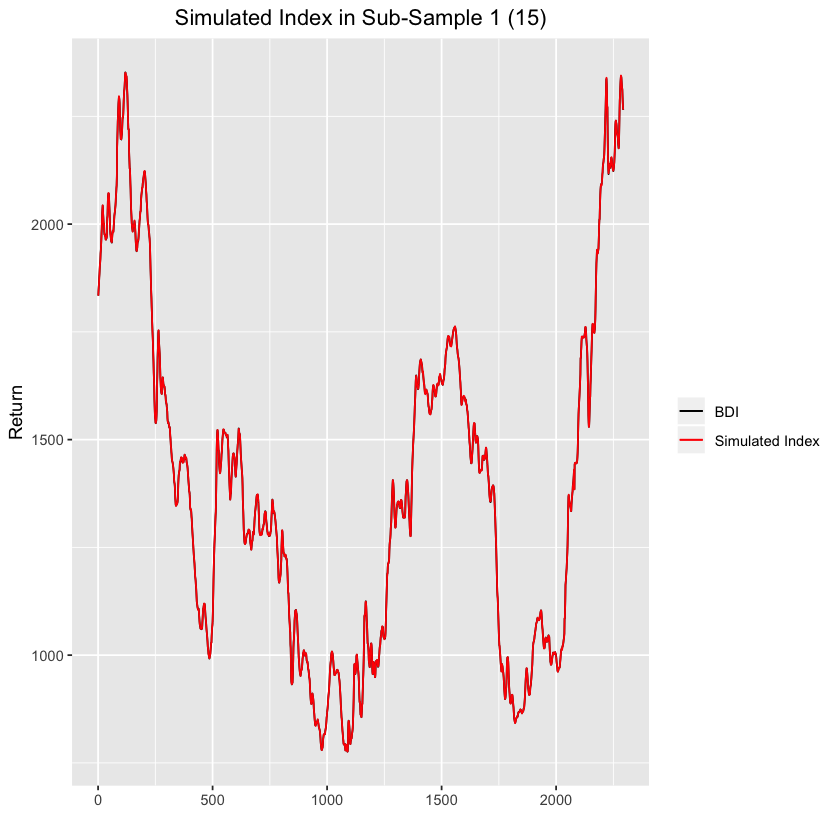

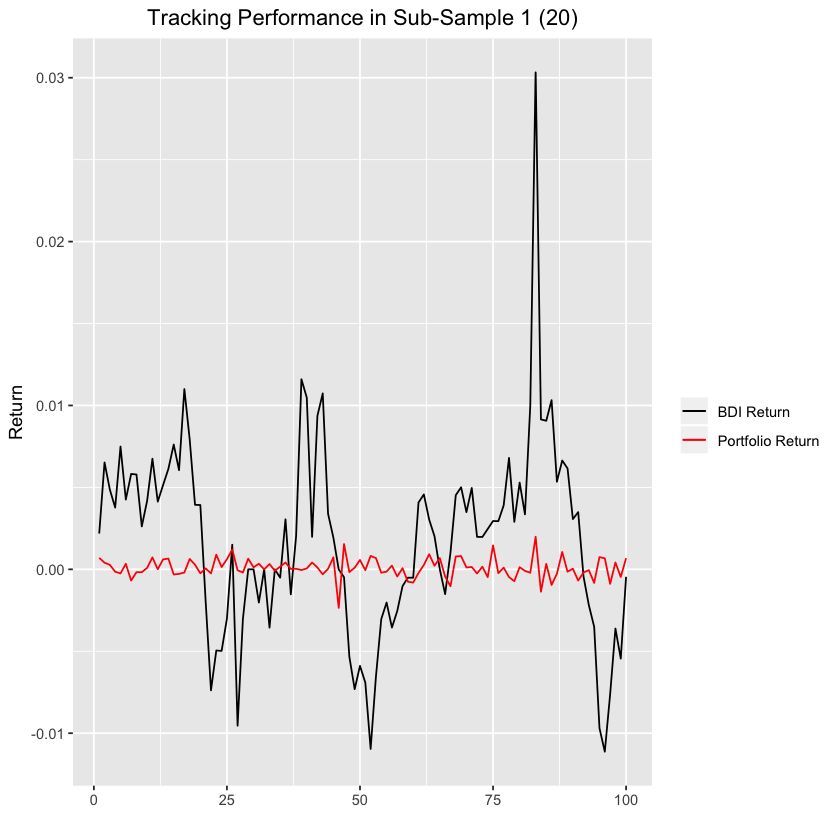

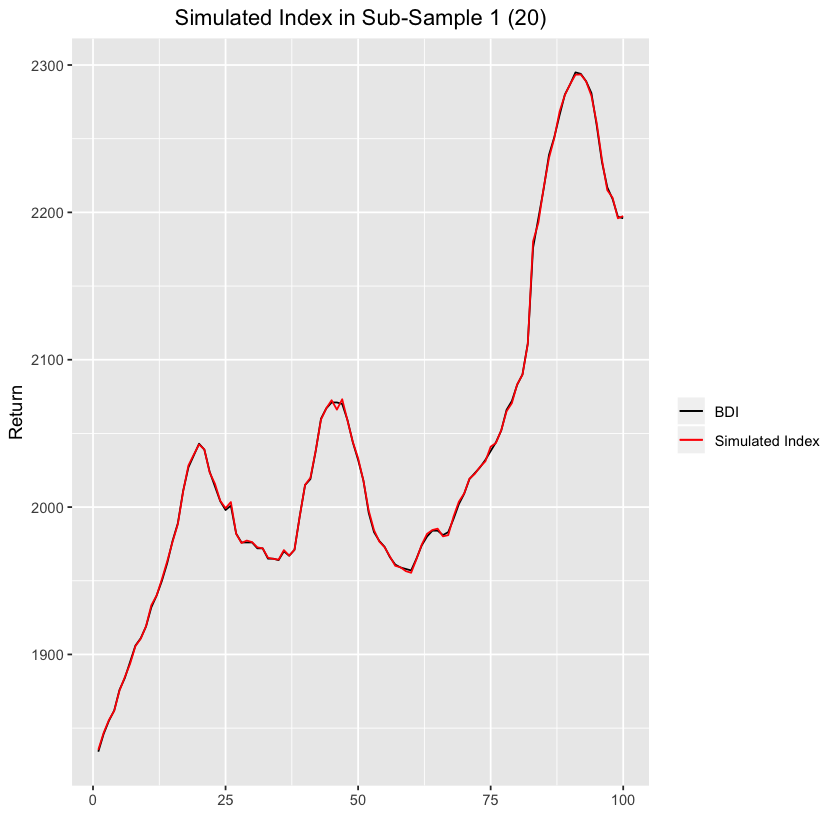

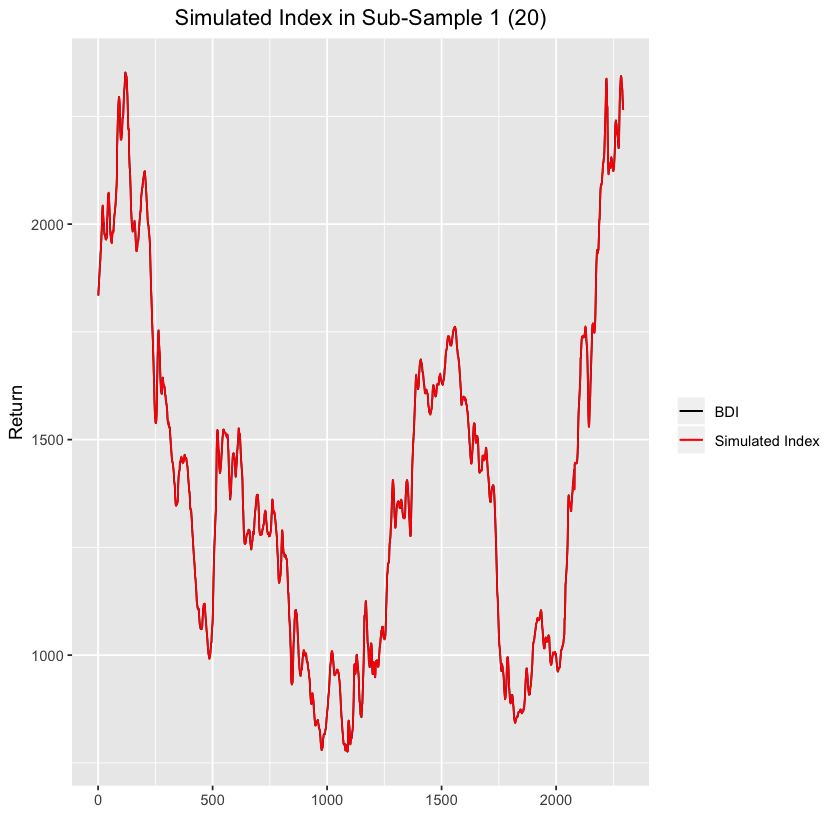

In [9]:
lm4 <- list()
summary4 <- list()
tr4 <- list()
df4 <- list()
for(i in 1:4) {
    x <- i * 5
    ind.r.data <- paste0("r.data$", n.r.data, "[1:(sub1","-", x, ")]",sep = " ", collapse = "+")
    dep <- paste0("r.data[(1+", x,"):sub1,n]")
    lm4[[i]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
    summary4[[i]] <- summary(lm4[[i]])
    tr4[[i]] <- lm4[[i]]$fitted.value - r.data[(1+x):sub1,n]
    df4[[i]] <- data.frame(Order = 1:length(21:sub1), BDI.Return = r.data[21:sub1,n], Portfolio.Return = lm4[[i]]$fitted.values[(20-x+1):length(lm4[[i]]$fitted.values)], BDI = sBDI.csv[21:sub1], Simulated.Index = (1+lm4[[i]]$fitted.values[(20-x+1):length(lm4[[i]]$fitted.values)])*sBDI.csv[21:sub1])
    print(ggplot(data = df4[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df4[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df4[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# In-Sample Test - Sub-Sample 2
## Contemporaneous Linear Regression

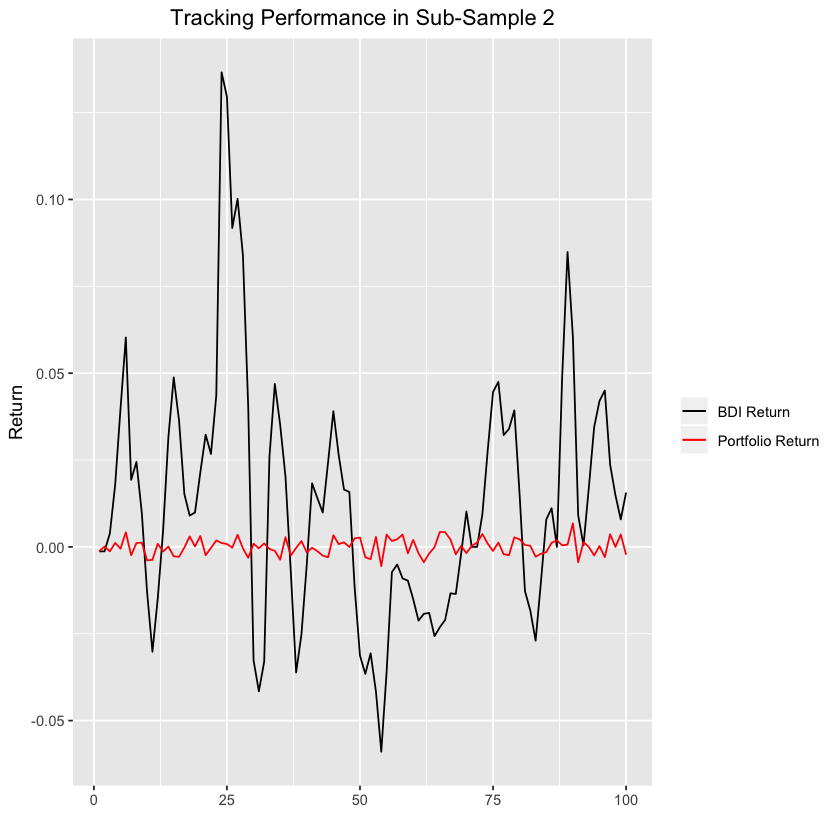

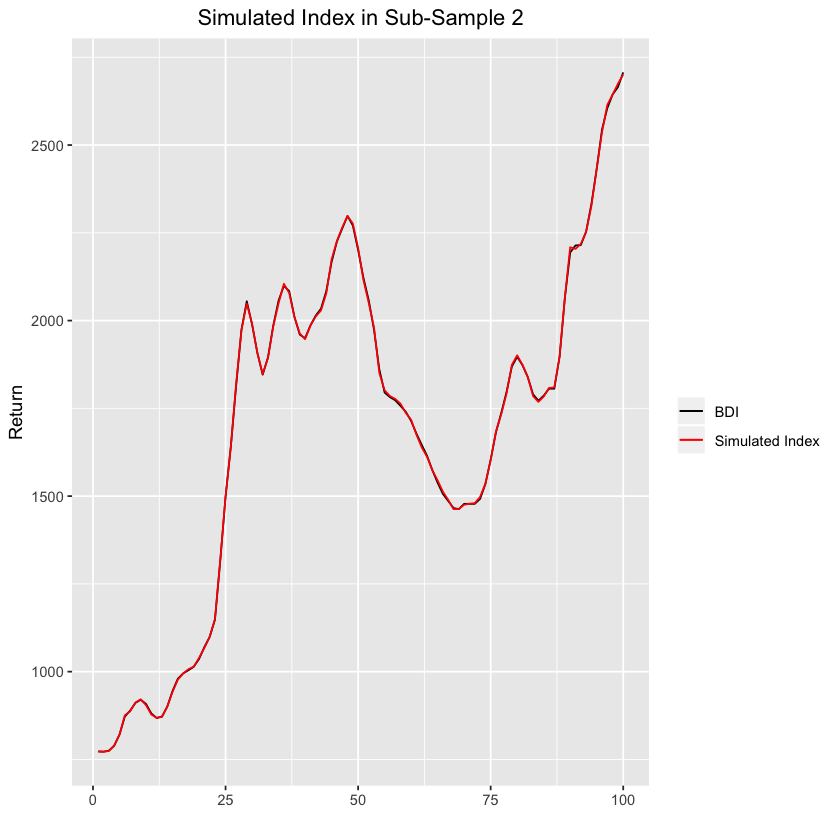

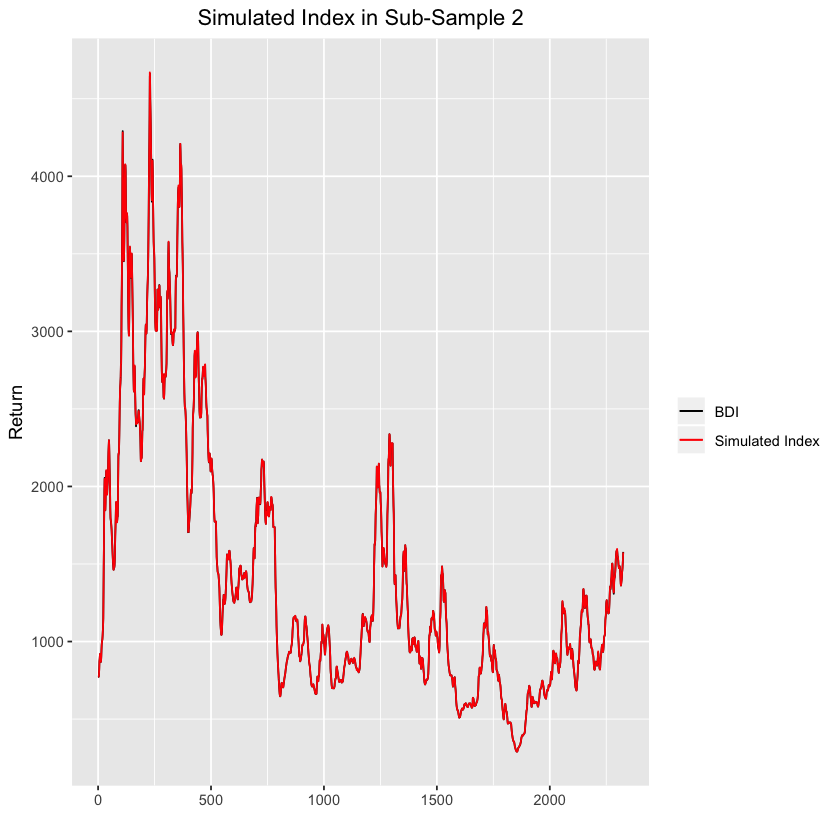

In [10]:
lm5 <- lm(formula = BDI.csv ~ ., data = r.data[sub2:dim(r.data)[1],])
tr5 <- sd(lm5$fitted.values - r.data[sub2:dim(r.data)[1],n])

df5 <- data.frame(Order = 1:length((sub2+20):dim(r.data)[1]), BDI.Return= r.data[(sub2+20):dim(r.data)[1],n], Portfolio.Return = lm5$fitted.values[21:length(lm5$fitted.values)], BDI = sBDI.csv[(sub2+20):dim(r.data)[1]], Simulated.Index = (1+lm5$fitted.values[21:length(lm5$fitted.values)])*sBDI.csv[(sub2+20):dim(r.data)[1]])
ggplot(data = df5[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df5[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df5, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Linear Regression

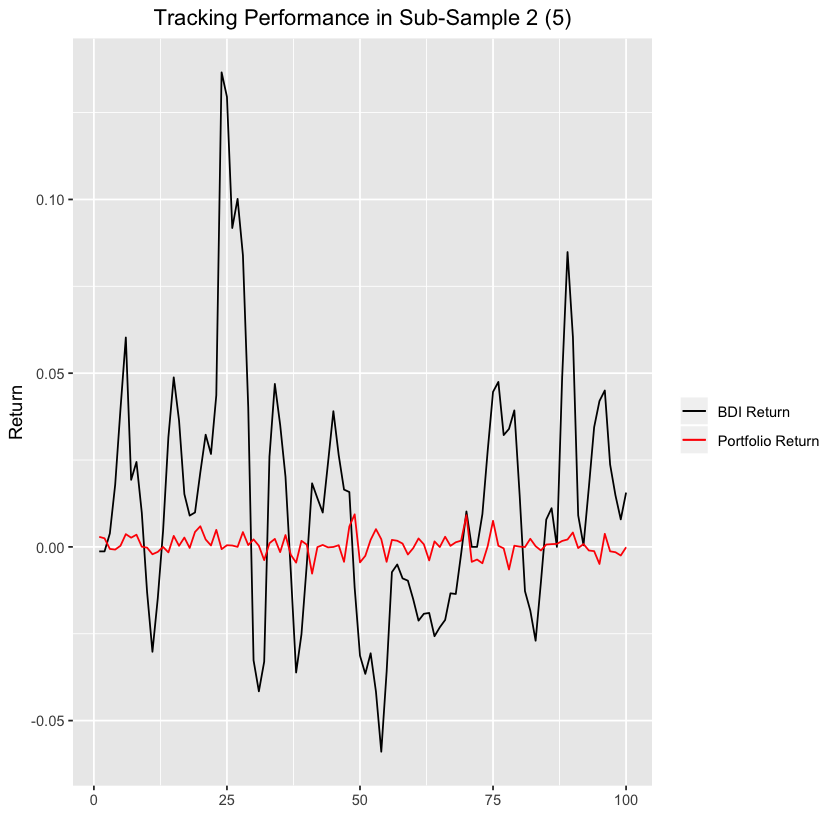

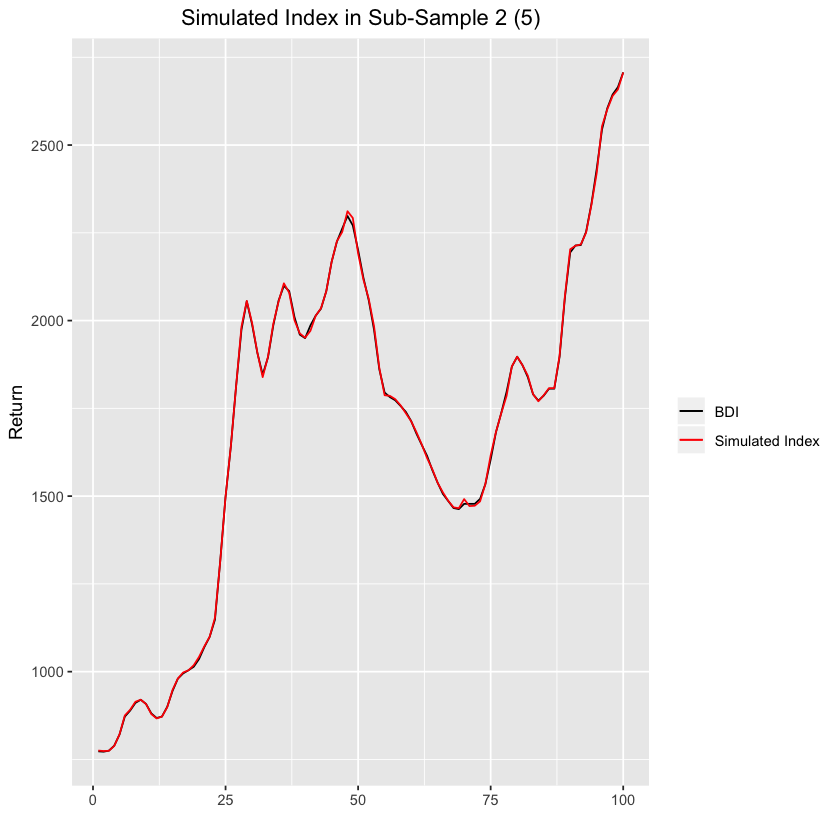

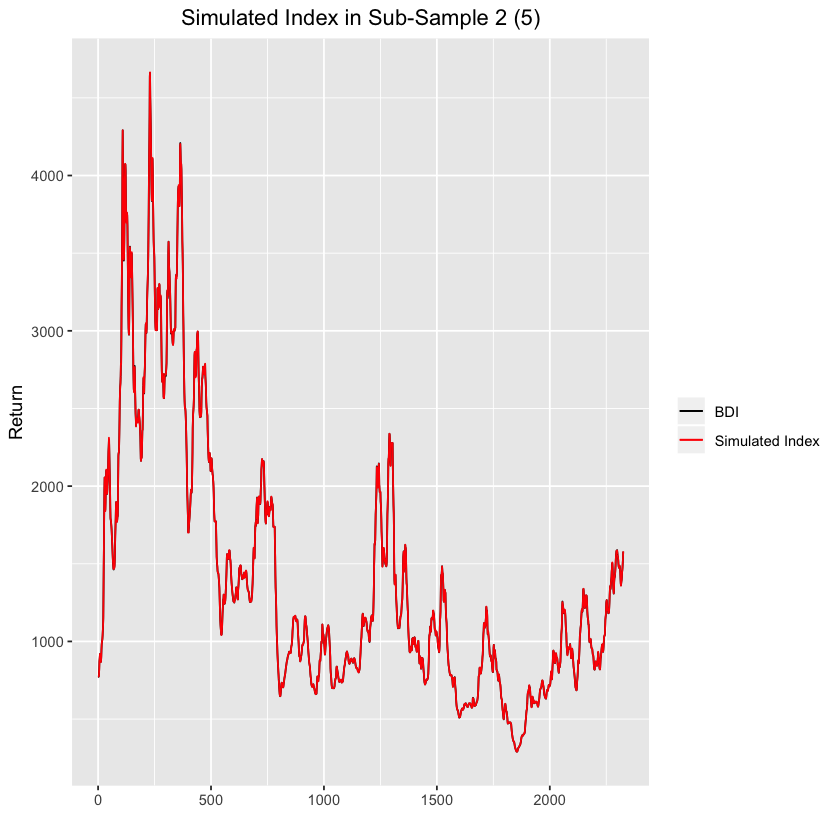

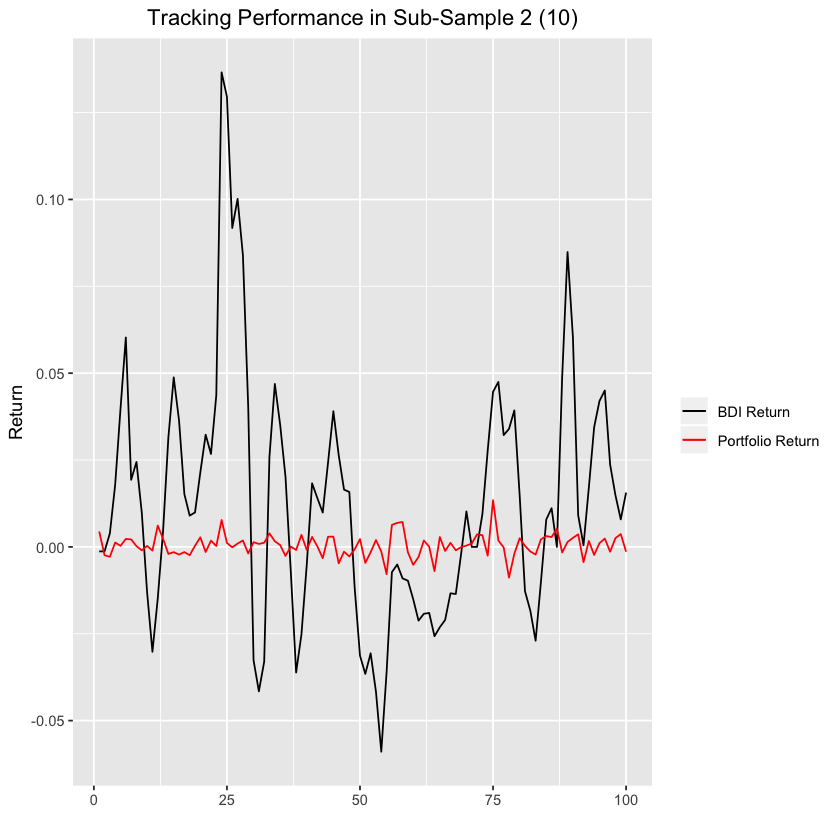

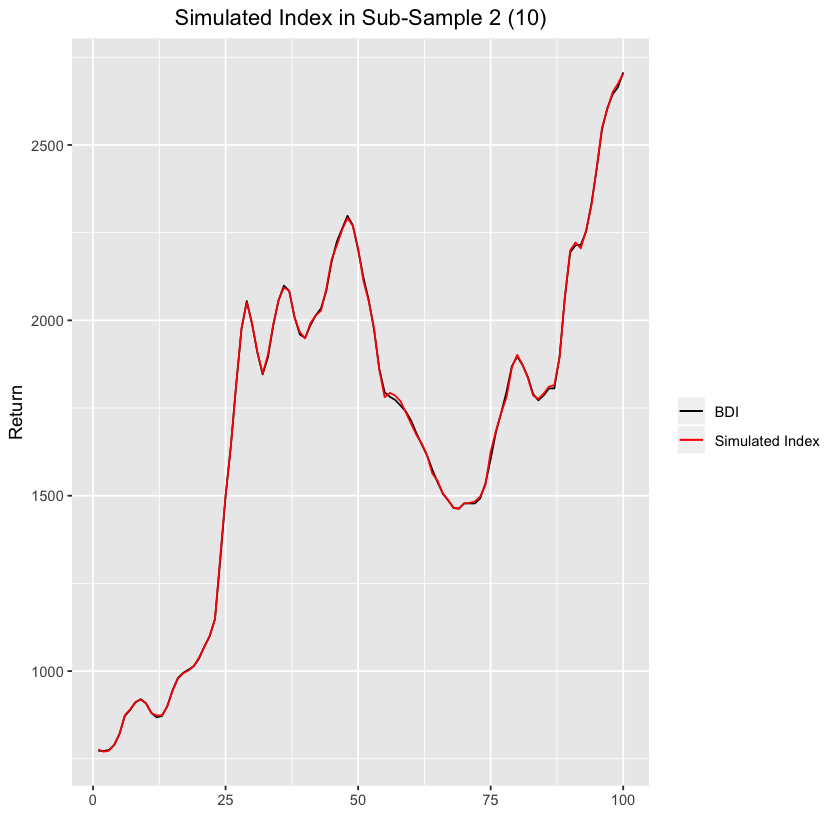

...

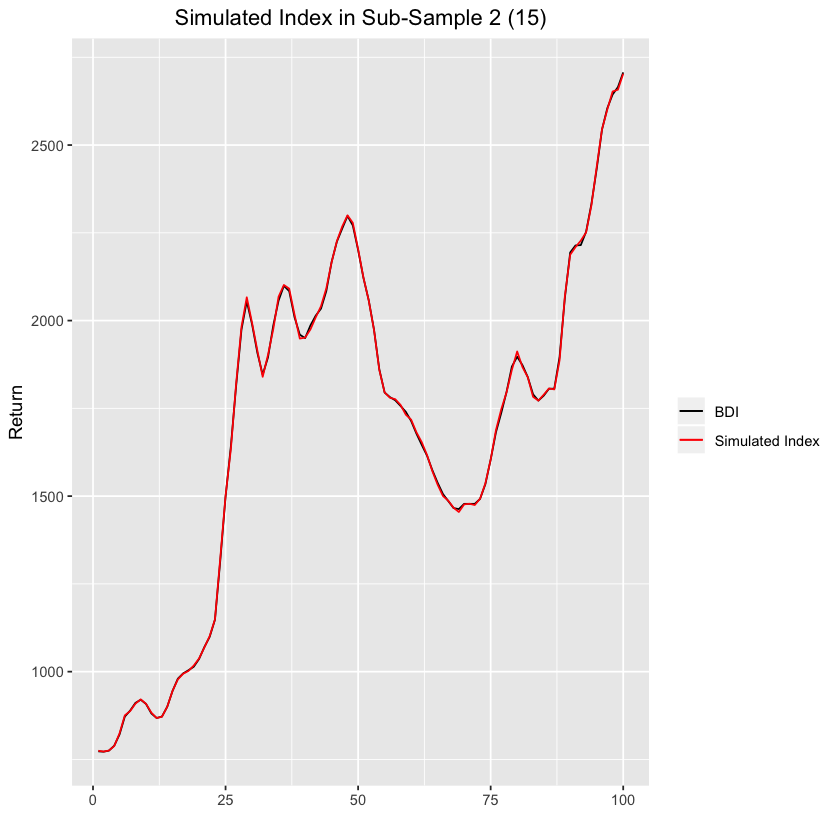

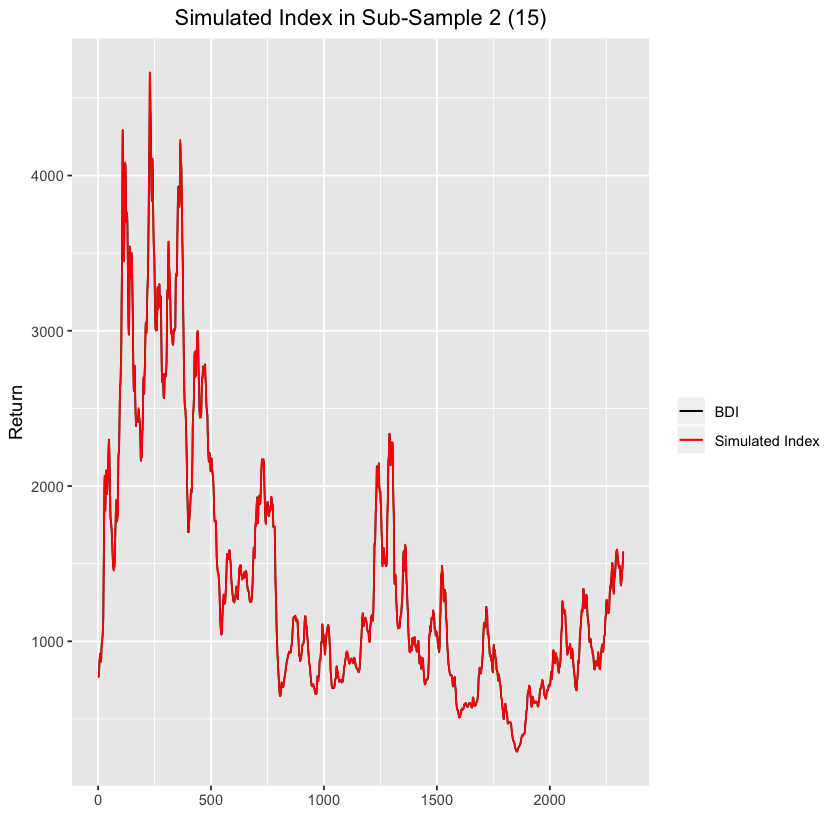

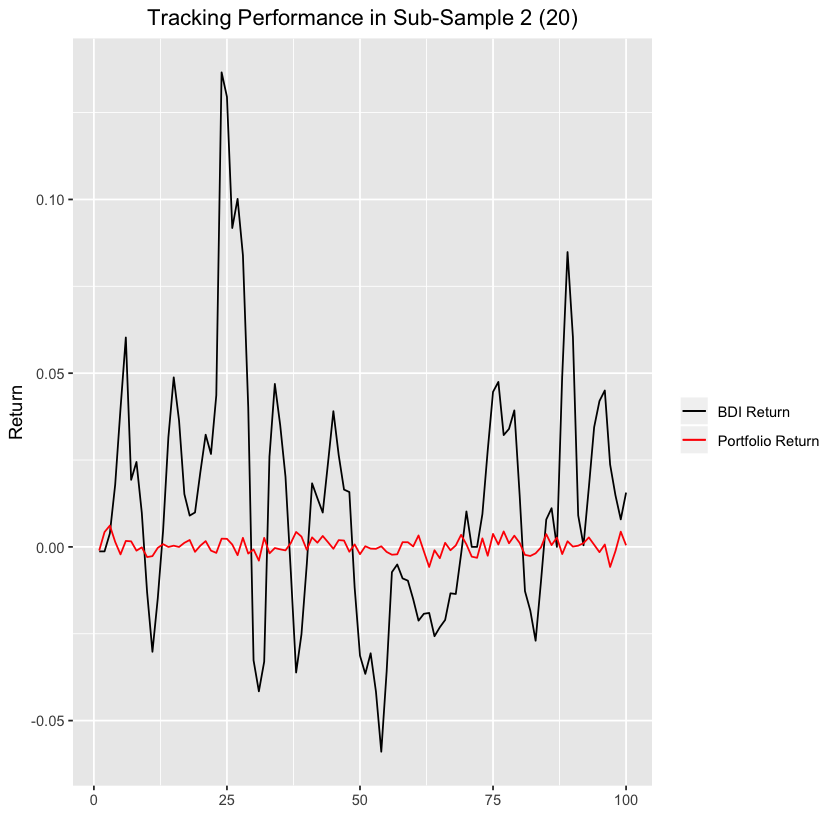

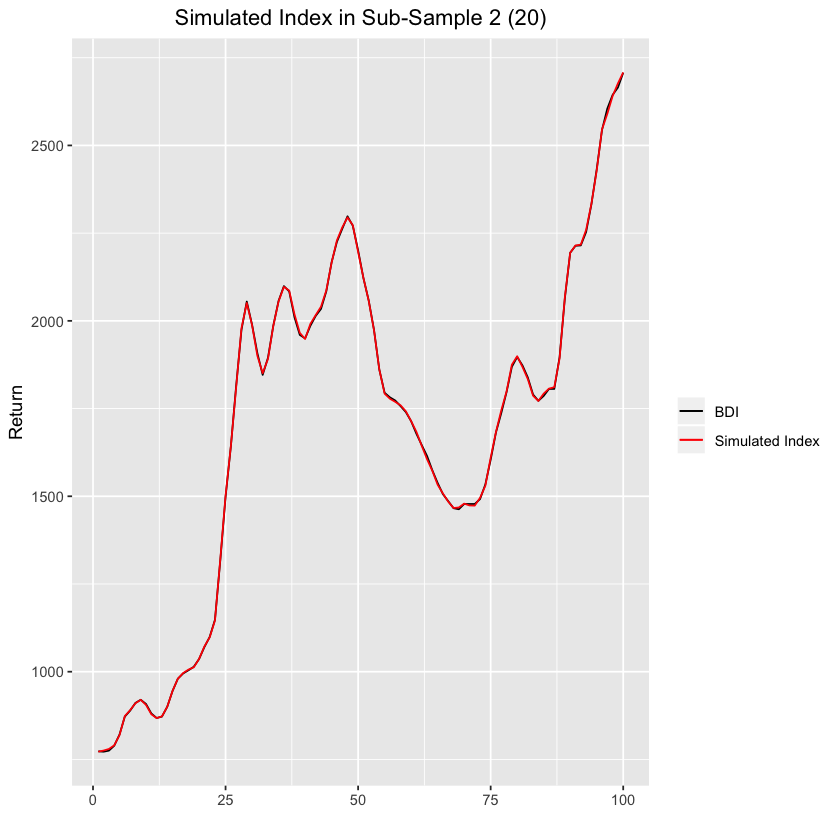

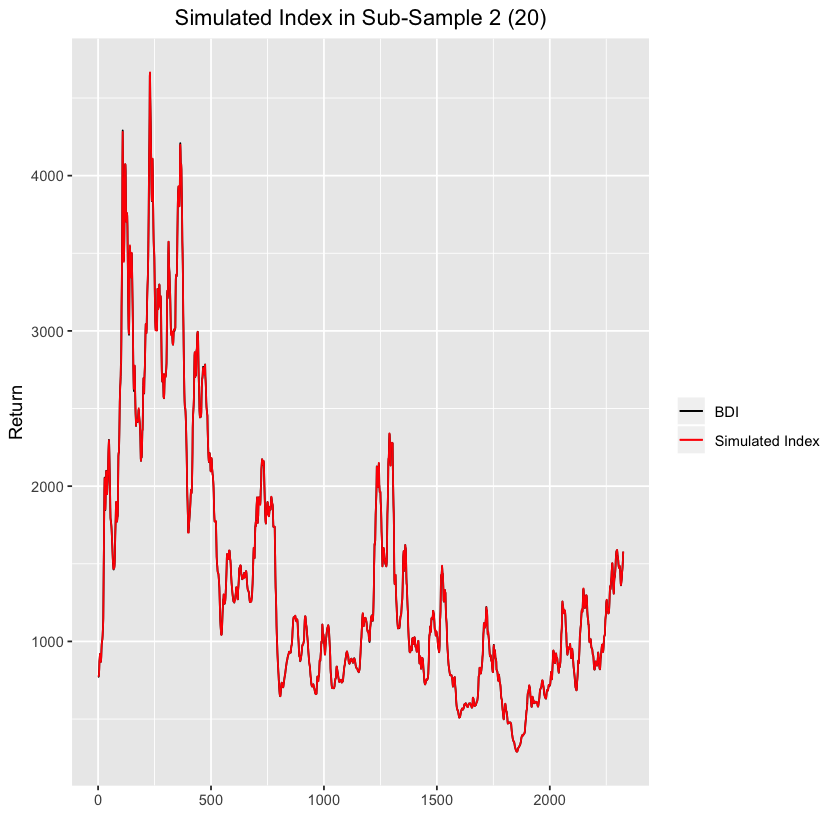

In [11]:
lm6 <- list()
summary6 <- list()
tr6 <- list()
df6 <- list()
for(i in 1:4) {
    x <- i * 5
    ind.r.data <- paste0("r.data$", n.r.data, "[sub2:(dim(r.data)[1]","-", x, ")]",sep = " ", collapse = "+")
    dep <- paste0("r.data[(sub2+",x ,"):dim(r.data)[1],n]")
    lm6[[i]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
    summary6[[i]] <- summary(lm6[[i]])
    tr6[[i]] <- lm6[[i]]$fitted.value - r.data[(sub2+x):dim(r.data)[1],n]
    df6[[i]] <- data.frame(Order = 1:length((sub2+20):dim(r.data)[1]), BDI.Return = r.data[(sub2+20):dim(r.data)[1],n], Portfolio.Return = lm6[[i]]$fitted.values[(20-x+1):length(lm6[[i]]$fitted.values)], BDI = sBDI.csv[(sub2+20):dim(r.data)[1]], Simulated.Index = (1+lm6[[i]]$fitted.values[(20-x+1):length(lm6[[i]]$fitted.values)])*sBDI.csv[(sub2+20):dim(r.data)[1]])
    print(ggplot(data = df6[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df6[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df6[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# In-Sample Test - Sub-Sample 3
## Contemporaneous Linear Regression

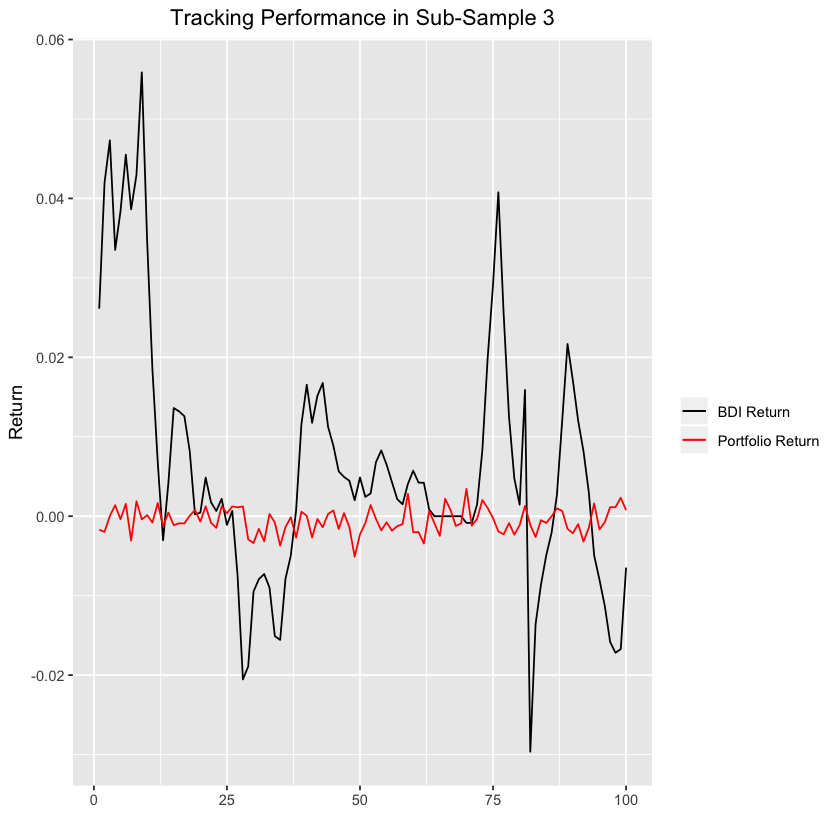

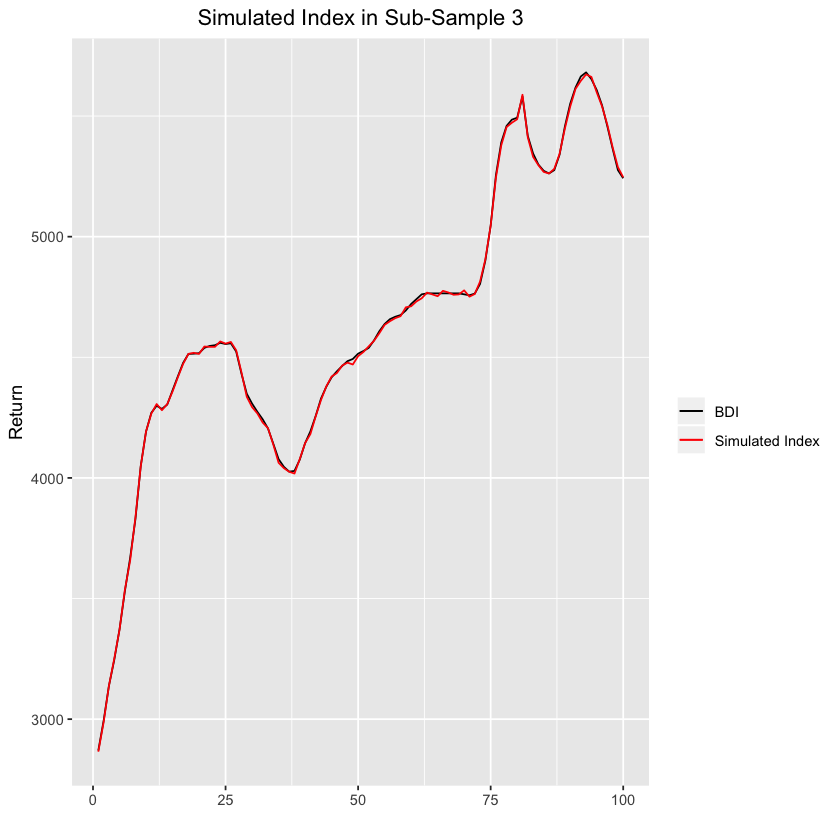

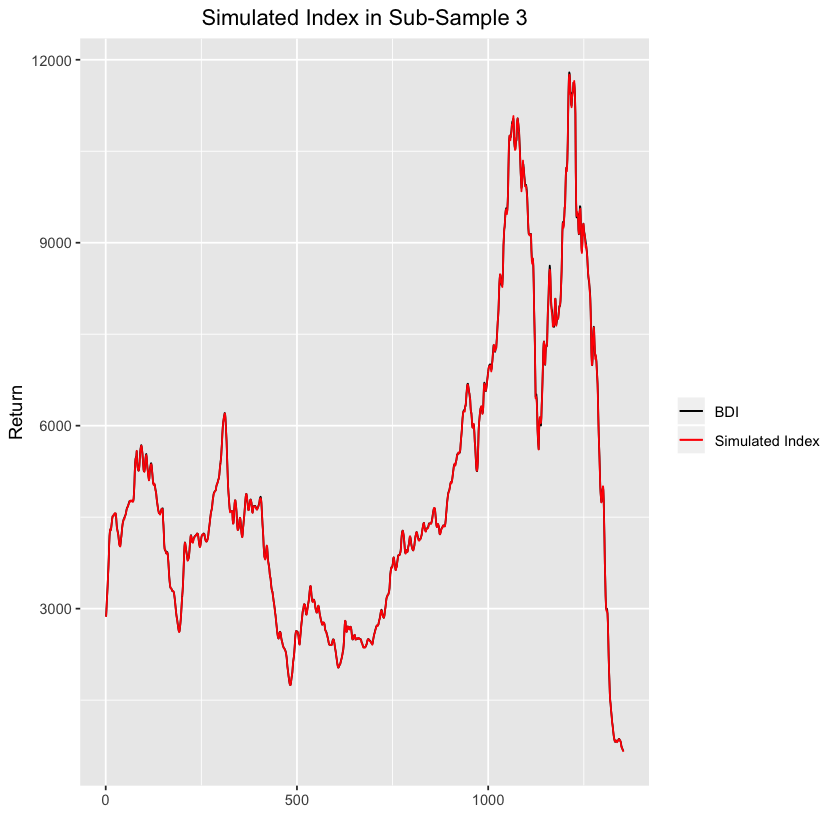

In [12]:
sb1 <- which(r.data.b$Date == paste0(sb1_year, "/", sb1_month, "/", sb1_day))
sb2 <- which(r.data.b$Date == paste0(sb2_year, "/", sb2_month, "/", sb2_day))

lm7 <- lm(formula = BDI.csv ~ ., data = r.data[sb1:sb2,])
tr7 <- sd(lm7$fitted.values - r.data[sb1:sb2,n])

df7 <- data.frame(Order = 1:length((sb1+20):sb2), BDI.Return= r.data[(sb1+20):sb2,n], Portfolio.Return = lm7$fitted.values[21:length(lm7$fitted.values)], BDI = sBDI.csv[(sb1+20):sb2], Simulated.Index = (1+lm7$fitted.values[21:length(lm7$fitted.values)])*sBDI.csv[(sb1+20):sb2])
ggplot(data = df7[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df7[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df7, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Linear Regression¶

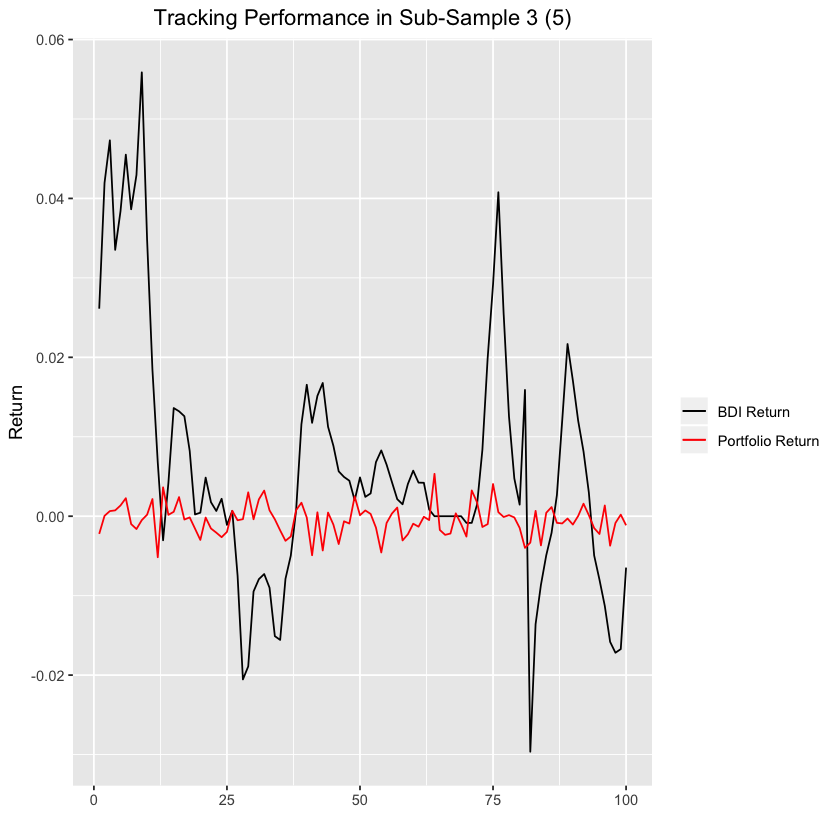

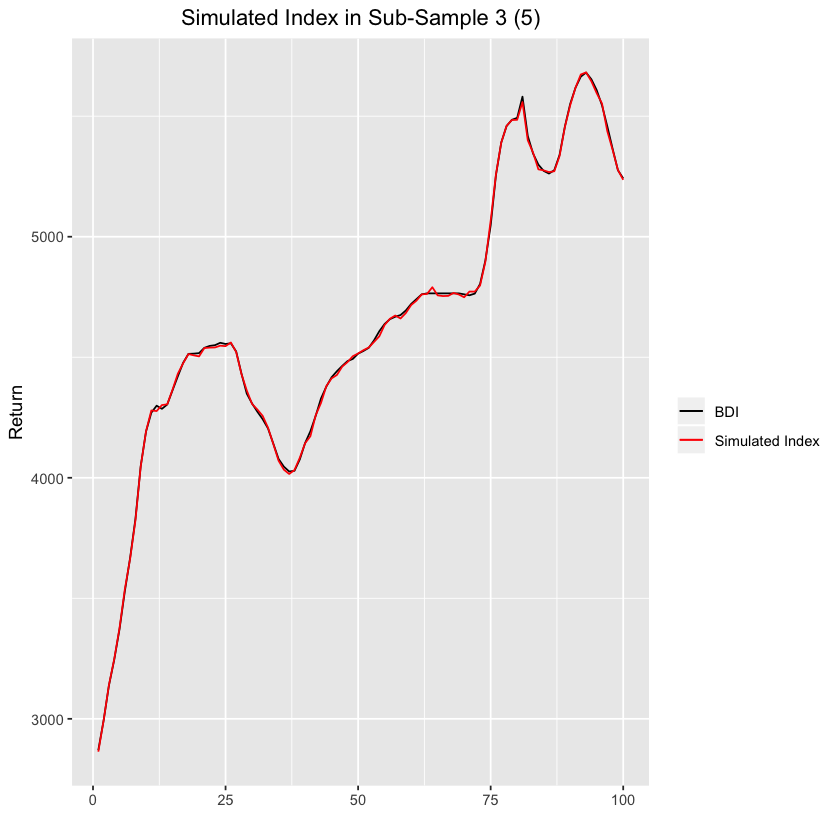

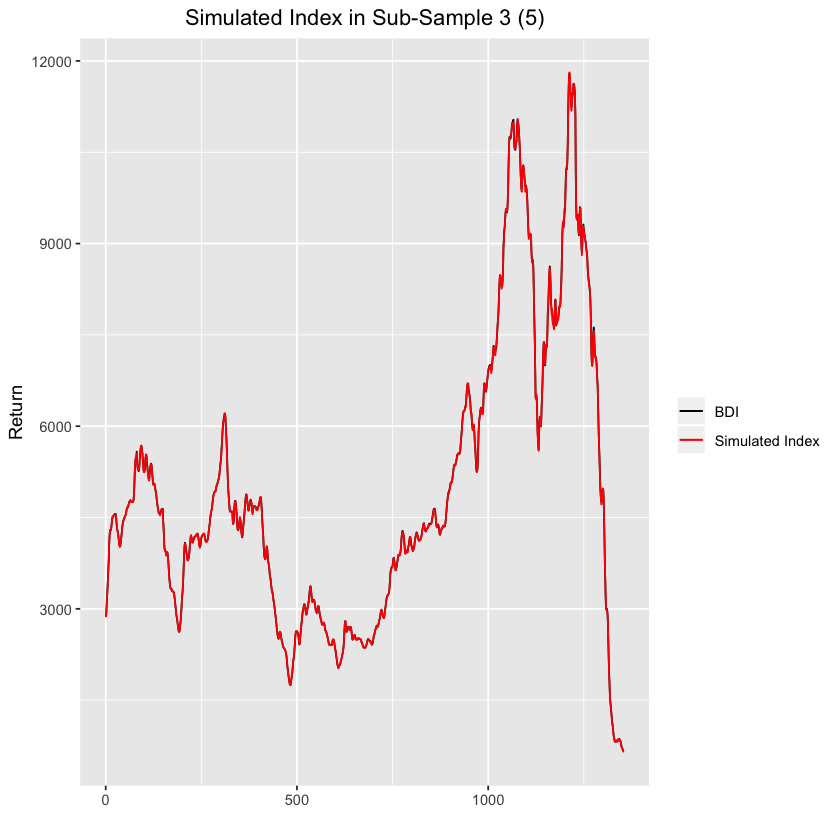

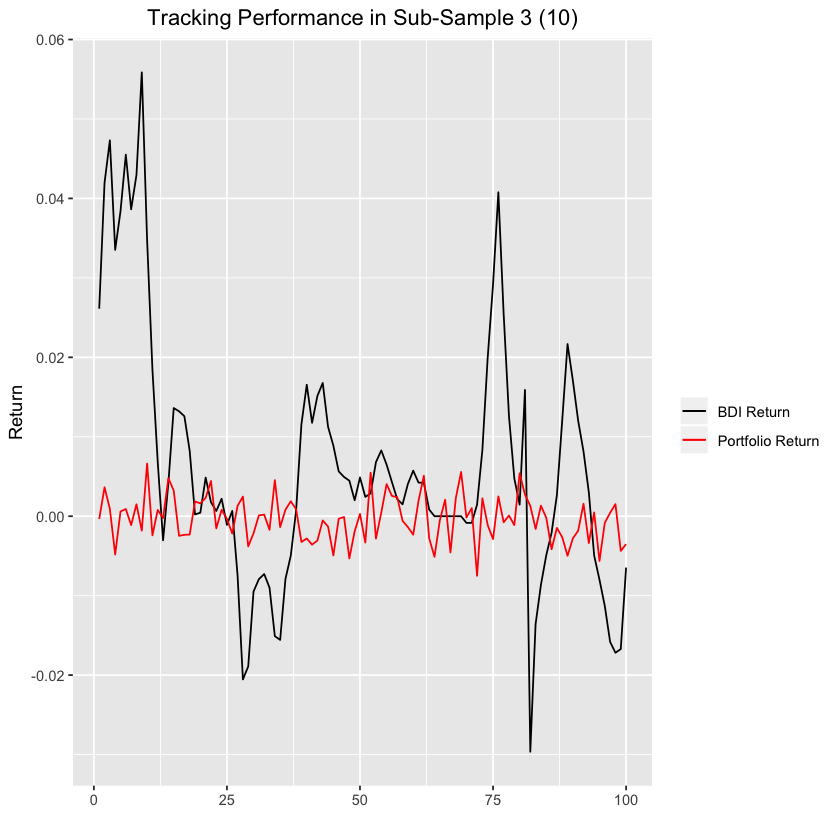

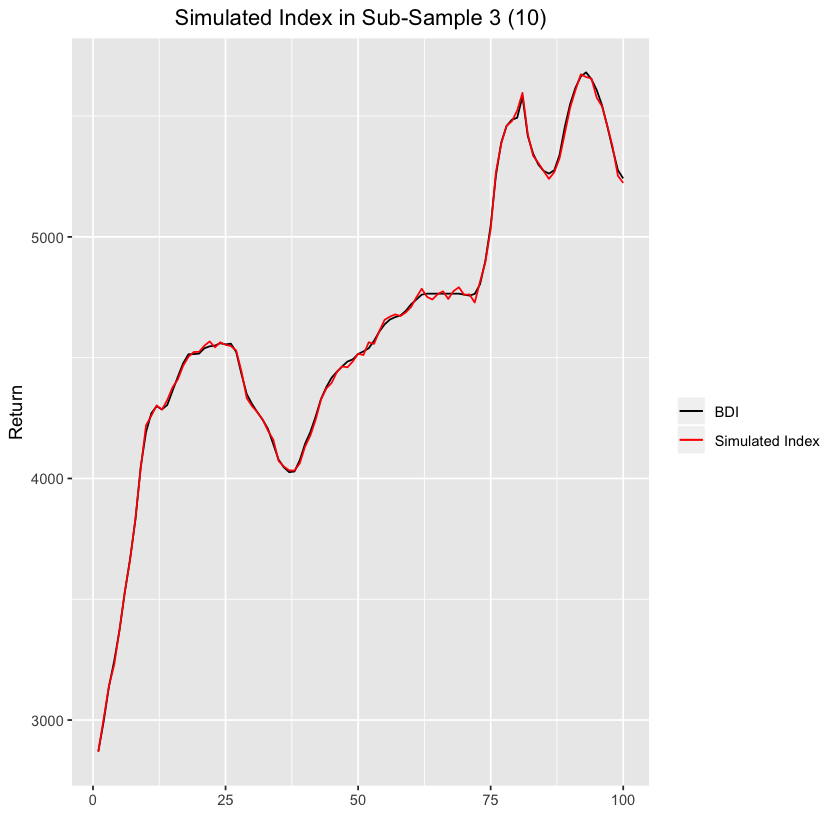

...

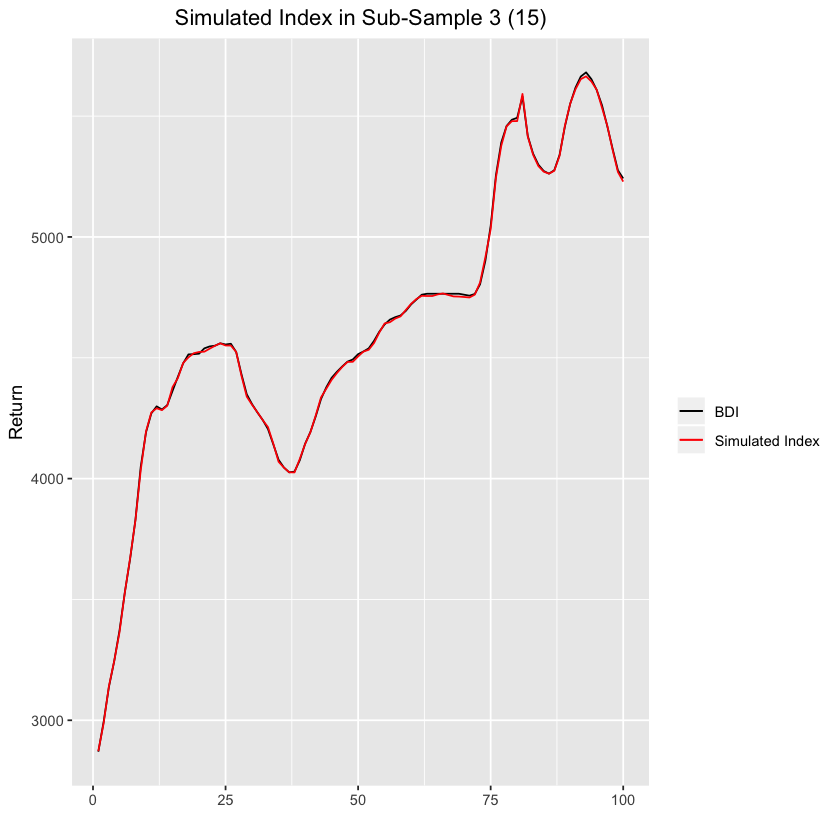

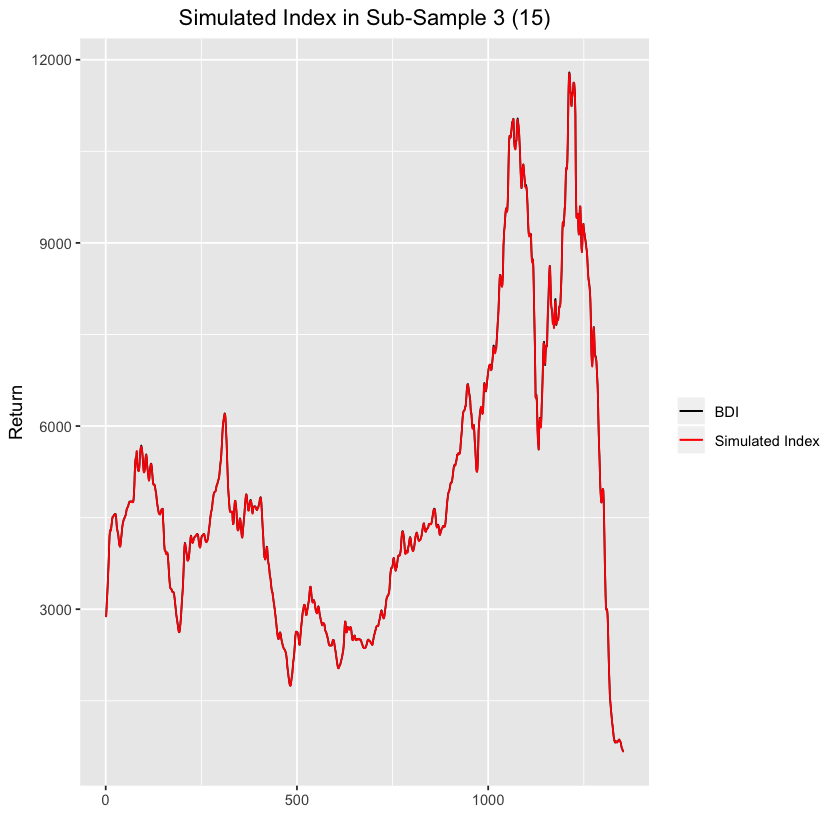

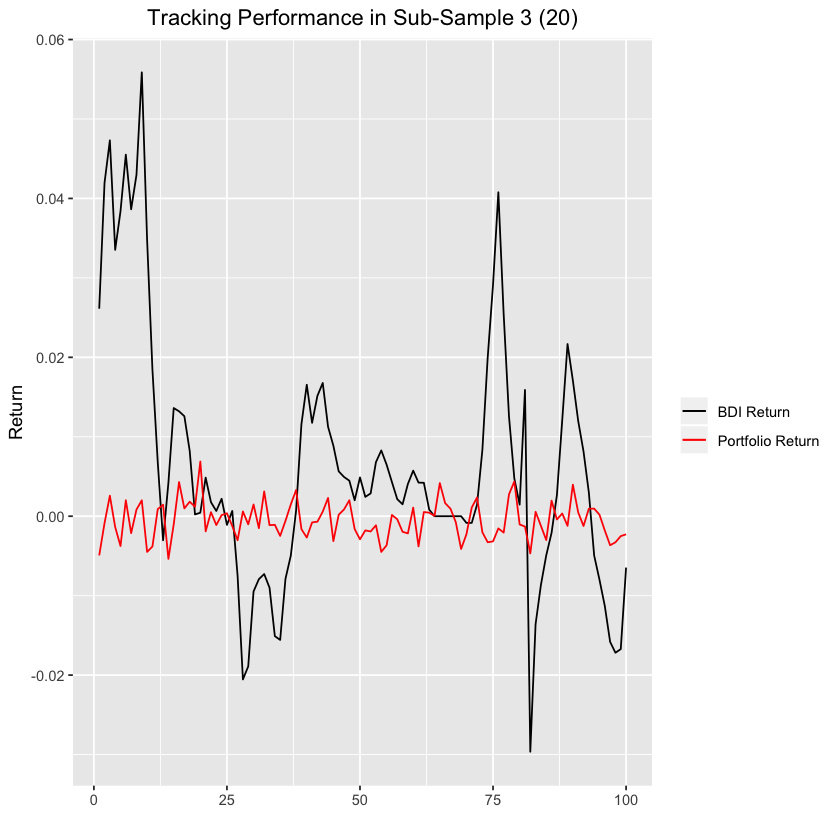

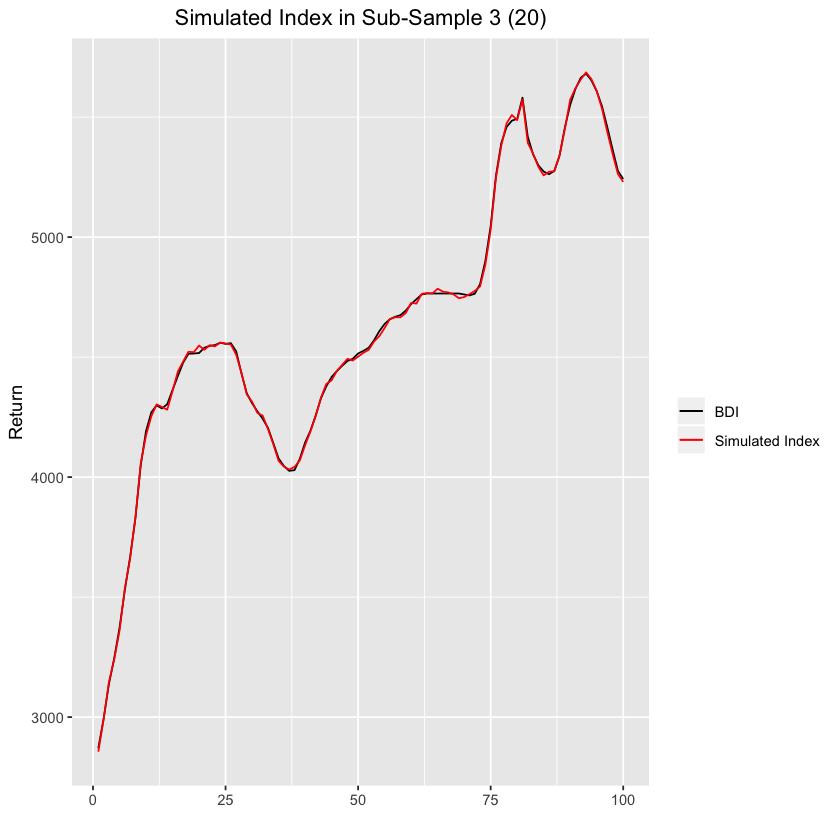

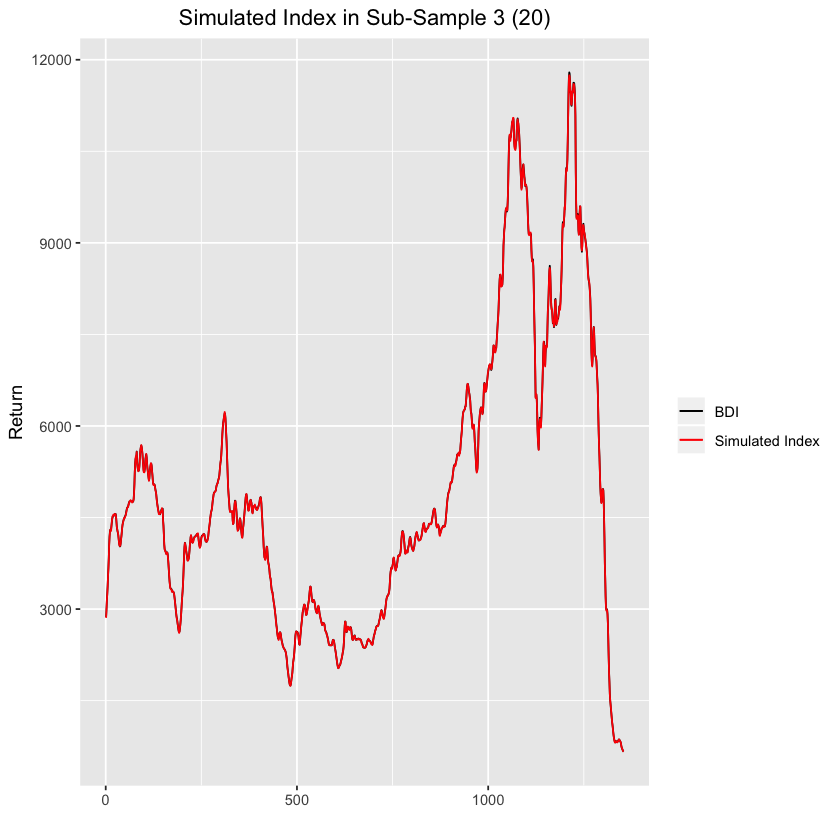

In [13]:
lm8 <- list()
summary8 <- list()
tr8 <- list()
df8 <- list()
for(i in 1:4) {
    x <- i * 5
    ind.r.data <- paste0("r.data$", n.r.data, "[sb1:(sb2","-", x, ")]",sep = " ", collapse = "+")
    dep <- paste0("r.data[(sb1+",x ,"):sb2, n]")
    lm8[[i]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
    summary8[[i]] <- summary(lm8[[i]])
    tr8[[i]] <- lm8[[i]]$fitted.value - r.data[(sb1+x):sb2,n]
    df8[[i]] <- data.frame(Order = 1:length((sb1+20):sb2), BDI.Return = r.data[(sb1+20):sb2,n], Portfolio.Return = lm8[[i]]$fitted.values[(20-x+1):length(lm8[[i]]$fitted.values)], BDI = sBDI.csv[(sb1+20):sb2], Simulated.Index = (1+lm8[[i]]$fitted.values[(20-x+1):length(lm8[[i]]$fitted.values)])*sBDI.csv[(sb1+20):sb2])
    print(ggplot(data = df8[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df8[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = df8[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# Out-of-Sample Test
## Contemporaneous Rolling Window Regression

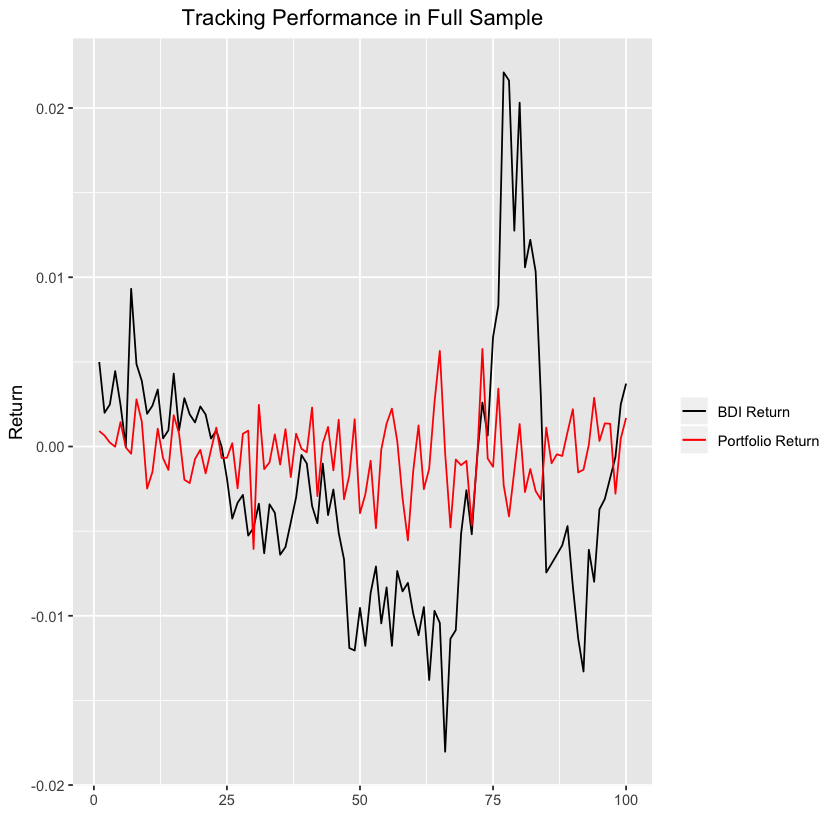

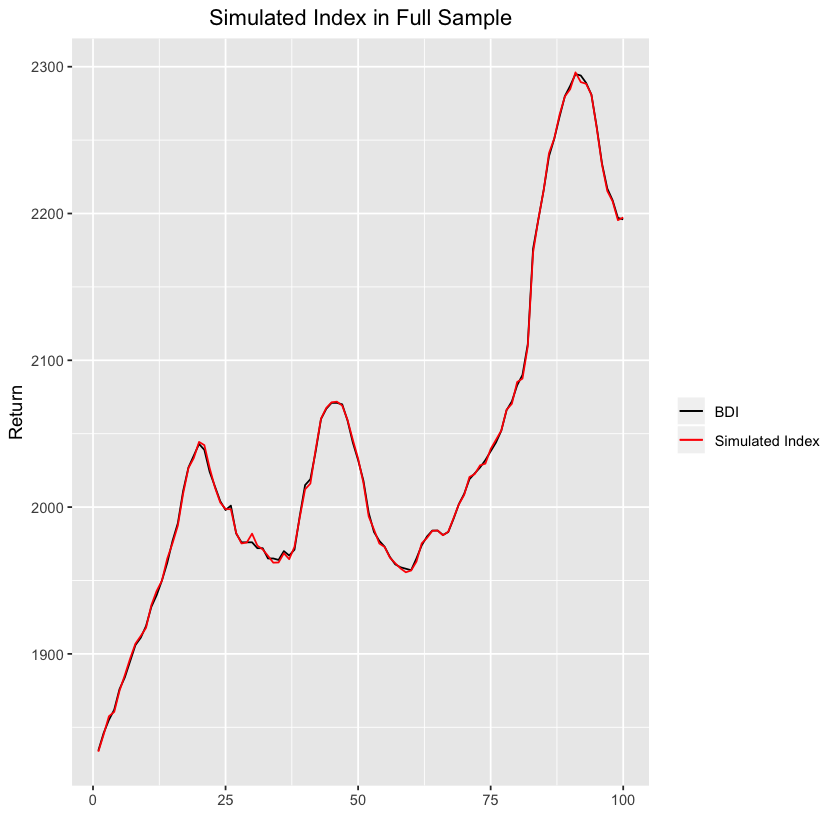

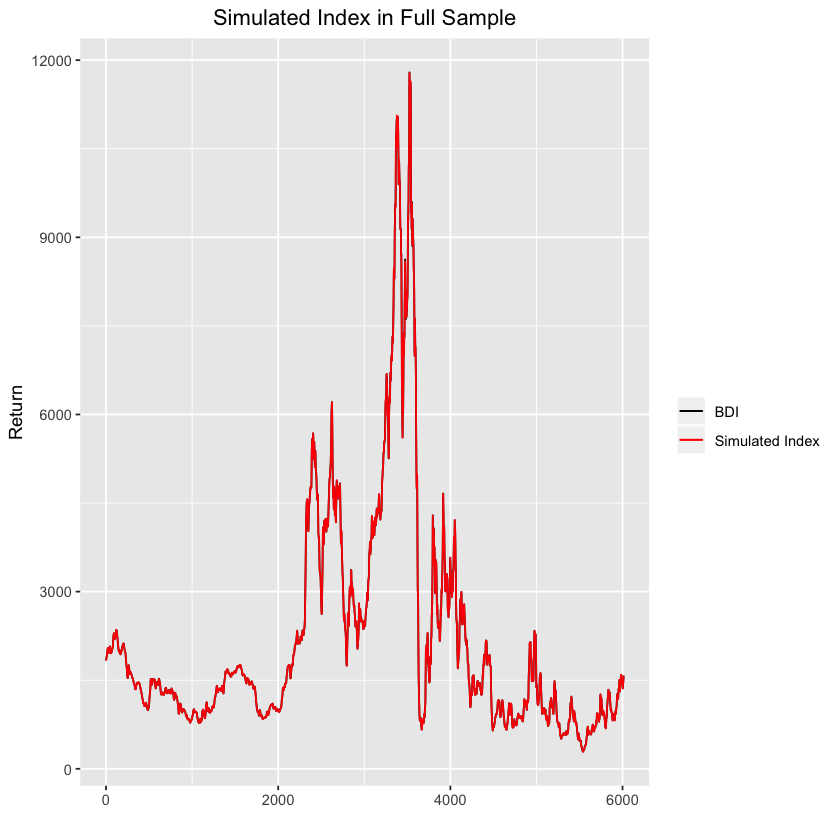

In [14]:
rbp1 <- seq((tp+21),dim(r.data)[1],rf)
rbpc1 <- c(rbp1, (dim(r.data)[1])+1)
os1 <- list()
ossummary1 <- list()
oscoef1 <- list()
ossr1 <- list()
ossri1 <- NULL
v.int1 <- NULL
r.data.rb <- r.data[,-2]

for(i in 1:length(rbp1)) {
  os1[[i]] <- lm(formula = BDI.csv ~ ., data = r.data[(rbp1[i]-tp):(rbp1[i]-1),])
  ossummary1[[i]] <- summary(os1[[i]])
  oscoef1[[i]] <- os1[[i]]$coefficients[-1]
}

for(i in 1:length(n.r.data)) {
  store <- NULL
  for(j in 1:(length(rbpc1)-1)) {
    store <- c(store, (oscoef1[[j]][i])*r.data.rb[rbpc1[j]:(rbpc1[j+1]-1),i])
  }
  ossr1[[i]] <- store
}
names(ossr1) <- n.r.data

ospr1 <- apply(X = as.matrix(as.data.frame(ossr1)), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
ostr1 <- sd(ospr1 - r.data[rbp1[1]:dim(r.data)[1],n])
p.stab1 <- lm(formula = r.data[rbp1[1]:dim(r.data)[1],n] ~ ospr1)
s.p.stab1 <- summary(p.stab1)
pv1 <- 2*pt(-abs((s.p.stab1$coefficients[2,1]-1)/s.p.stab1$coefficients[2,2]), df = s.p.stab1$df[2])

osdf1 <- data.frame(Order = 1:length((tp+21):dim(r.data)[1]), BDI.Return = r.data[(tp+21):dim(r.data)[1],n], Portfolio.Return = ospr1, BDI = sBDI.csv[(tp+21):dim(r.data)[1]], Simulated.Index = (1+ospr1)*sBDI.csv[(tp+21):dim(r.data)[1]])
ggplot(data = osdf1[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df1[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = df1, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Full Sample") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))     

## Forecasting Rolling Window Regression

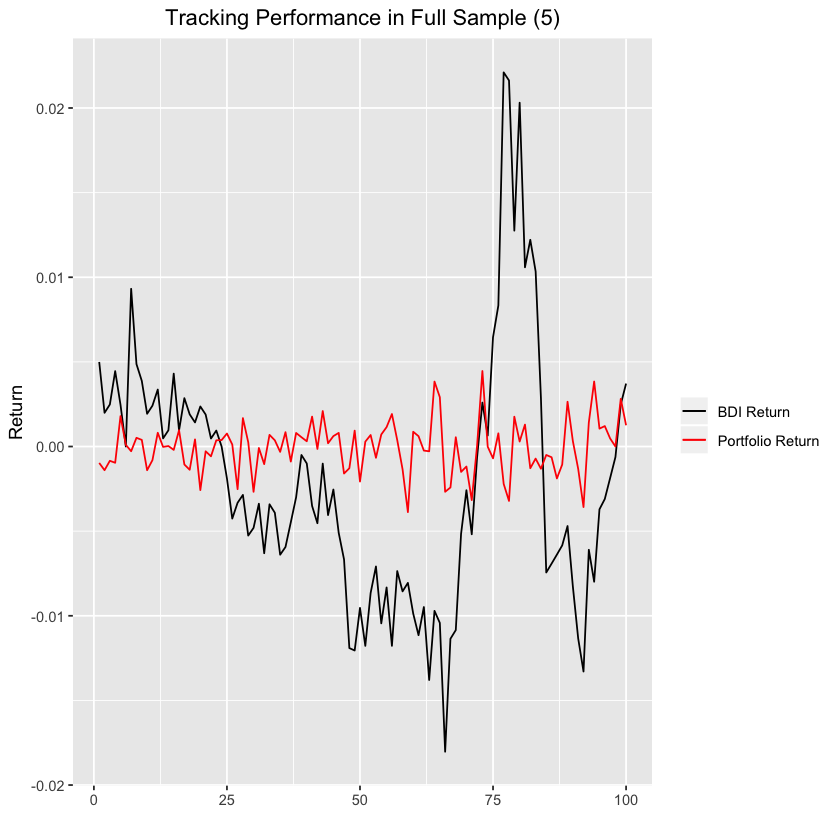

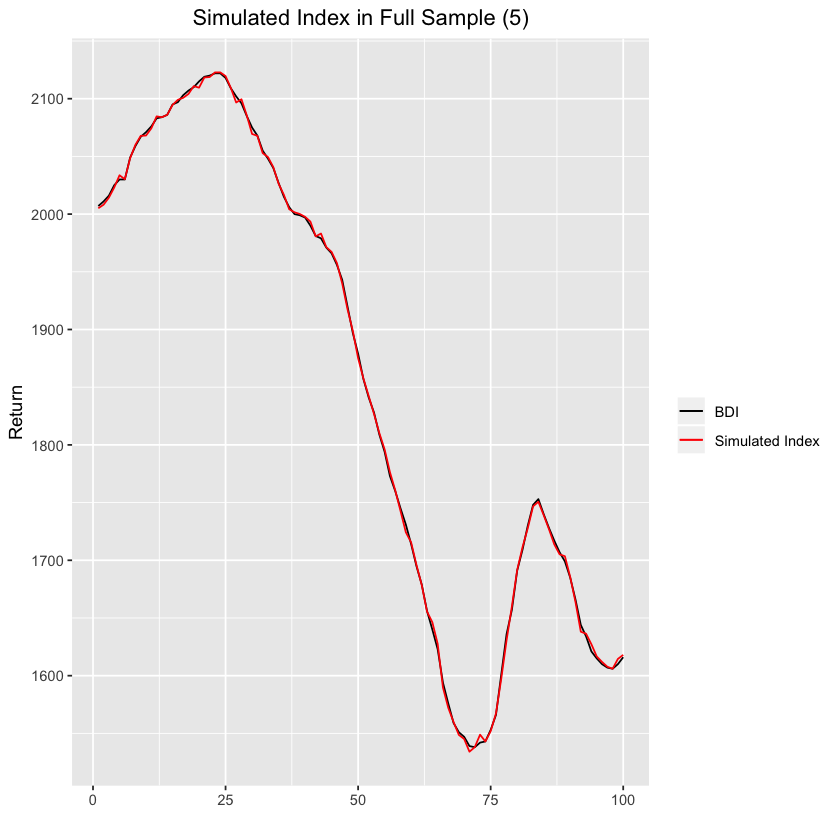

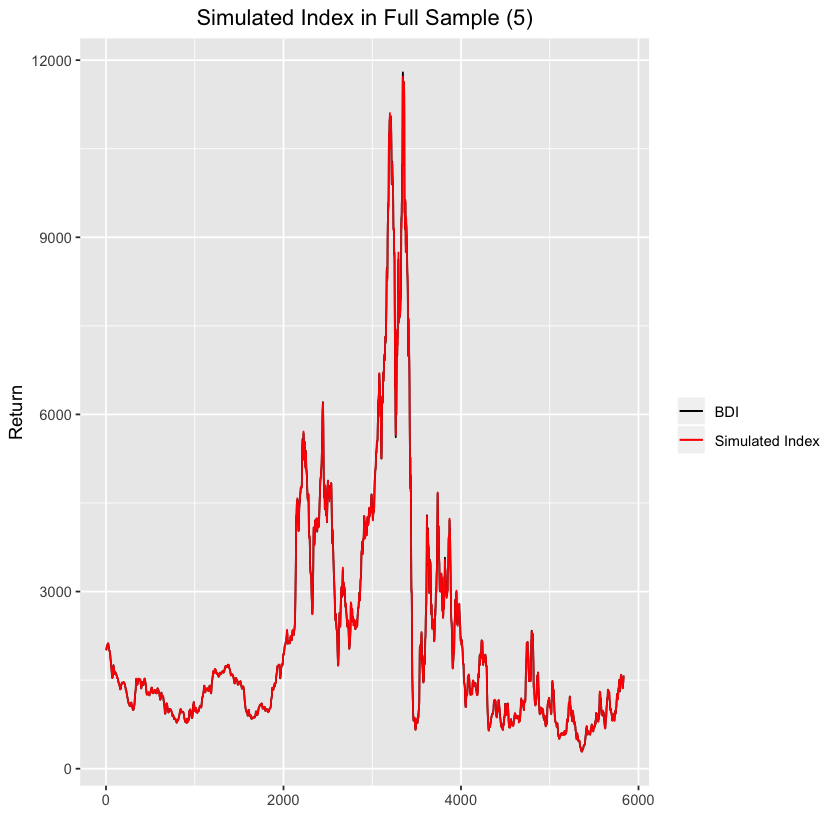

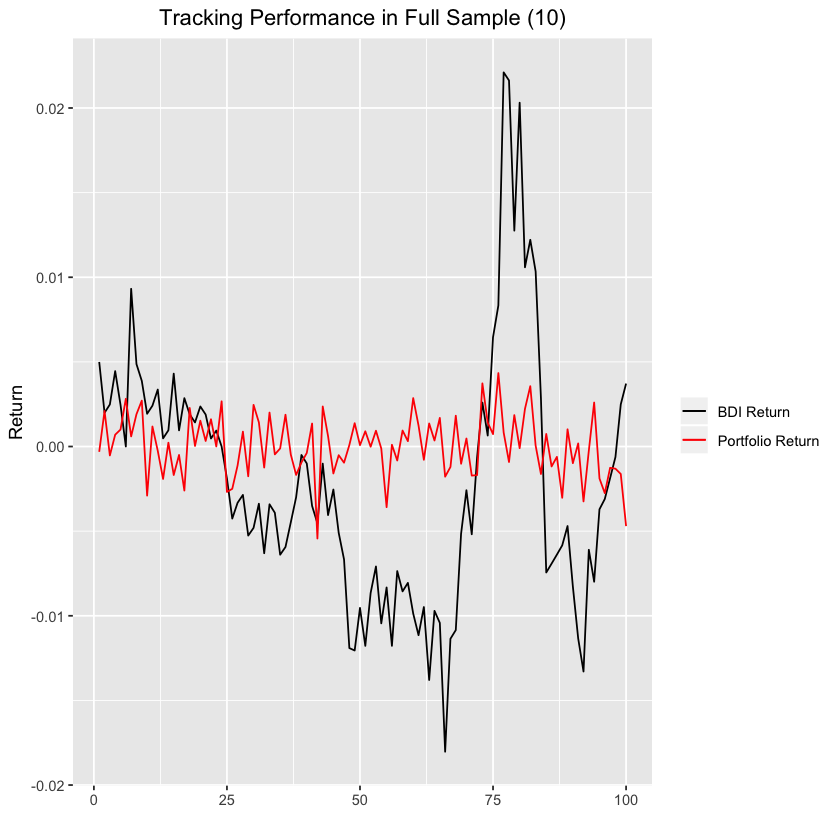

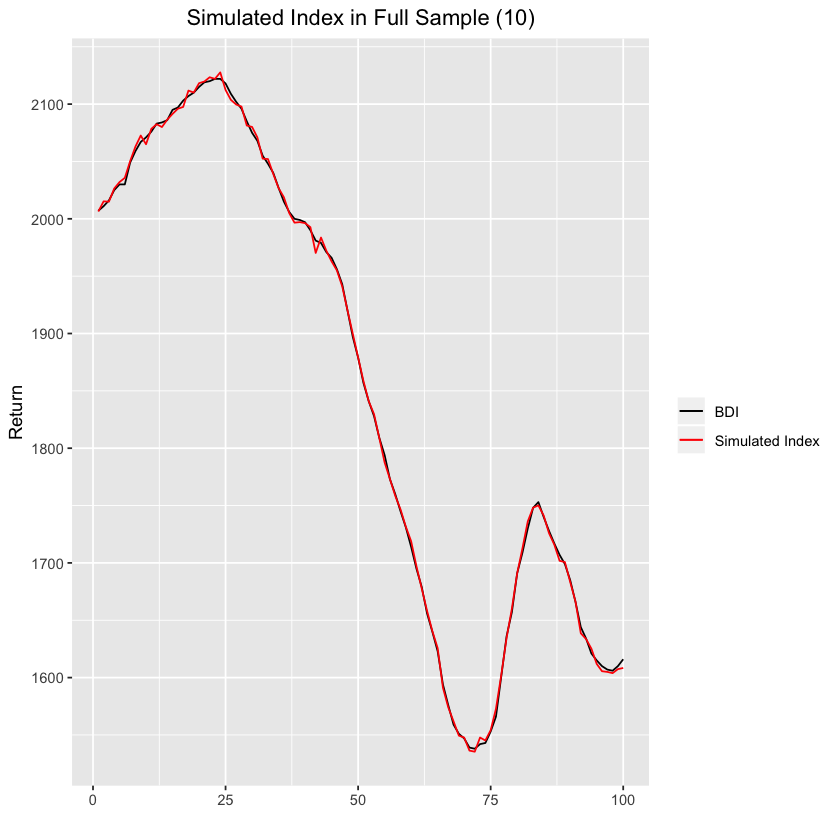

...

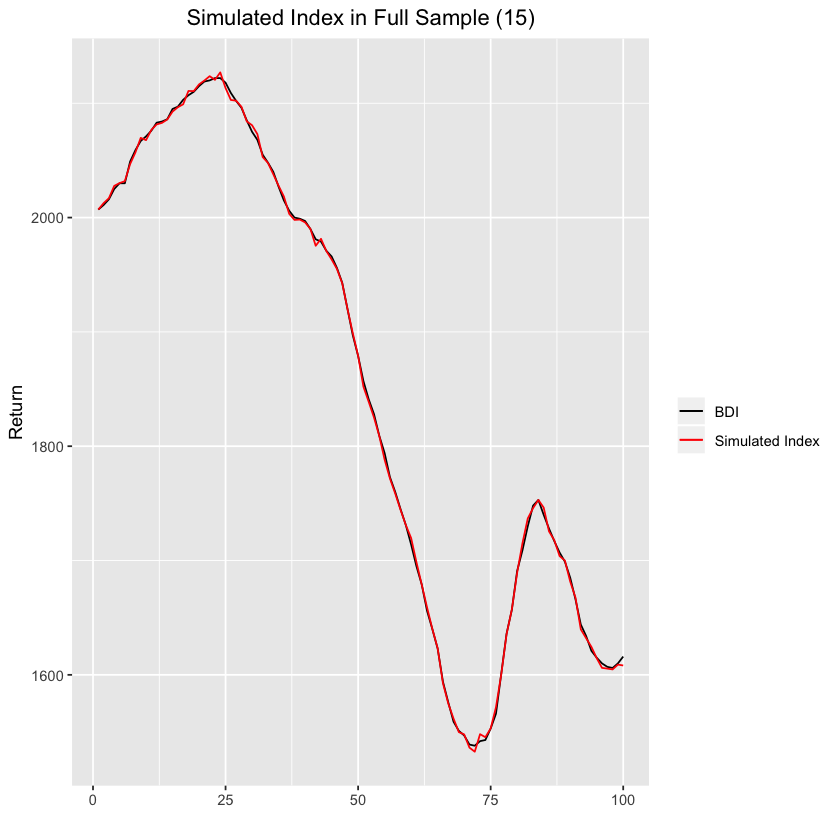

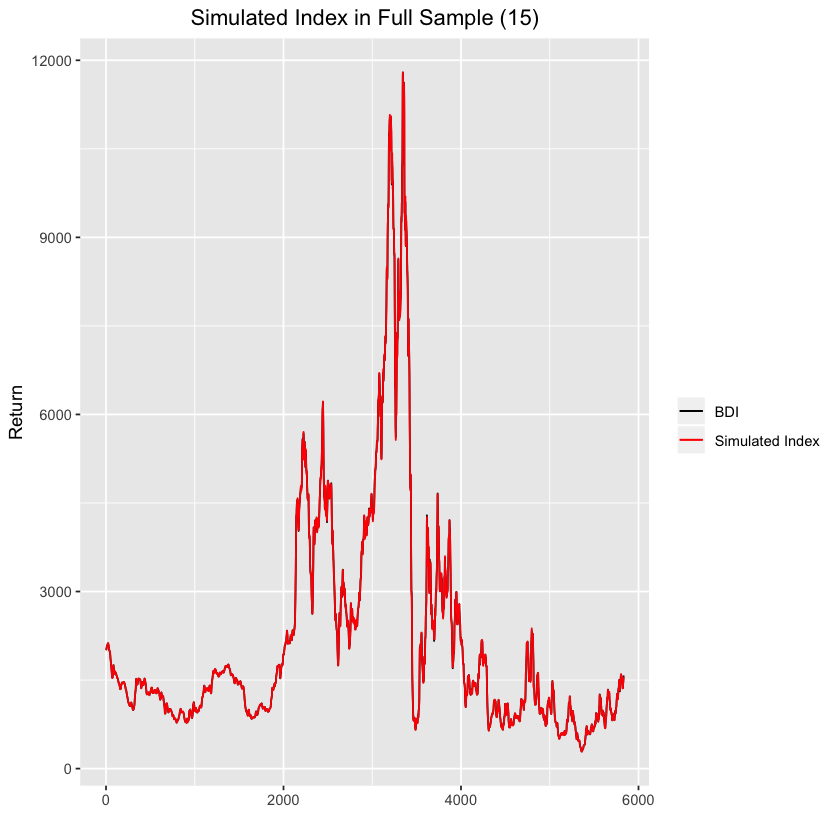

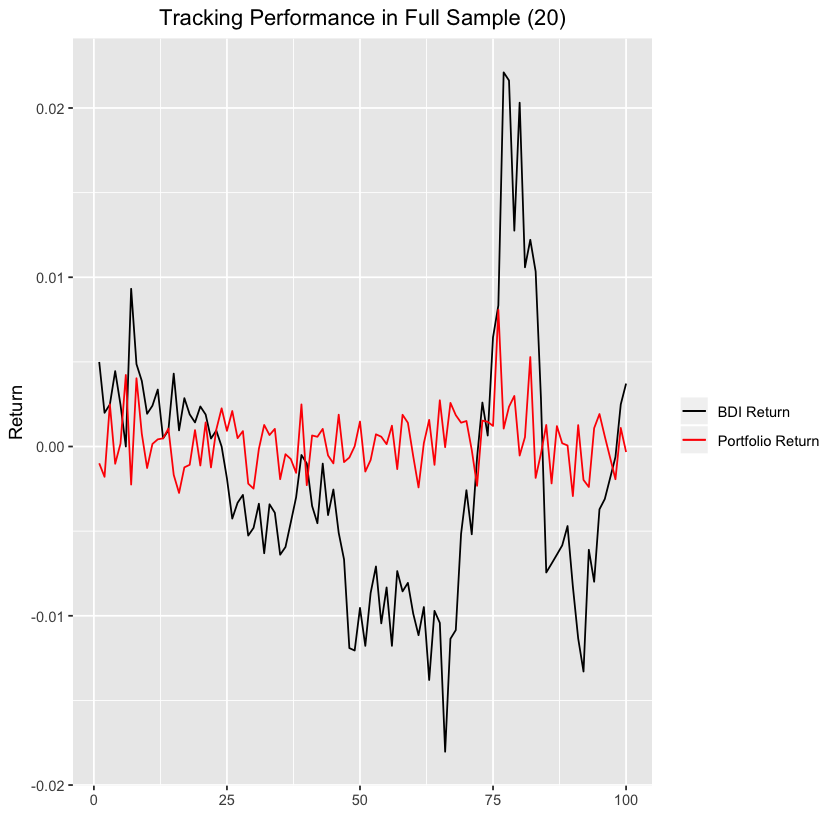

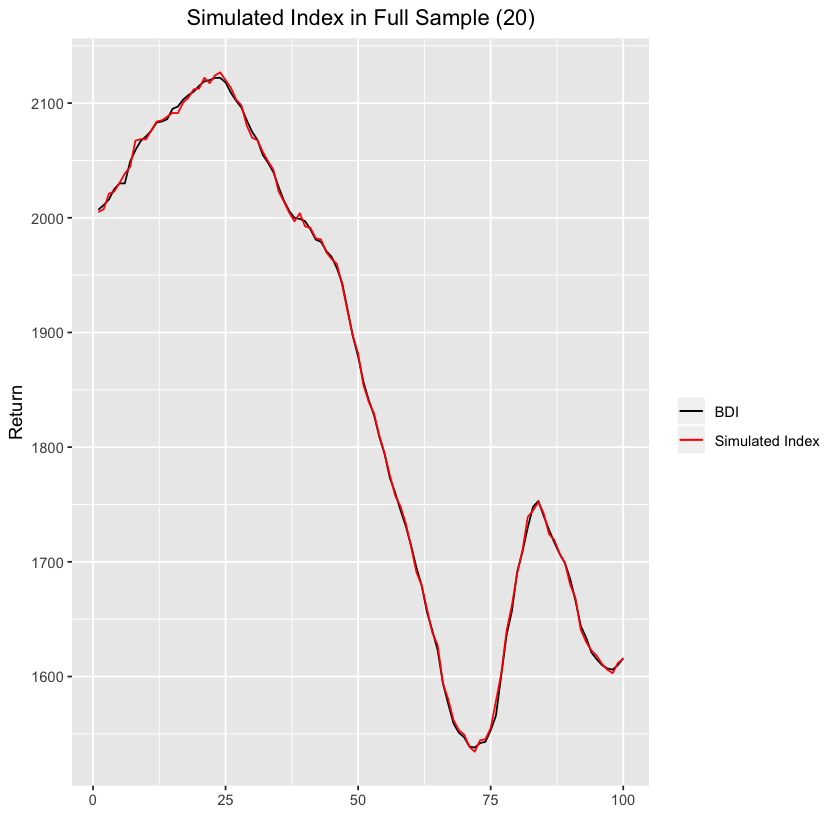

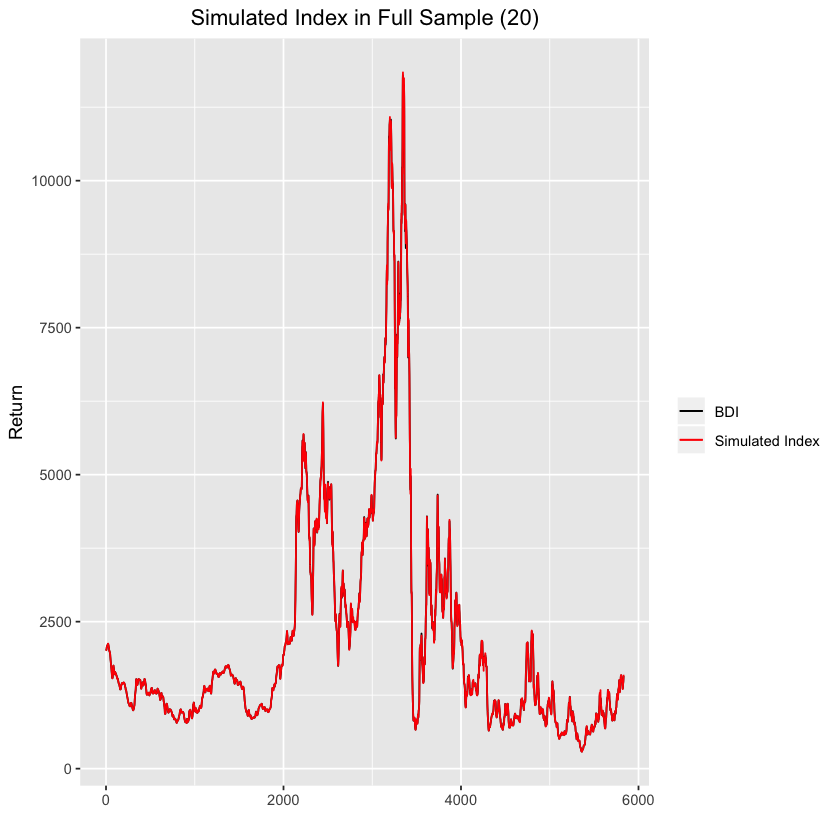

In [15]:
os2 <- list()
ossummary2 <- list()
oscoef2 <- list()
ossr2 <- list()
ossri2 <- list()
ospr2 <- list()
osts2 <- list()
ostr2 <- list()
v.int2 <- list()
oscorr2 <- list()
oscori2 <- list()
oscort2 <- list()
oscortt2 <- list()
p.stab2 <- list()
s.p.stab2 <- list()
pv2 <- list()
osdf2 <- list()

rbp2 <- rbp1
for(i in 1:4) {
    x <- i * 5
    la <- list()
    lb <- list()
    lc <- list()
    for(j in 1:length(rbp2)) {
        ind.r.data <- paste0("r.data$", n.r.data, "[((rbp2[j]-tp):(rbp2[j]-1))-x]",sep = " ", collapse = "+")
        dep <- paste0("r.data[(rbp2[j]-tp)",":(rbp2[j]-1),n]")
        la[[j]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
        lb[[j]] <- summary(la[[j]])
        lc[[j]] <- la[[j]]$coefficients[-1]
    }
    os2[[i]] <- la
    ossummary2[[i]] <- lb
    oscoef2[[i]] <- lc
}

for(i in 1:4) {
    x <- i * 5
    rbpc2 <- c(rbp2, (dim(r.data)[1]+1))
    list.s <- list()
    for(j in 1:length(n.r.data)) {
        store <- NULL
        for(k in 1:(length(rbpc2)-1)) {
            store <- c(store, oscoef2[[i]][[k]][j]*r.data.rb[rbpc2[k]:(rbpc2[k+1]-1),j])
        }
        list.s[[j]] <- store
    }
    ossr2[[i]] <- list.s
    names(ossr2[[i]]) <- n.r.data
}

for(i in 1:4) {
    x <- i * 5
    ospr2[[i]] <- apply(X = as.matrix(as.data.frame(ossr2[[i]])), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
    ostr2[[i]] <- sd(ospr2[[i]] - r.data[rbp2[1]:dim(r.data)[1],n])
    p.stab2[[i]] <- lm(formula = r.data[rbp2[1]:dim(r.data)[1],n] ~ ospr2[[i]])
    s.p.stab2[[i]] <- summary(p.stab2[[i]])
    pv2[[i]] <- pv1 <- 2*pt(-abs((s.p.stab2[[i]]$coefficients[2,1]-1)/s.p.stab2[[i]]$coefficients[2,2]), df = s.p.stab2[[i]]$df[2])
    osdf2[[i]] <- data.frame(Order = 1:length((tp+21):dim(r.data)[1]), BDI.Return = r.data[(tp+21):dim(r.data)[1],n], Portfolio.Return = ospr2[[i]], BDI = sBDI.csv[(tp+21):dim(r.data)[1]], Simulated.Index = (1+ospr2[[i]])*sBDI.csv[(tp+21):dim(r.data)[1]])
    print(ggplot(data = osdf2[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf2[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf2[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Full Sample",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# Sub-Sample 1 (1994/10/19-2003/08/29)
## Contemporaneous Rolling Window Regression

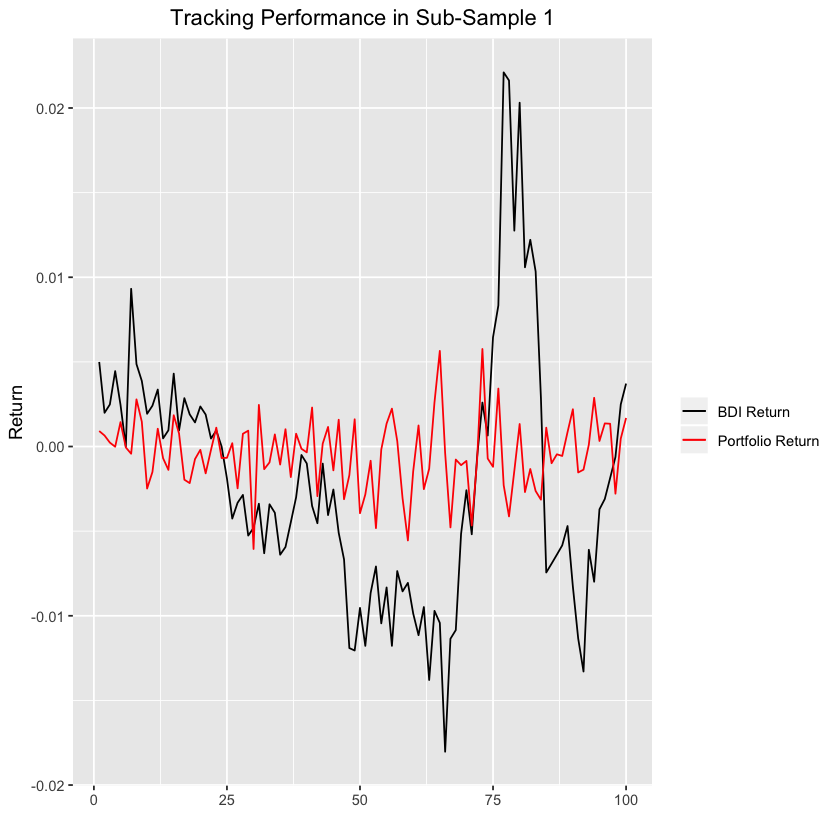

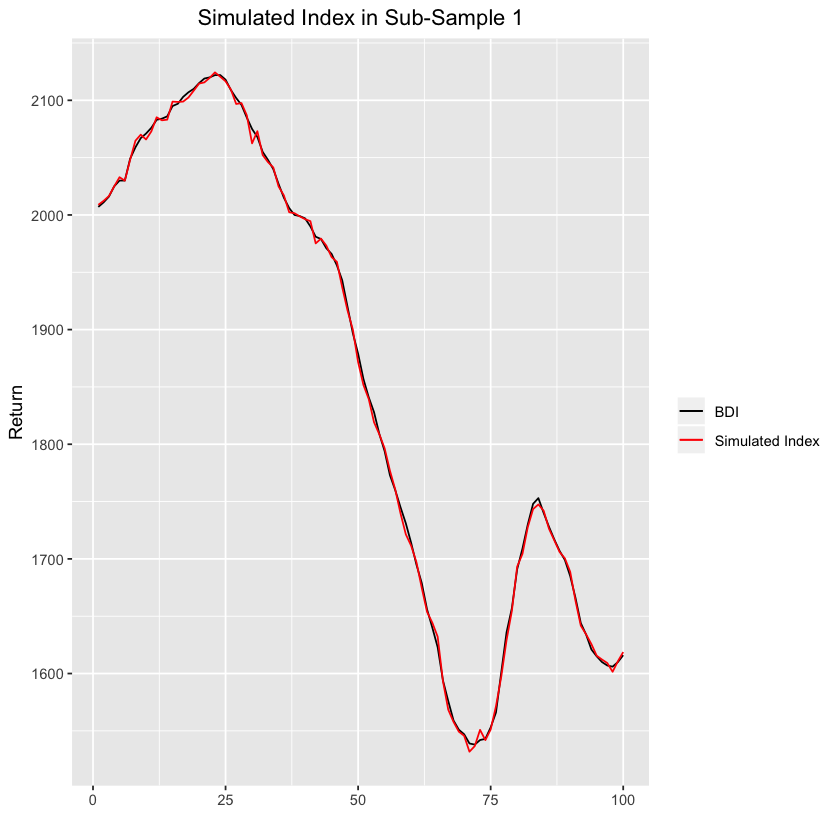

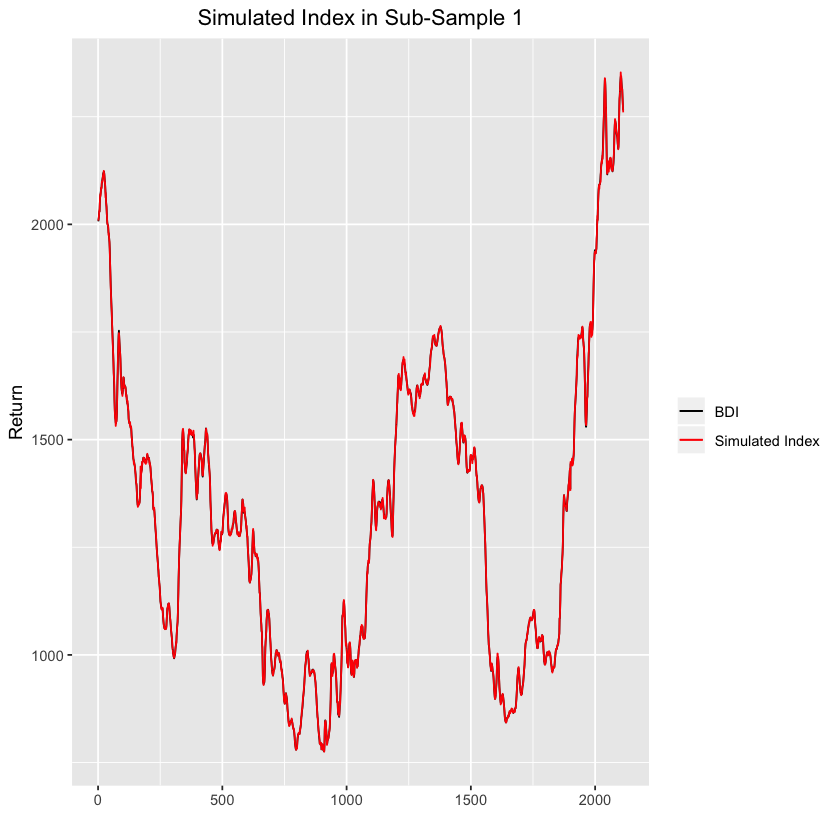

In [16]:
rbp3 <- seq((tp+21), sub1,rf)
rbpc3 <- c(rbp3, sub1+1)
os3 <- list()
ossummary3 <- list()
oscoef3 <- list()
ossr3 <- list()
ossri3 <- NULL
v.int3 <- NULL

for(i in 1:length(rbp3)) {
    os3[[i]] <- lm(formula = BDI.csv ~ ., data = r.data[(rbp3[i]-tp):(rbp3[i]-1),])
    ossummary3[[i]] <- summary(os3[[i]])
    oscoef3[[i]] <- os3[[i]]$coefficients[-1]
}

for(i in 1:length(n.r.data)) {
    store <- NULL
    for(j in 1:(length(rbpc3)-1)) {
        store <- c(store, (oscoef3[[j]][i])*r.data.rb[rbpc3[j]:(rbpc3[j+1]-1),i])
    }
    ossr3[[i]] <- store
}
names(ossr3) <- n.r.data

ospr3 <- apply(X = as.matrix(as.data.frame(ossr3)), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
ostr3 <- sd(ospr3 - r.data[rbp3[1]:sub1,n])
p.stab3 <- lm(formula = r.data[rbp3[1]:sub1,n] ~ ospr3)
s.p.stab3 <- summary(p.stab3)
pv3 <- 2*pt(-abs((s.p.stab3$coefficients[2,1]-1)/s.p.stab3$coefficients[2,2]), df = s.p.stab3$df[2])

osdf3 <- data.frame(Order = 1:length((tp+21):sub1), BDI.Return= r.data[(tp+21):sub1,n], Portfolio.Return = ospr3, BDI = sBDI.csv[(tp+21):sub1], Simulated.Index = (1+ospr3)*sBDI.csv[(tp+21):sub1])
ggplot(data = osdf3[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf3[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf3, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 1") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Rolling Window Regression

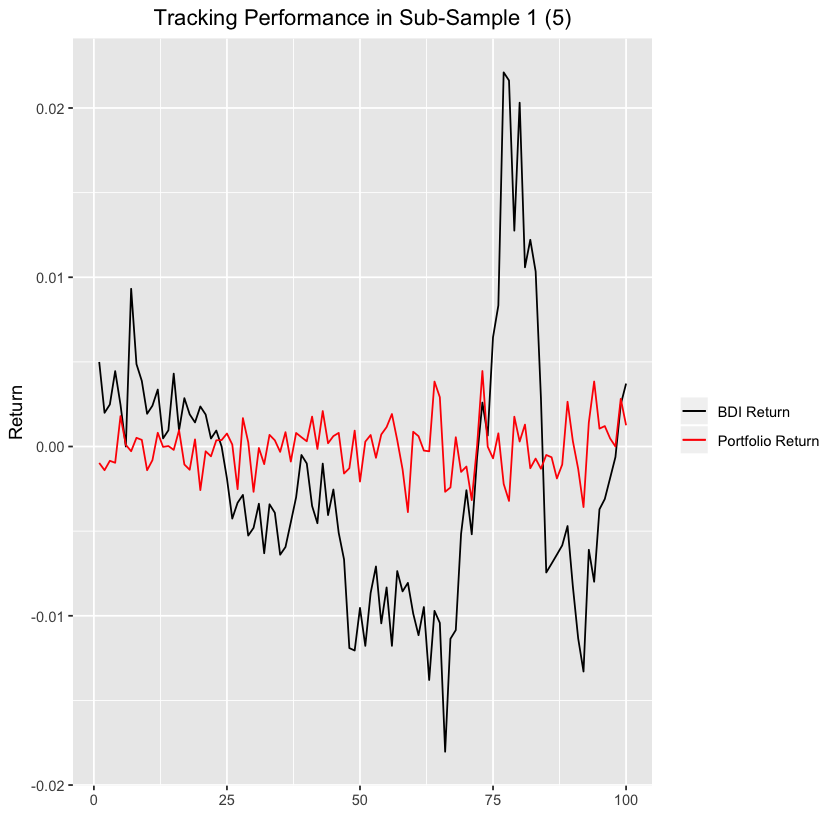

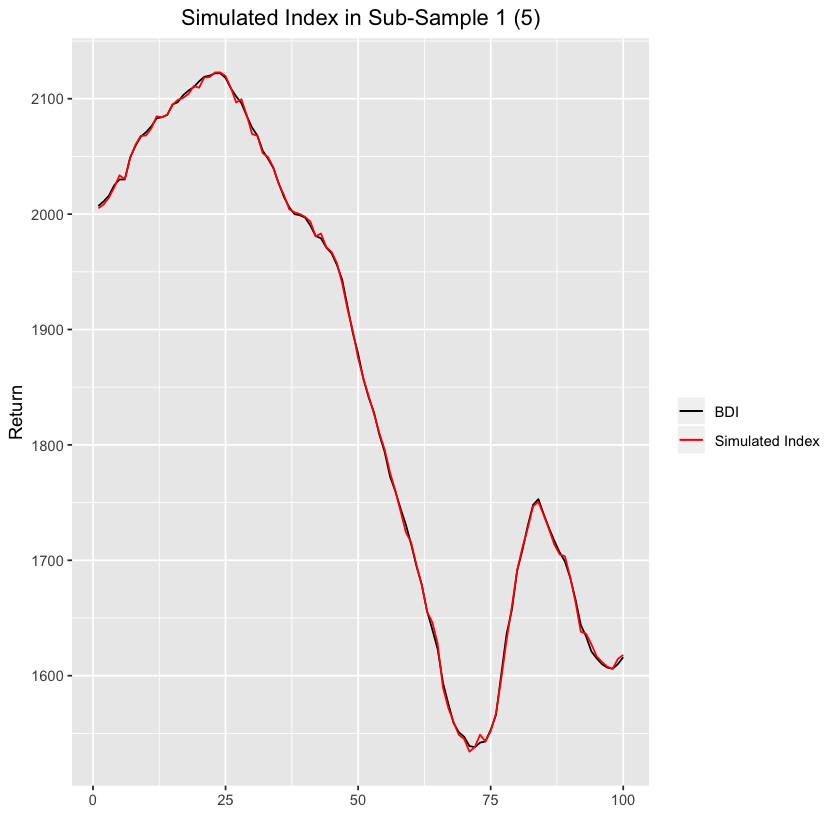

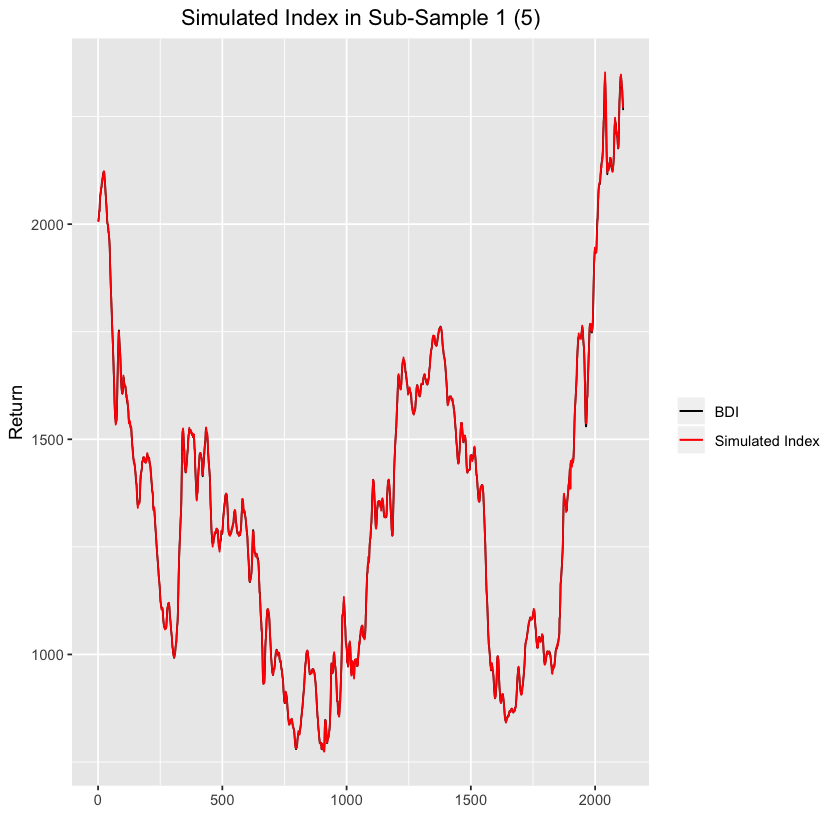

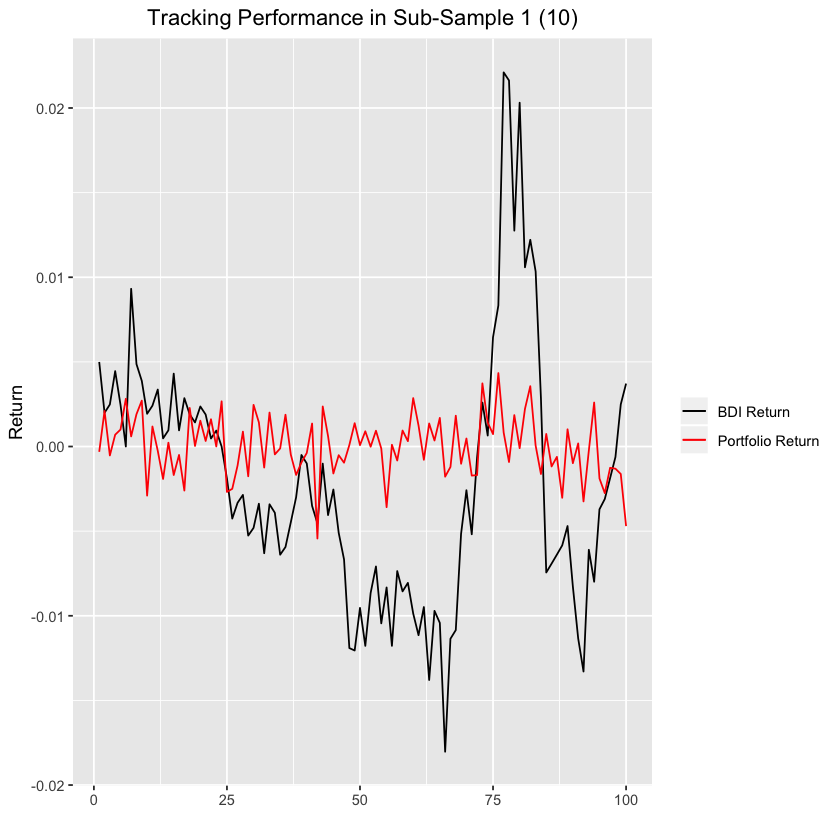

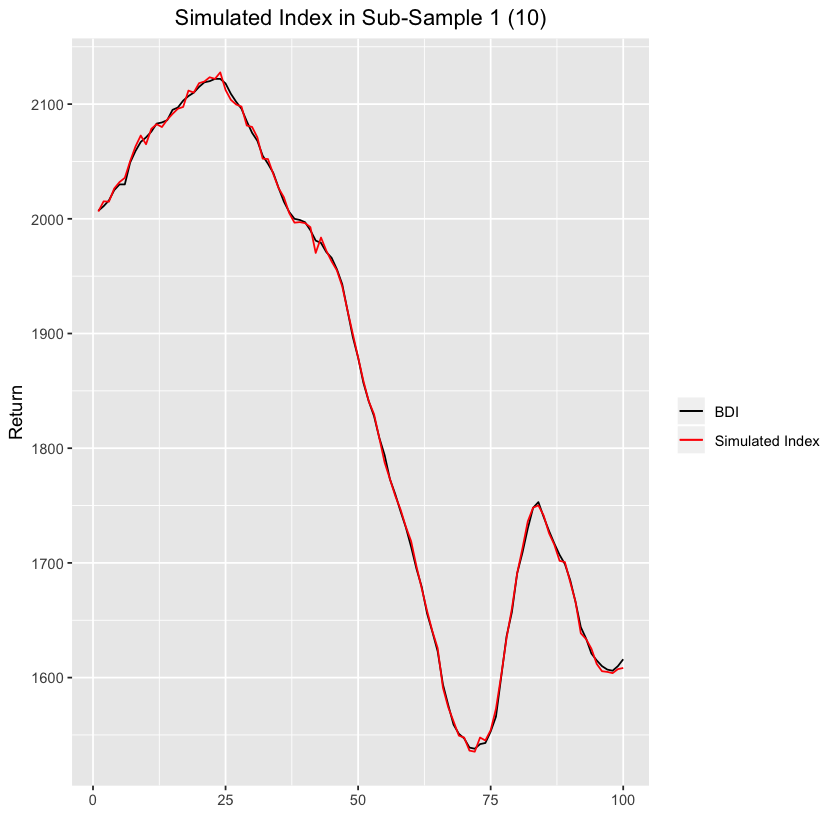

...

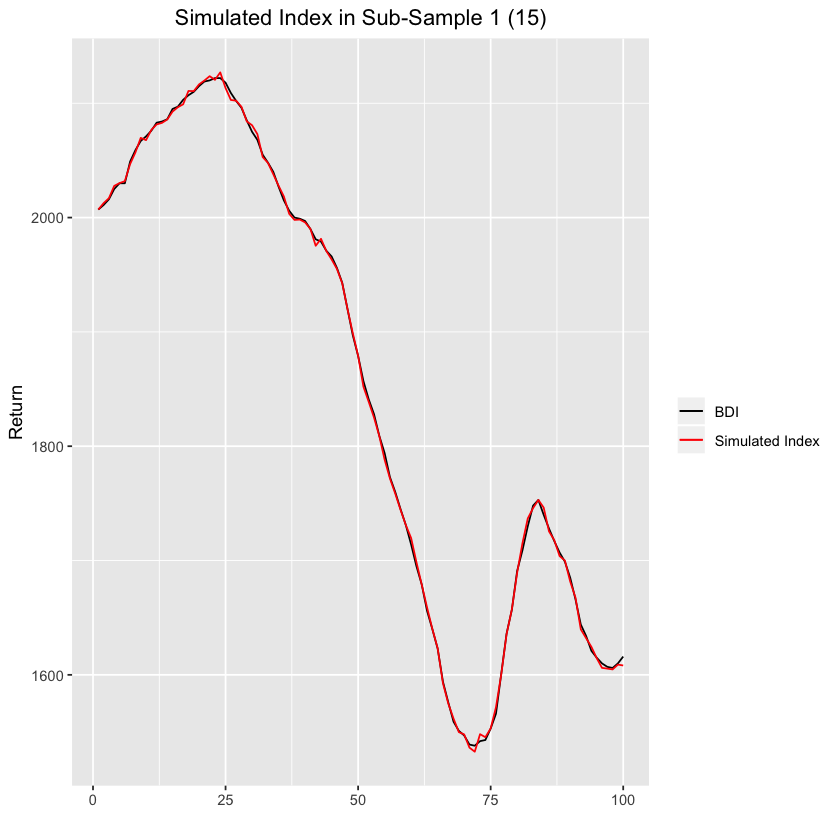

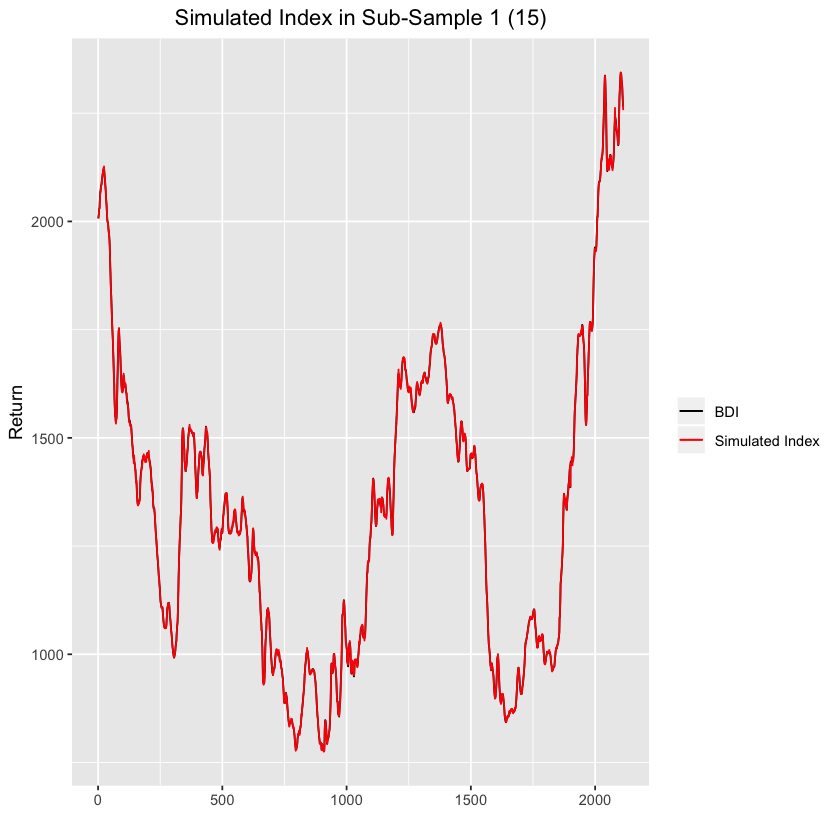

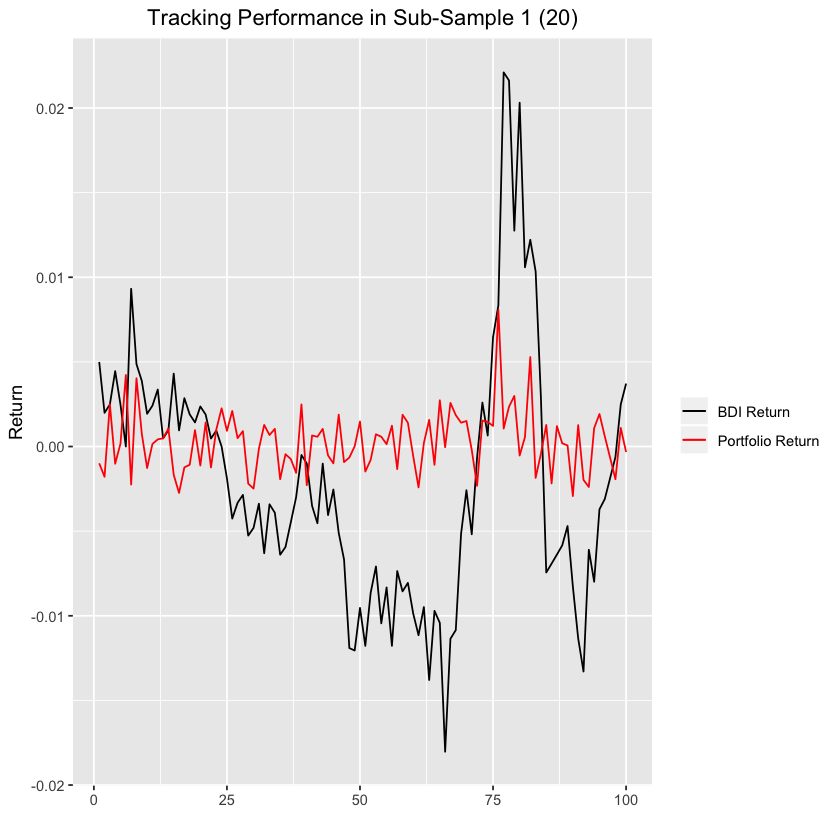

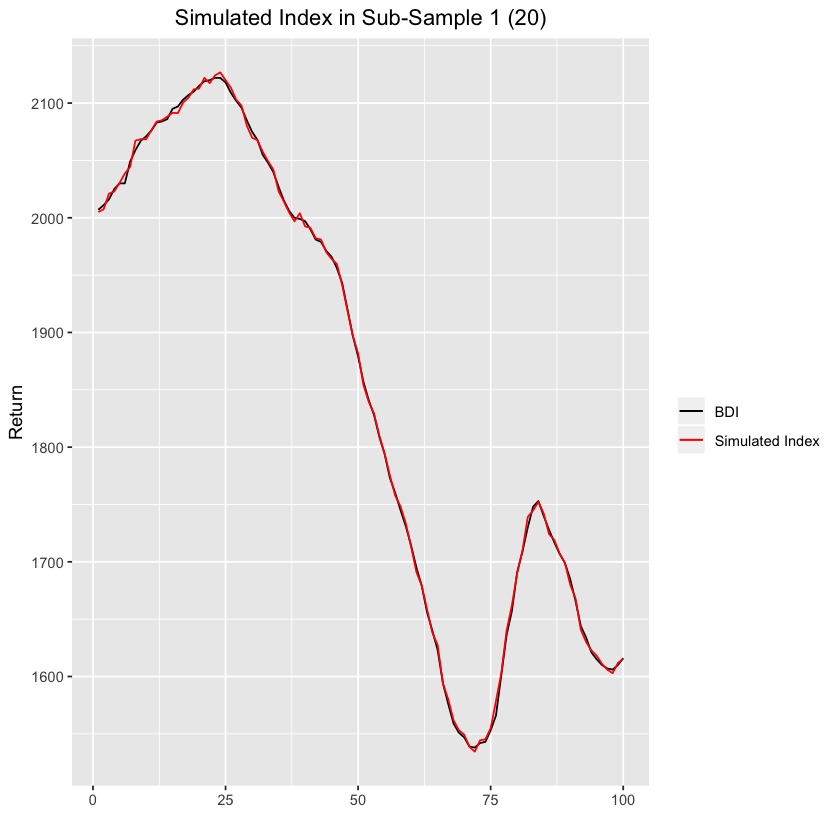

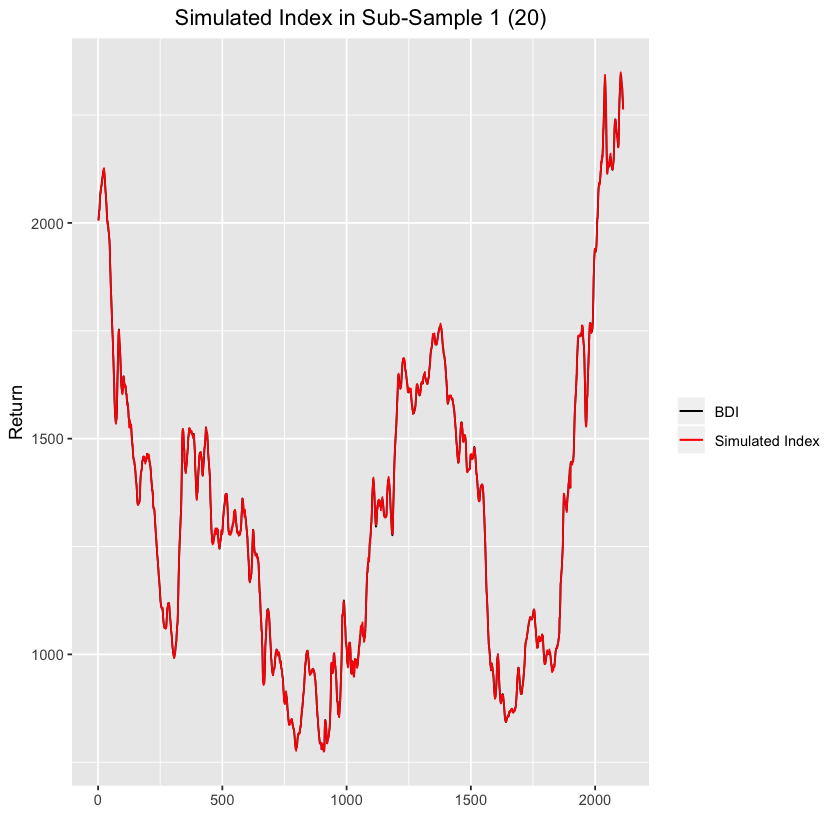

In [17]:
os4 <- list()
ossummary4 <- list()
oscoef4 <- list()
ossr4 <- list()
ossri4 <- list()
ospr4 <- list()
osts4 <- list()
ostr4 <- list()
v.int4 <- list()
oscorr4 <- list()
oscori4 <- list()
oscort4 <- list()
oscortt4 <- list()
p.stab4 <- list()
s.p.stab4 <- list()
pv4 <- list()
osdf4 <- list()

rbp4 <- rbp3
for(i in 1:4) {
    x <- i * 5
    la <- list()
    lb <- list()
    lc <- list()
    for(j in 1:length(rbp4)) {
        ind.r.data <- paste0("r.data$", n.r.data, "[((rbp4[j]-tp):(rbp4[j]-1))-x]",sep = " ", collapse = "+")
        dep <- paste0("r.data[(rbp4[j]-tp)",":(rbp4[j]-1),n]")
        la[[j]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
        lb[[j]] <- summary(la[[j]])
        lc[[j]] <- la[[j]]$coefficients[-1]
    }
    os4[[i]] <- la
    ossummary4[[i]] <- lb
    oscoef4[[i]] <- lc
}

for(i in 1:4) {
    x <- i * 5
    rbpc4 <- c(rbp4, sub1+1)
    list.s <- list()
    for(j in 1:length(n.r.data)) {
        store <- NULL
        for(k in 1:(length(rbpc4)-1)) {
            store <- c(store, oscoef4[[i]][[k]][j]*r.data.rb[rbpc4[k]:(rbpc4[k+1]-1),j])
            }
            list.s[[j]] <- store
        }
    ossr4[[i]] <- list.s
    names(ossr4[[i]]) <- n.r.data
}

for(i in 1:4) {
    x <- i * 5
    ospr4[[i]] <- apply(X = as.matrix(as.data.frame(ossr4[[i]])), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
    osts4[[i]] <- ospr4[[i]] - r.data[rbp4[1]:sub1,n]
    ostr4[[i]] <- sd(osts4[[i]])
    p.stab4[[i]] <- lm(formula = r.data[rbp4[1]:sub1,n] ~ ospr4[[i]])
    s.p.stab4[[i]] <- summary(p.stab4[[i]])
    pv4[[i]] <- pv1 <- 2*pt(-abs((s.p.stab4[[i]]$coefficients[2,1]-1)/s.p.stab4[[i]]$coefficients[2,2]), df = s.p.stab4[[i]]$df[2])
    osdf4[[i]] <- data.frame(Order = 1:length((tp+21):sub1), BDI.Return = r.data[(tp+21):sub1,n], Portfolio.Return = ospr4[[i]], BDI = sBDI.csv[(tp+21):sub1], Simulated.Index = (1+ospr4[[i]])*sBDI.csv[(tp+21):sub1])
    print(ggplot(data = osdf4[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf4[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf4[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 1",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# Sub-Sample 2 (2008/12/05-2017/11/30)
## Contemporaneous Rolling Window Regression

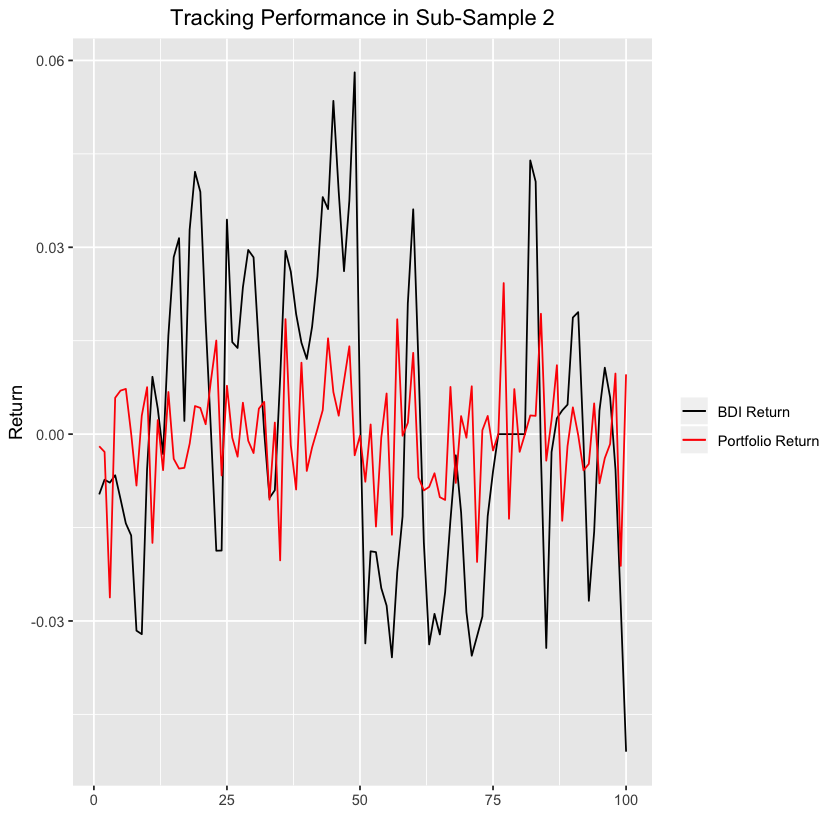

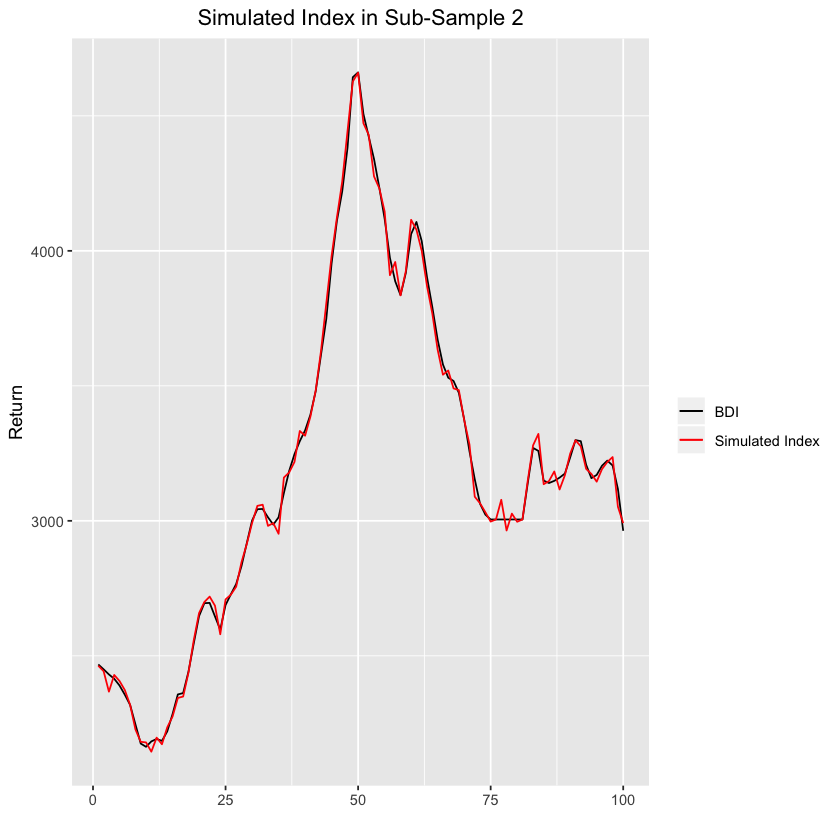

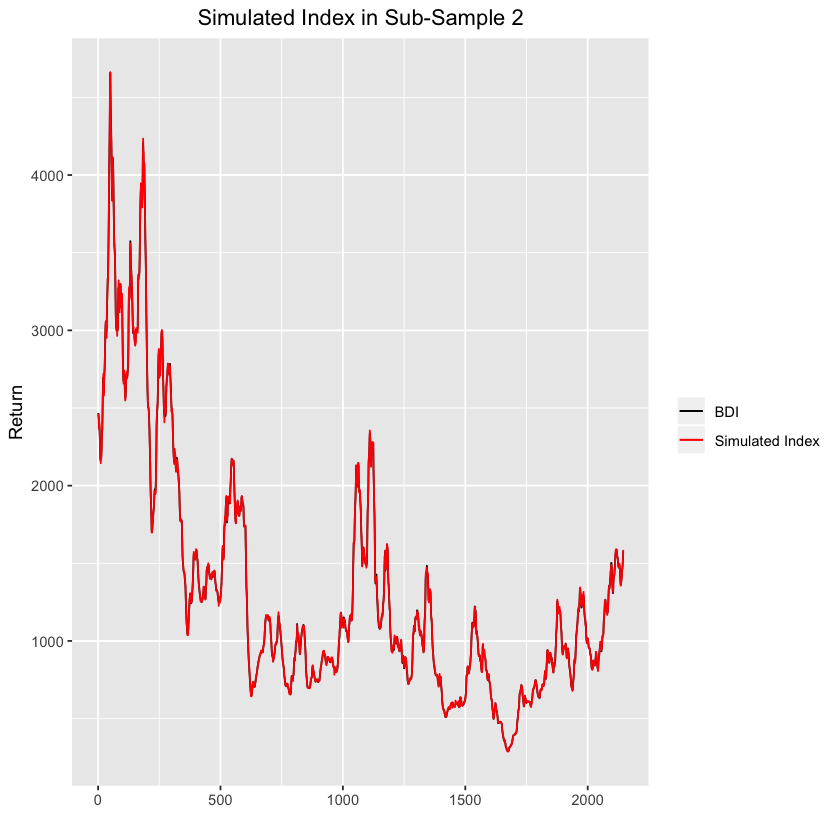

In [18]:
rbp5 <- seq((sub2+tp+20), dim(r.data)[1],rf)
rbpc5 <- c(rbp5, dim(r.data)[1]+1)
os5 <- list()
ossummary5 <- list()
oscoef5 <- list()
ossr5 <- list()
ossri5 <- NULL
v.int5 <- NULL

for(i in 1:length(rbp5)) {
    os5[[i]] <- lm(formula = BDI.csv ~ ., data = r.data[(rbp5[i]-tp):(rbp5[i]-1),])
    ossummary5[[i]] <- summary(os5[[i]])
    oscoef5[[i]] <- os5[[i]]$coefficients[-1]
}

for(i in 1:length(n.r.data)) {
    store <- NULL
    for(j in 1:(length(rbpc5)-1)) {
        store <- c(store, (oscoef5[[j]][i])*r.data.rb[rbpc5[j]:(rbpc5[j+1]-1),i])
    }
    ossr5[[i]] <- store
}
names(ossr5) <- n.r.data

ospr5 <- apply(X = as.matrix(as.data.frame(ossr5)), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
ostr5 <- sd(ospr5 - r.data[rbp5[1]:dim(r.data)[1],n])
p.stab5 <- lm(formula = r.data[rbp5[1]:dim(r.data)[1],n] ~ ospr5)
s.p.stab5 <- summary(p.stab5)
pv5 <- 2*pt(-abs((s.p.stab5$coefficients[2,1]-1)/s.p.stab5$coefficients[2,2]), df = s.p.stab5$df[2])

osdf5 <- data.frame(Order = 1:length((sub2+tp+20):dim(r.data)[1]), BDI.Return= r.data[(sub2+tp+20):dim(r.data)[1],n], Portfolio.Return = ospr5, BDI = sBDI.csv[(sub2+tp+20):dim(r.data)[1]], Simulated.Index = (1+ospr5)*sBDI.csv[(sub2+tp+20):dim(r.data)[1]])
ggplot(data = osdf5[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf5[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf5, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 2") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Rolling Window Regression

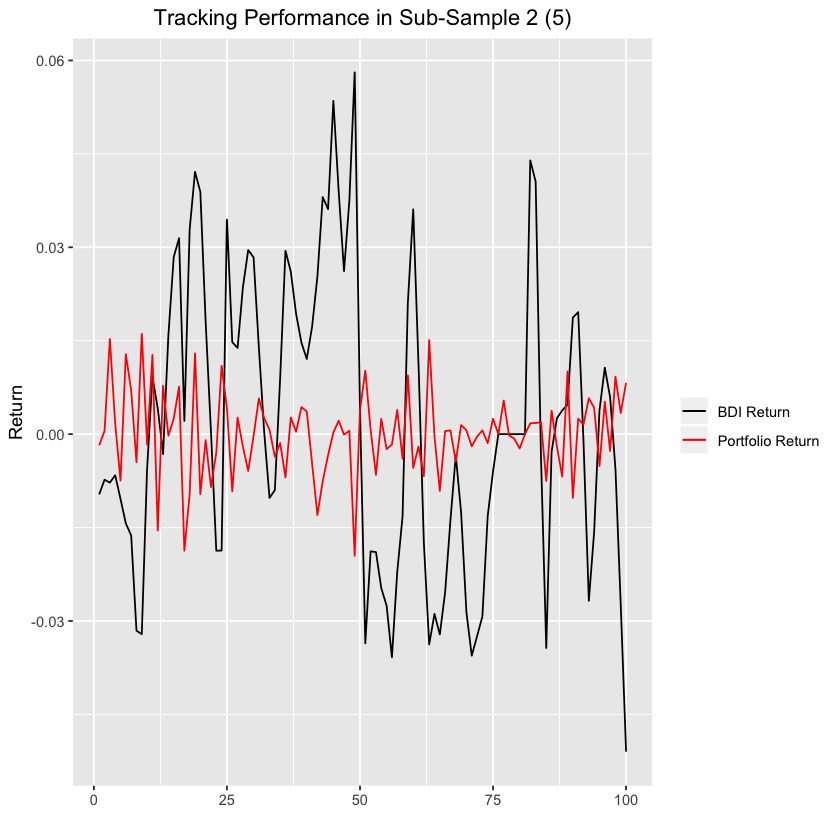

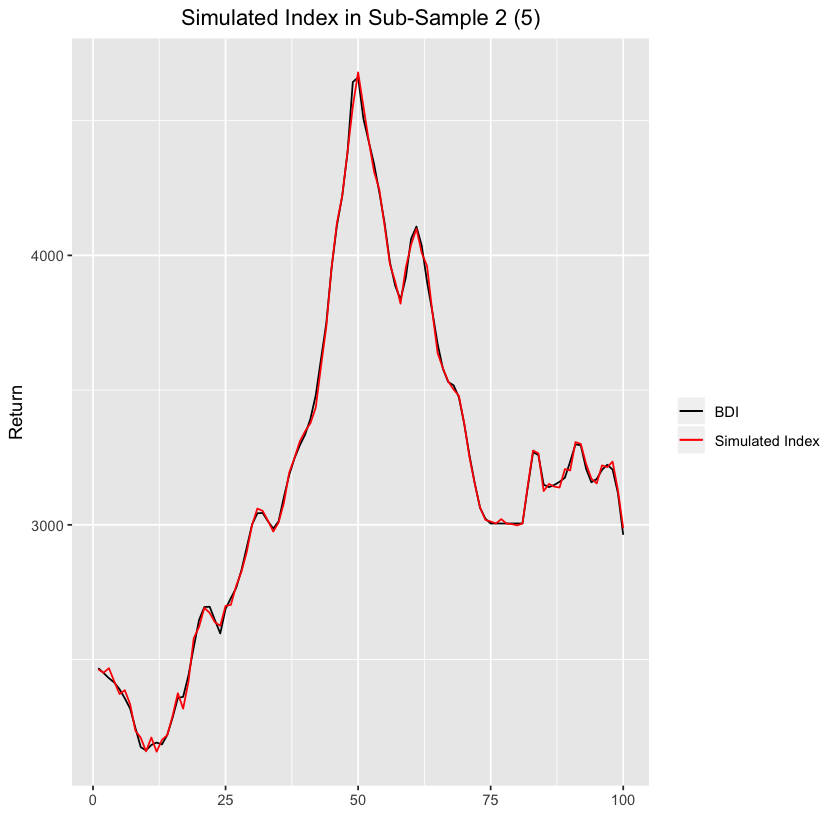

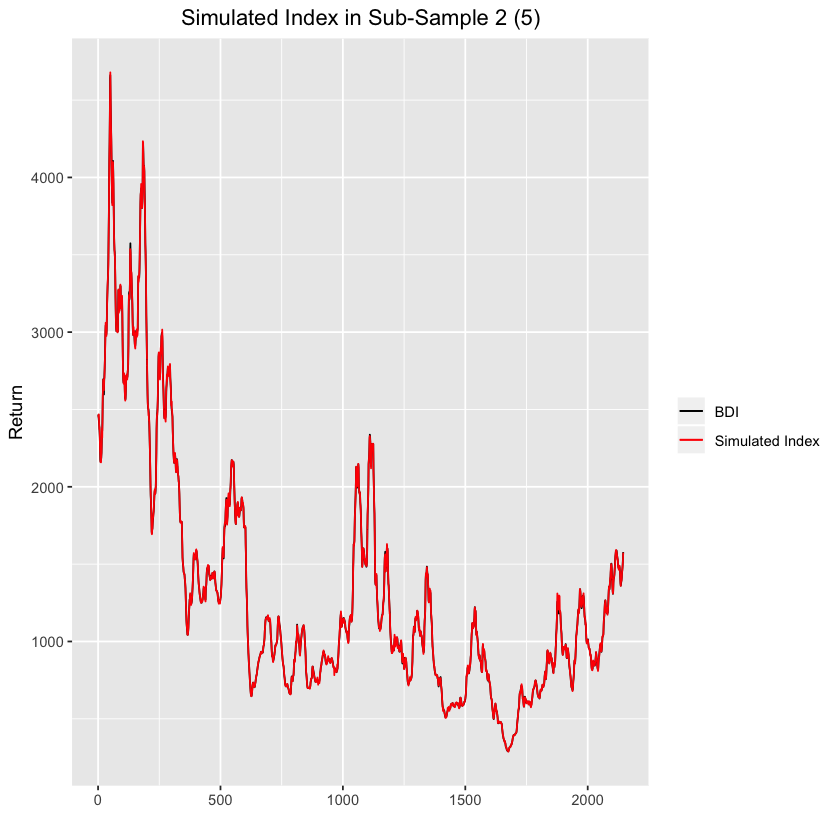

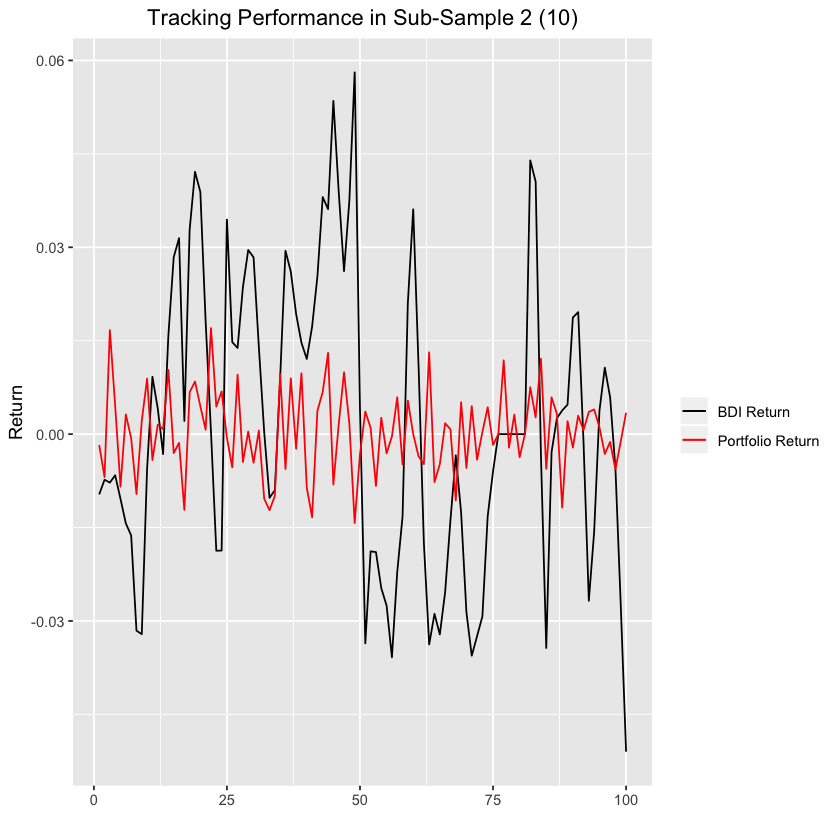

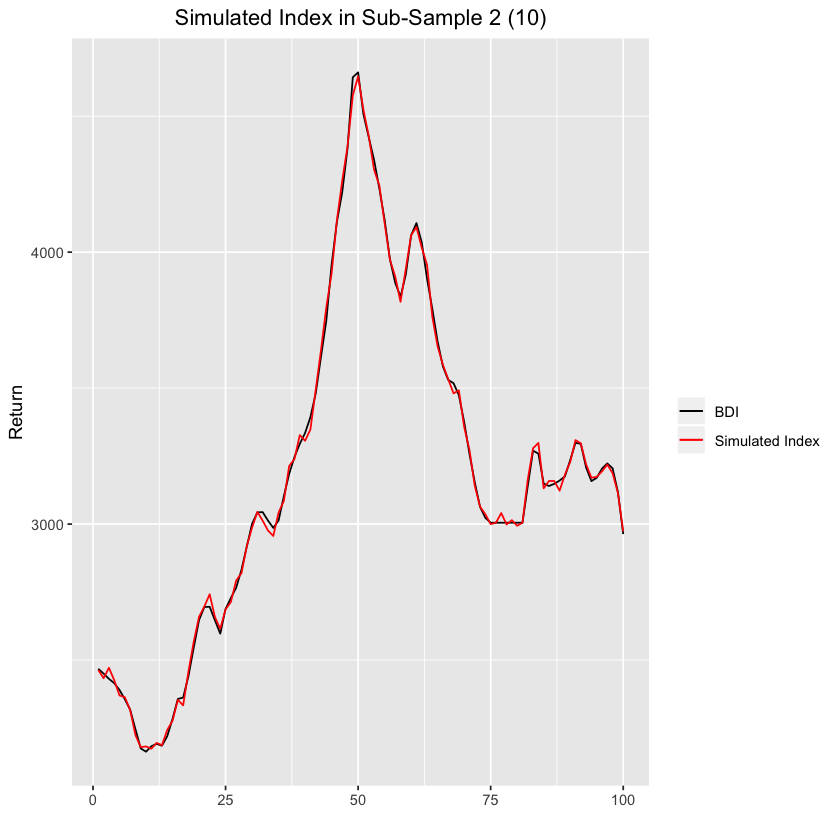

...

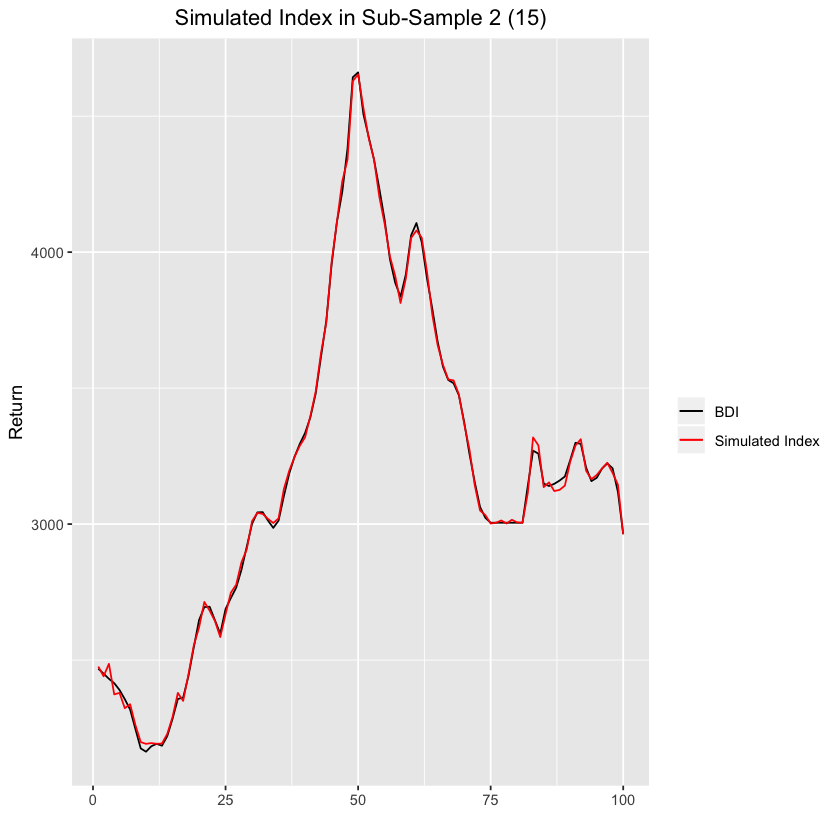

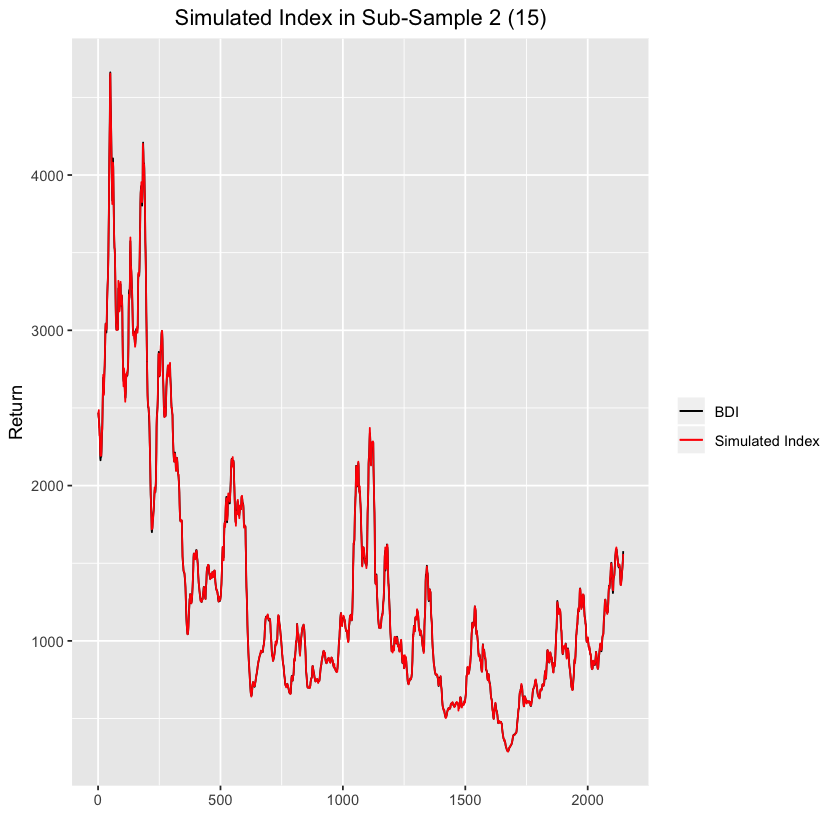

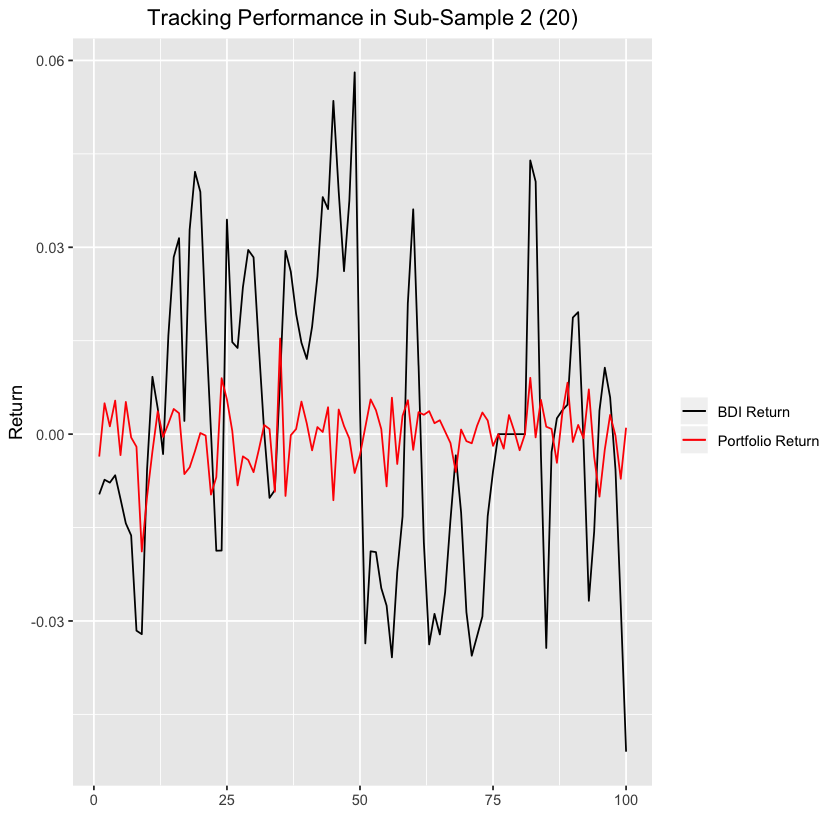

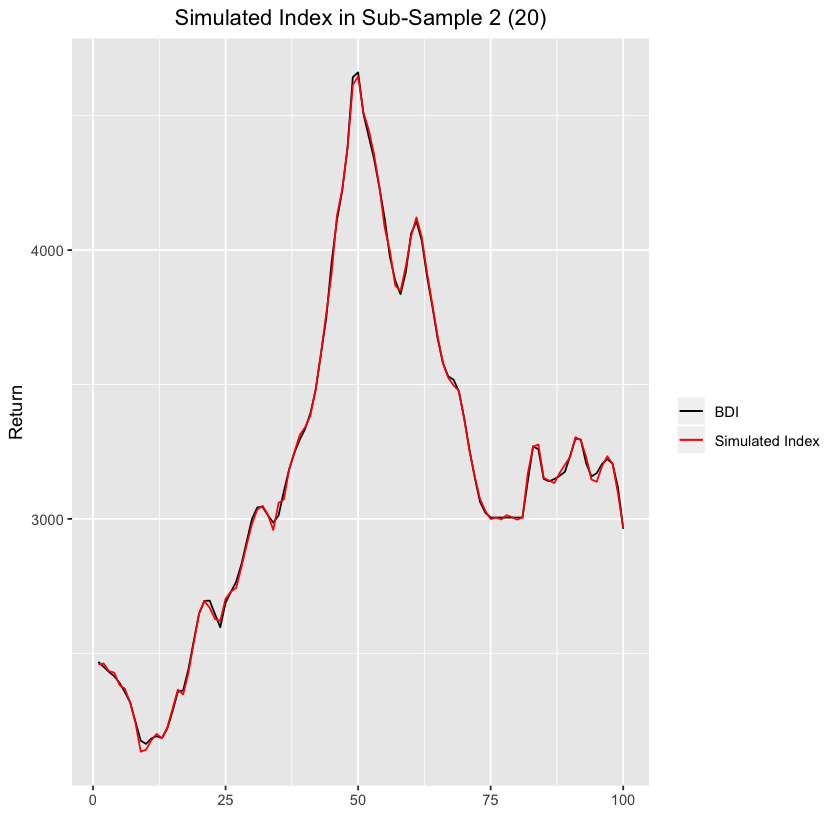

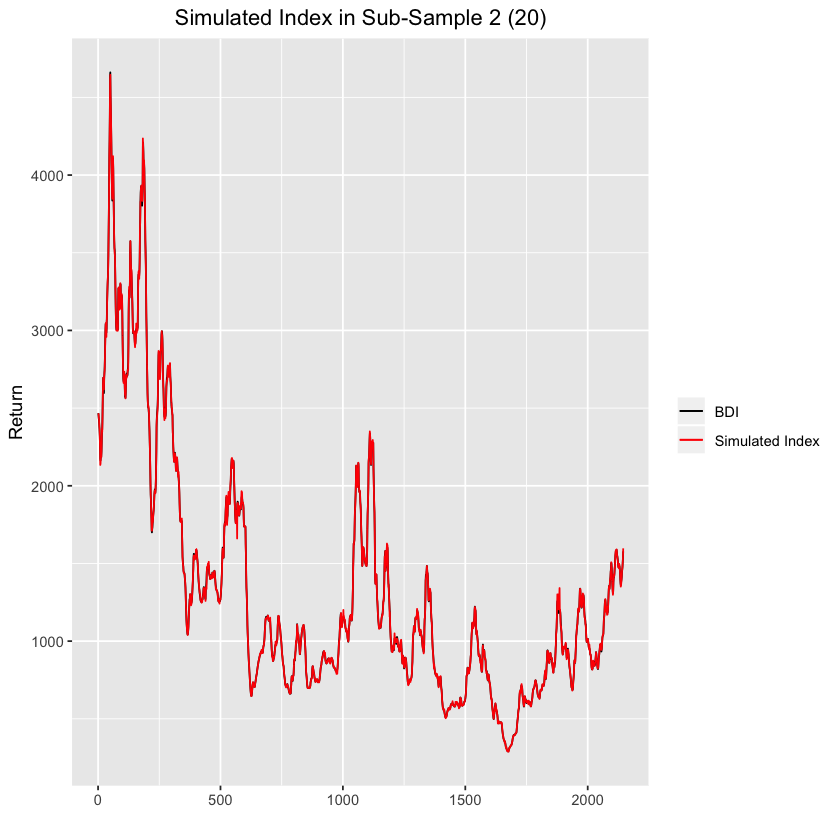

In [19]:
os6 <- list()
ossummary6 <- list()
oscoef6 <- list()
ossr6 <- list()
ossri6 <- list()
ospr6 <- list()
osts6 <- list()
ostr6 <- list()
v.int6 <- list()
oscorr6 <- list()
oscori6 <- list()
oscort6 <- list()
oscortt6 <- list()
p.stab6 <- list()
s.p.stab6 <- list()
pv6 <- list()
osdf6 <- list()

rbp6 <- rbp5
for(i in 1:4) {
    x <- i * 5
    la <- list()
    lb <- list()
    lc <- list()
    for(j in 1:length(rbp6)) {
        ind.r.data <- paste0("r.data$", n.r.data, "[((rbp6[j]-tp):(rbp6[j]-1))-x]",sep = " ", collapse = "+")
        dep <- paste0("r.data[(rbp6[j]-tp)",":(rbp6[j]-1),n]")
        la[[j]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
        lb[[j]] <- summary(la[[j]])
        lc[[j]] <- la[[j]]$coefficients[-1]
    }
    os6[[i]] <- la
    ossummary6[[i]] <- lb
    oscoef6[[i]] <- lc
}

for(i in 1:4) {
    x <- i * 5
    rbpc6 <- c(rbp6, (dim(r.data)[1]+1))
    list.s <- list()
    for(j in 1:length(n.r.data)) {
        store <- NULL
        for(k in 1:(length(rbpc6)-1)) {
            store <- c(store, oscoef6[[i]][[k]][j]*r.data.rb[rbpc6[k]:(rbpc6[k+1]-1),j])
            }
        list.s[[j]] <- store
    }
    ossr6[[i]] <- list.s
    names(ossr6[[i]]) <- n.r.data
}

for(i in 1:4) {
    x <- i * 5
    ospr6[[i]] <- apply(X = as.matrix(as.data.frame(ossr6[[i]])), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
    ostr6[[i]] <- sd(ospr6[[i]] - r.data[rbp6[1]:dim(r.data)[1],n])
    p.stab6[[i]] <- lm(formula = r.data[rbp6[1]:dim(r.data)[1],n] ~ ospr6[[i]])
    s.p.stab6[[i]] <- summary(p.stab6[[i]])
    pv6[[i]] <- pv1 <- 2*pt(-abs((s.p.stab6[[i]]$coefficients[2,1]-1)/s.p.stab6[[i]]$coefficients[2,2]), df = s.p.stab6[[i]]$df[2])
    osdf6[[i]] <- data.frame(Order = 1:length((sub2+tp+20):dim(r.data)[1]), BDI.Return = r.data[(sub2+tp+20):dim(r.data)[1],n], Portfolio.Return = ospr6[[i]], BDI = sBDI.csv[(sub2+tp+20):dim(r.data)[1]], Simulated.Index = (1+ospr6[[i]])*sBDI.csv[(sub2+tp+20):dim(r.data)[1]])
    print(ggplot(data = osdf6[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf6[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf6[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 2",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}

# Sub-Sample 2 (2003/09/01-2008/12/04)
## Contemporaneous Rolling Window Regression

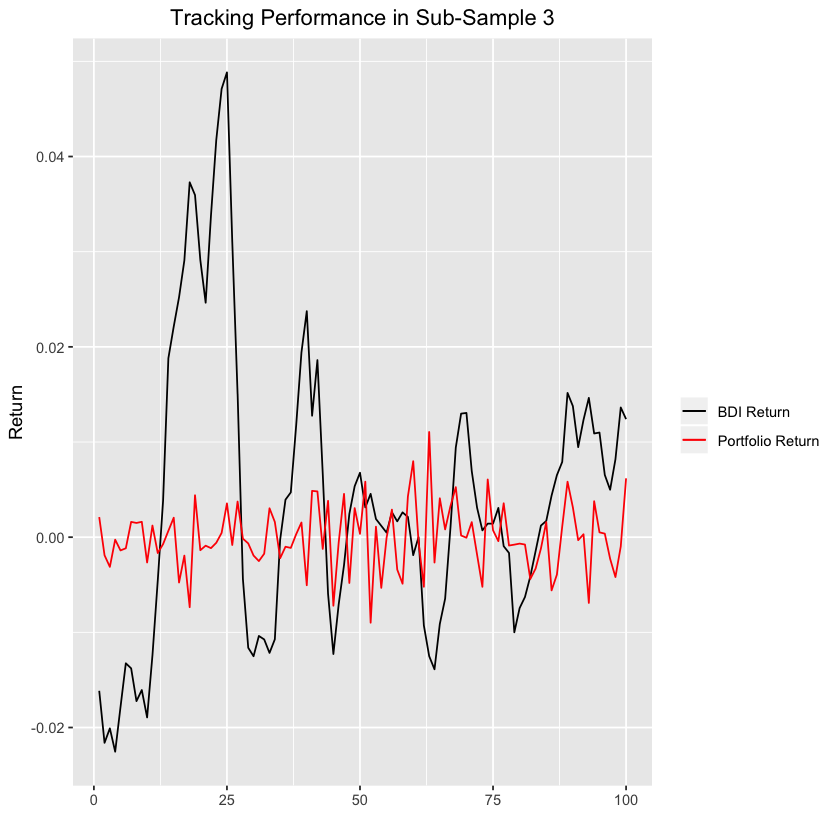

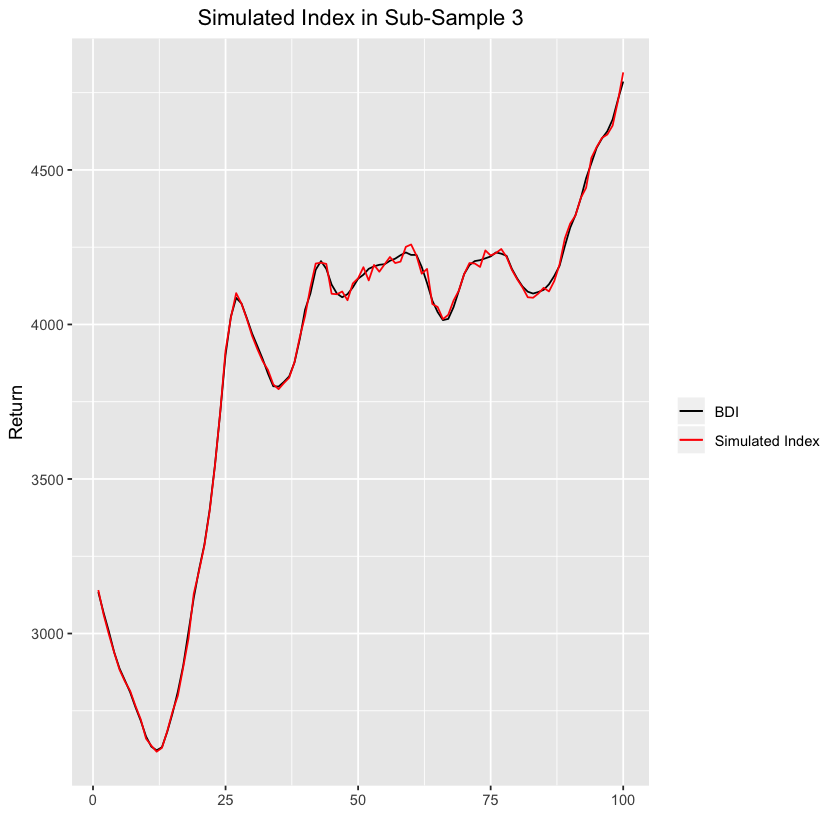

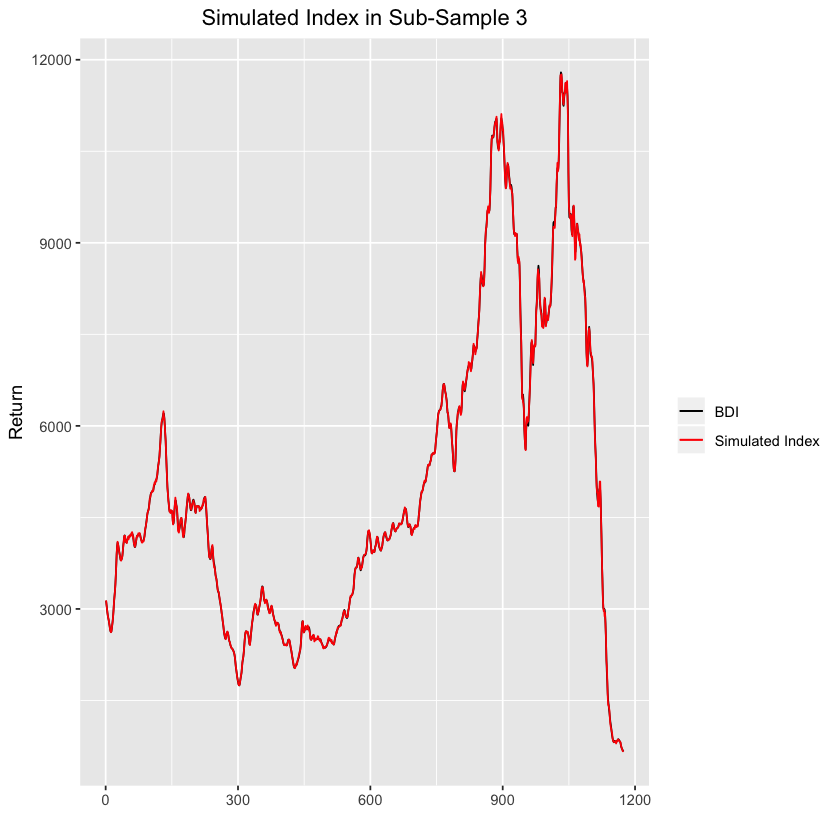

In [20]:
rbp7 <- seq(sb1+tp+20, sb2,rf)
rbpc7 <- c(rbp7, (sb2+1))
os7 <- list()
ossummary7 <- list()
oscoef7 <- list()
ossr7 <- list()
ossri7 <- NULL
v.int7 <- NULL

for(i in 1:length(rbp7)) {
    os7[[i]] <- lm(formula = BDI.csv ~ ., data = r.data[(rbp7[i]-tp):(rbp7[i]-1),])
    ossummary7[[i]] <- summary(os7[[i]])
    oscoef7[[i]] <- os7[[i]]$coefficients[-1]
}

for(i in 1:length(n.r.data)) {
    store <- NULL
    for(j in 1:(length(rbpc7)-1)) {
        store <- c(store, (oscoef7[[j]][i])*r.data.rb[rbpc7[j]:(rbpc7[j+1]-1),i])
    }
    ossr7[[i]] <- store
}
names(ossr7) <- n.r.data

ospr7 <- apply(X = as.matrix(as.data.frame(ossr7)), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
osts7 <- ospr7 - r.data[rbp7[1]:sb2,n]
ostr7 <- sd(osts7)
p.stab7 <- lm(formula = r.data[rbp7[1]:sb2,n] ~ ospr7)
s.p.stab7 <- summary(p.stab7)
pv7 <- 2*pt(-abs((s.p.stab7$coefficients[2,1]-1)/s.p.stab7$coefficients[2,2]), df = s.p.stab7$df[2])

osdf7 <- data.frame(Order = 1:length((sb1+tp+20):sb2), BDI.Return= r.data[(sb1+tp+20):sb2,n], Portfolio.Return = ospr7, BDI = sBDI.csv[(sb1+tp+20):sb2], Simulated.Index = (1+ospr7)*sBDI.csv[(sb1+tp+20):sb2])
ggplot(data = osdf7[1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle("Tracking Performance in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf7[1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))
ggplot(data = osdf7, aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle("Simulated Index in Sub-Sample 3") + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red"))

## Forecasting Rolling Window Regression

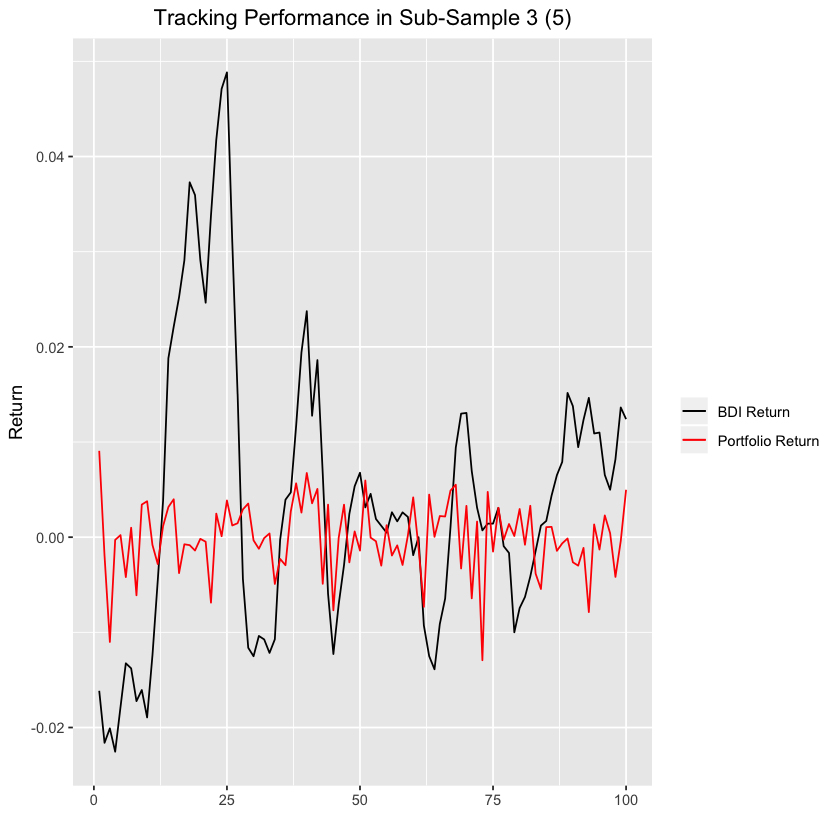

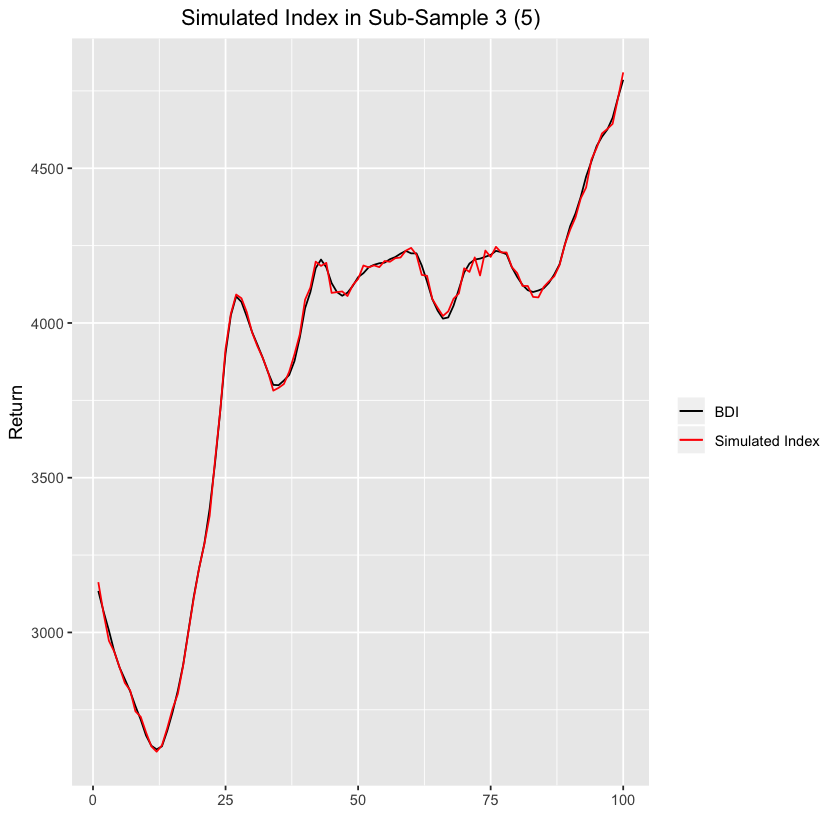

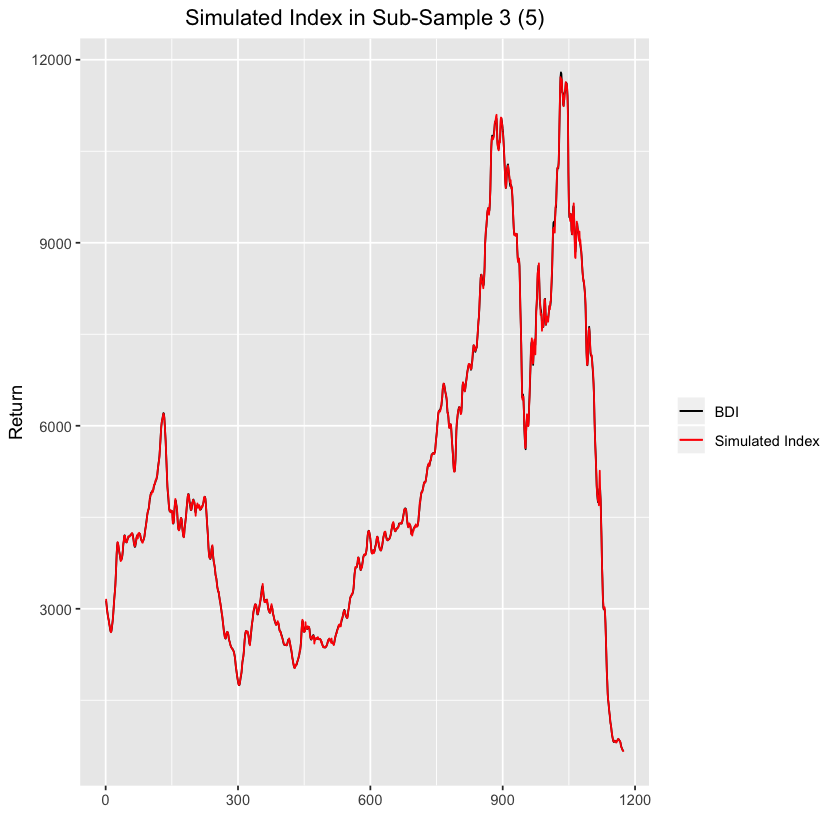

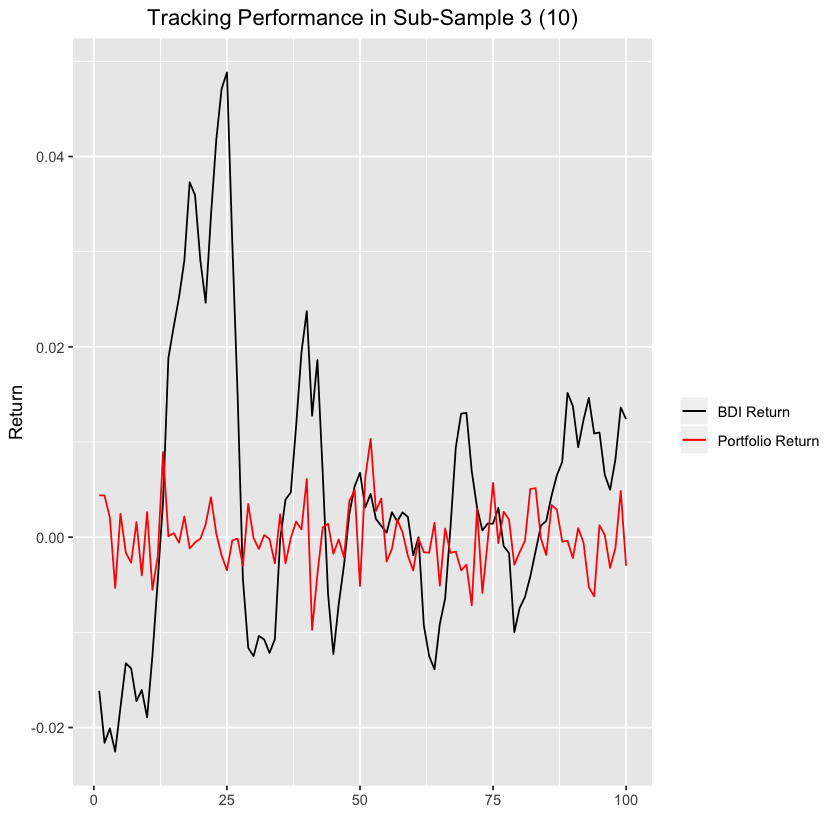

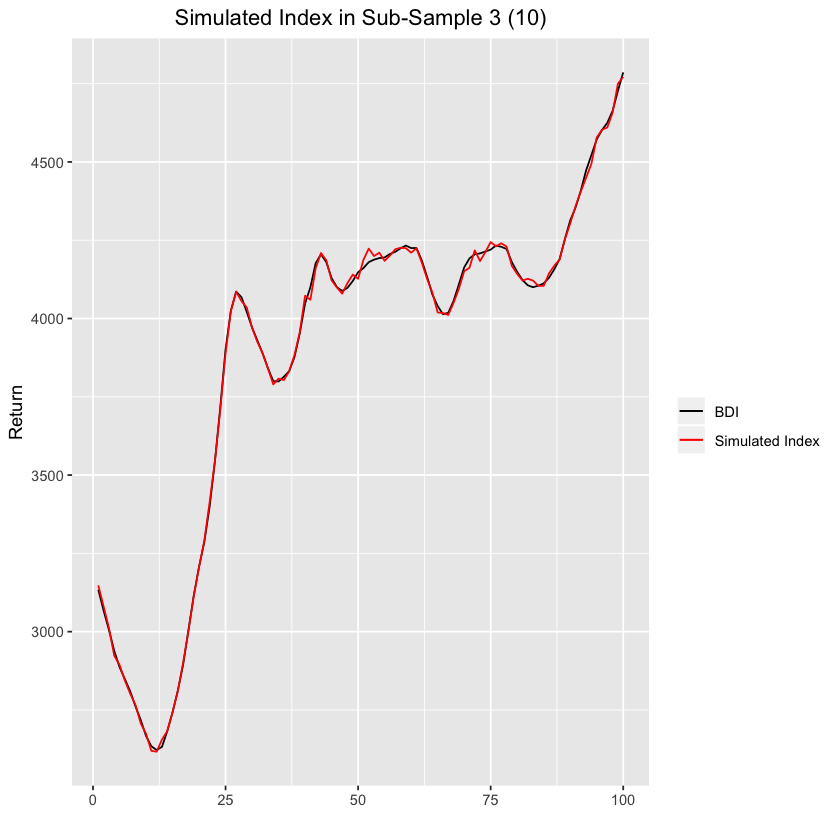

...

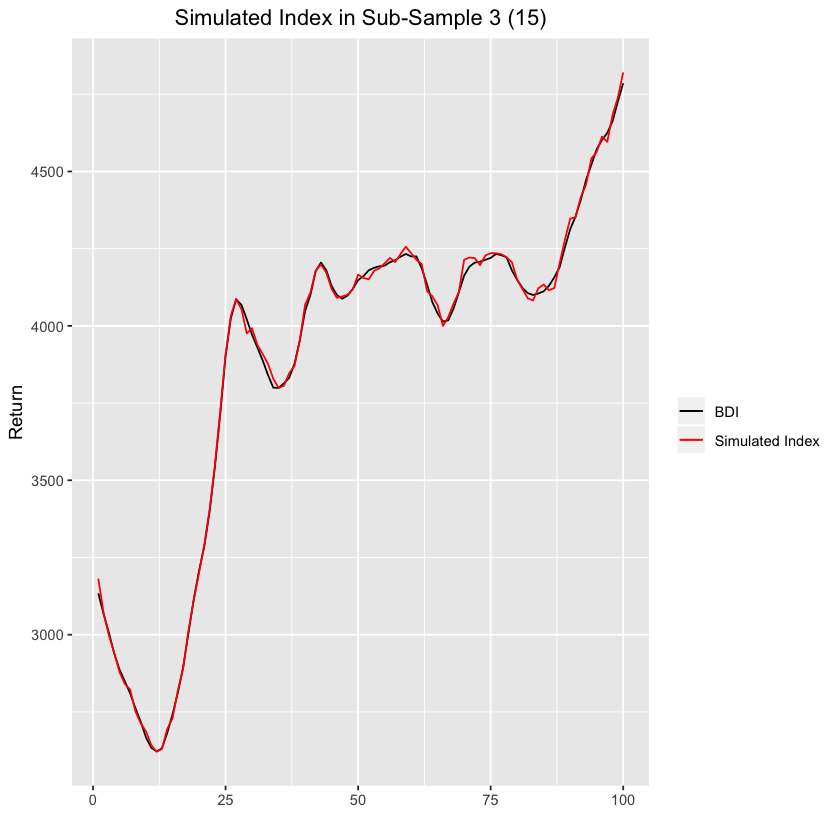

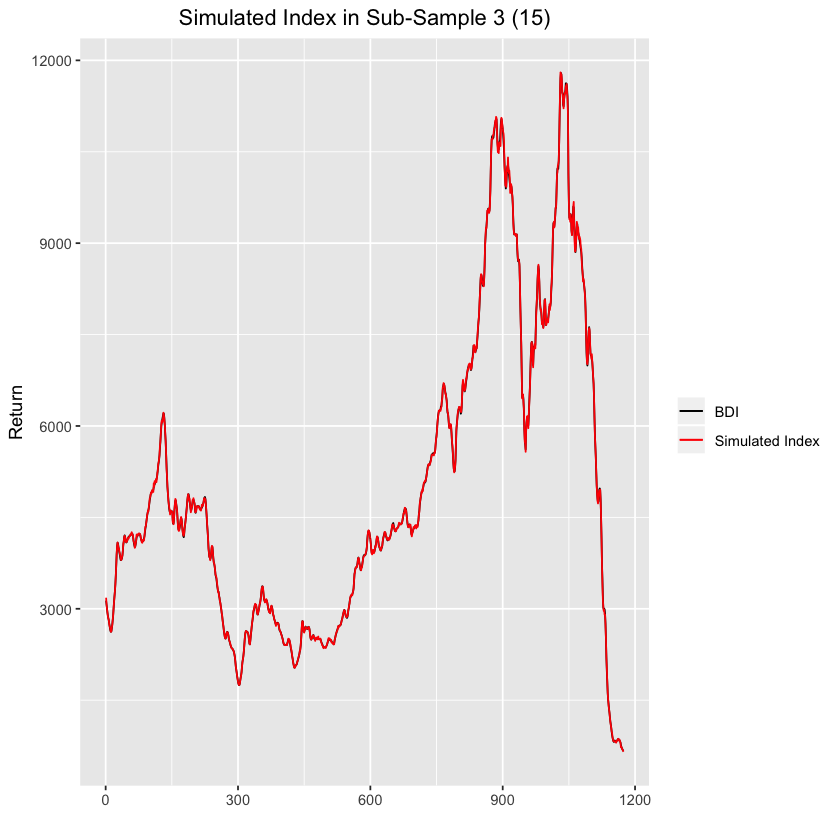

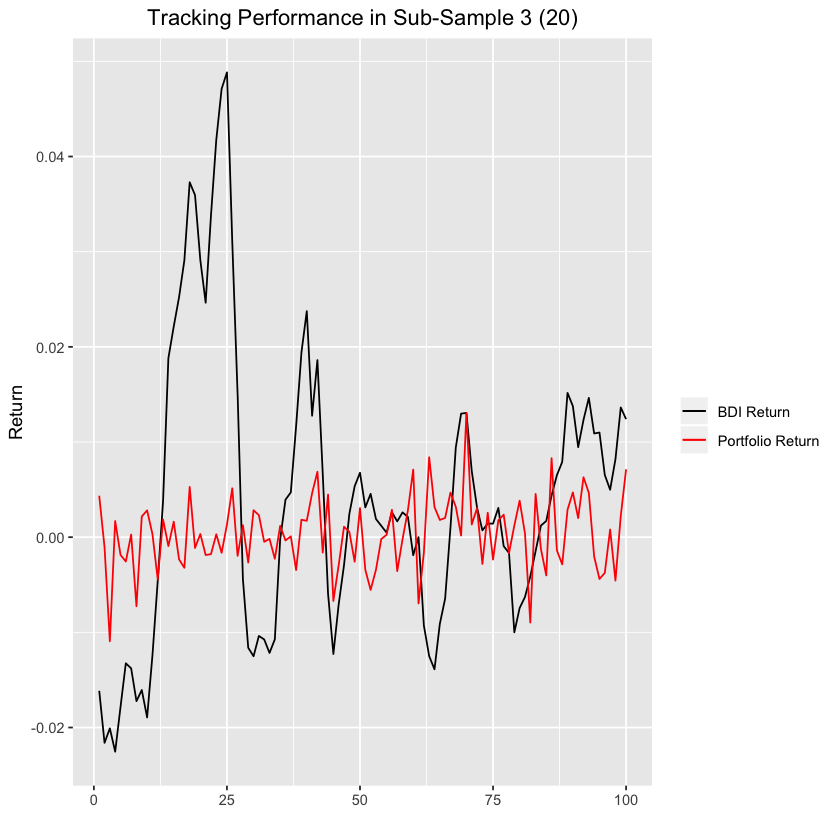

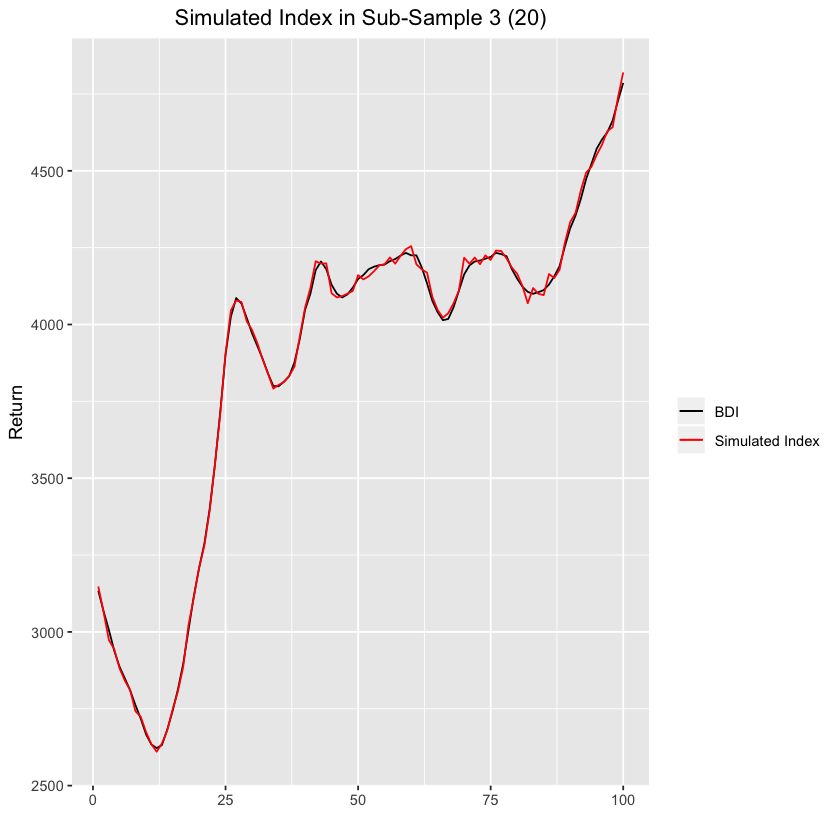

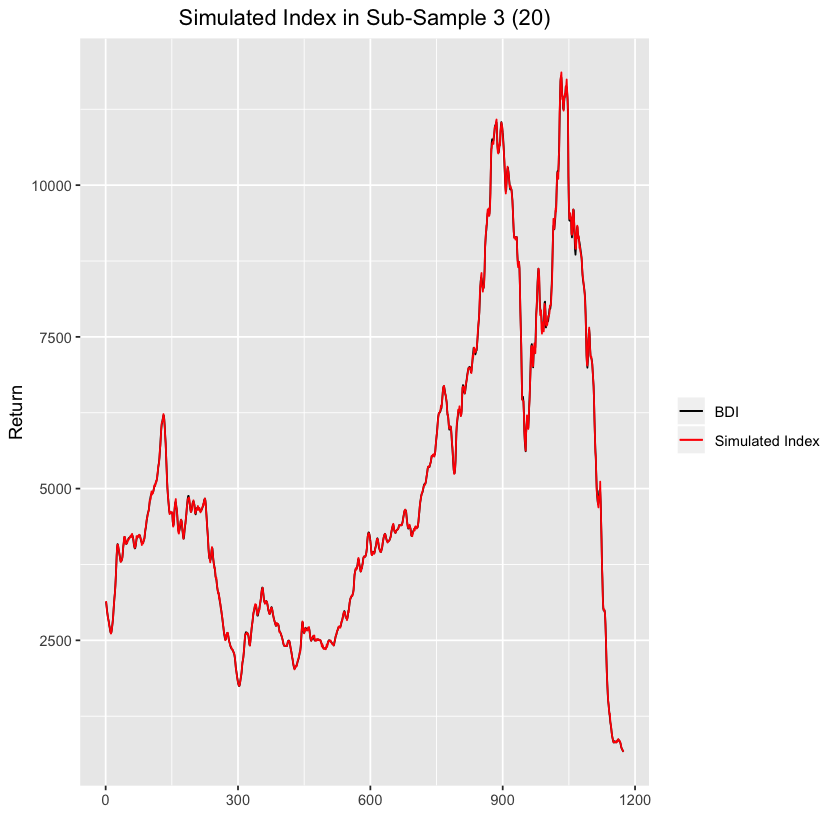

In [21]:
os8 <- list()
ossummary8 <- list()
oscoef8 <- list()
ossr8 <- list()
ossri8 <- list()
ospr8 <- list()
osts8 <- list()
ostr8 <- list()
v.int8 <- list()
oscorr8 <- list()
oscori8 <- list()
oscort8 <- list()
oscortt8 <- list()
p.stab8 <- list()
s.p.stab8 <- list()
pv8 <- list()
osdf8 <- list()

rbp8 <- rbp7
for(i in 1:4) {
    x <- i * 5
    la <- list()
    lb <- list()
    lc <- list()
    for(j in 1:length(rbp8)) {
        ind.r.data <- paste0("r.data$", n.r.data, "[((rbp8[j]-tp):(rbp8[j]-1))-x]",sep = " ", collapse = "+")
        dep <- paste0("r.data[(rbp8[j]-tp)",":(rbp8[j]-1),n]")
        la[[j]] <- lm(as.formula(paste(dep, ind.r.data, sep = "~")))
        lb[[j]] <- summary(la[[j]])
        lc[[j]] <- la[[j]]$coefficients[-1]
    }
    os8[[i]] <- la
    ossummary8[[i]] <- lb
    oscoef8[[i]] <- lc
}

for(i in 1:4) {
    x <- i * 5
    rbpc8 <- c(rbp8, (sb2+1))
    list.s <- list()
    for(j in 1:length(n.r.data)) {
        store <- NULL
        for(k in 1:(length(rbpc8)-1)) {
            store <- c(store, oscoef8[[i]][[k]][j]*r.data.rb[rbpc8[k]:(rbpc8[k+1]-1),j])
            }
    list.s[[j]] <- store
    }
    ossr8[[i]] <- list.s
    names(ossr8[[i]]) <- n.r.data
}

for(i in 1:4) {
    x <- i * 5
    ospr8[[i]] <- apply(X = as.matrix(as.data.frame(ossr8[[i]])), MARGIN = 1, FUN = function(x) sum(x, na.rm = T))
    osts8[[i]] <- ospr8[[i]] - r.data[rbp8[1]:sb2,n]
    ostr8[[i]] <- sd(osts8[[i]])
    p.stab8[[i]] <- lm(formula = r.data[rbp8[1]:sb2,n] ~ ospr8[[i]])
    s.p.stab8[[i]] <- summary(p.stab8[[i]])
    pv8[[i]] <- 2*pt(-abs((s.p.stab8[[i]]$coefficients[2,1]-1)/s.p.stab8[[i]]$coefficients[2,2]), df = s.p.stab8[[i]]$df[2])
    osdf8[[i]] <- data.frame(Order = 1:length((sb1+tp+20):sb2), BDI.Return = r.data[(sb1+tp+20):sb2,n], Portfolio.Return = ospr8[[i]], BDI = sBDI.csv[(sb1+tp+20):sb2], Simulated.Index = (1+ospr8[[i]])*sBDI.csv[(sb1+tp+20):sb2])
    print(ggplot(data = osdf8[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI.Return, colour = "BDI Return")) + geom_line(aes(y = Portfolio.Return, colour = "Portfolio Return")) + ggtitle(paste("Tracking Performance in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf8[[i]][1:100,], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
    print(ggplot(data = osdf8[[i]], aes(Order)) + geom_line(aes(y = BDI, colour = "BDI")) + geom_line(aes(y = Simulated.Index, colour = "Simulated Index")) + ggtitle(paste("Simulated Index in Sub-Sample 3",paste0( "(", x, ")"))) + theme(plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("Return") + scale_colour_manual(name = "", values=c("black", "red")))
}